In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
from tqdm import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython
import pandas as pd
import scipy
import numpy as np
import itertools
import xarray as xr
from scipy.stats import spearmanr

sc.settings.figdir=os.path.expanduser('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/de_mts/neu')
sc._settings.settings._vector_friendly=True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import antipode

gs1=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102,name='godsnot_102')
try:
    matplotlib.colormaps.register(name='godsnot_102',cmap=gs1)
except:
    pass


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is not available


In [2]:
table_dir = '/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/anno_tables/RNA'

In [3]:
batch_key='load_name'
species_key='organism'
donor_key='donor_id'
layer_key=None
leaf_key='Group_propagated'
MDE_KEY = "X_umap_species_integrated"
sex_key = "self_reported_sex"

In [4]:
adata = sc.read("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/xspecies/BasalGanglia/HMBA_Human_Macaque_Marmoset_Mouse_snRNA-seq_BG_neuron_alignment_labeltransfer_allgenes.h5ad")

In [5]:
groups = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/anno_tables/consensus_annotation_groups.tsv',header=None)[0]
groups = groups[groups.isin(adata.obs[leaf_key].unique())]
adata.obs[leaf_key] = adata.obs[leaf_key].cat.reorder_categories(groups)
adata.obs['Group'] = adata.obs[leaf_key].cat.reorder_categories(groups)

In [6]:
adata.obs[species_key] = adata.obs[species_key].astype('category')
species_colors = {'Human':'#377eb8','Macaque':'#4daf4a','Marmoset':'#FF5F5D','Mouse':'#ffa300'}
adata.uns[f'{species_key}_colors'] = [species_colors[x] for x in adata.obs[species_key].cat.categories]

In [7]:
# adata.obs[sex_key] = adata.obs[sex_key].astype(str)
# adata.obs.loc[adata.obs[species_key]=='Marmoset',sex_key] = adata.obs.loc[adata.obs[species_key]=='Marmoset','donor_id']
# adata.obs.loc[adata.obs[species_key]=='Marmoset',sex_key]
# adata.obs['donor_id'].replace({'cjCroissant':'male','cjNutmeg':'male','cjJellybean':'female','cjRambo':'female'})
# adata.obs[sex_key] = adata.obs[sex_key].replace({'cjCroissant':'male','cjNutmeg':'male','cjJellybean':'female','cjRambo':'female'}).astype('string')

In [8]:
adata.obs['sex'] = adata.obs[sex_key].astype(str).str.lower().astype('category')
sex_key = 'sex'

In [9]:
adata.obs[sex_key] = adata.obs[sex_key].astype('category')
sex_colors = {'male':'#ADC4C3','female':'#565353'}
adata.uns[f'{sex_key}_colors'] = [sex_colors[x] for x in adata.obs[sex_key].cat.categories]

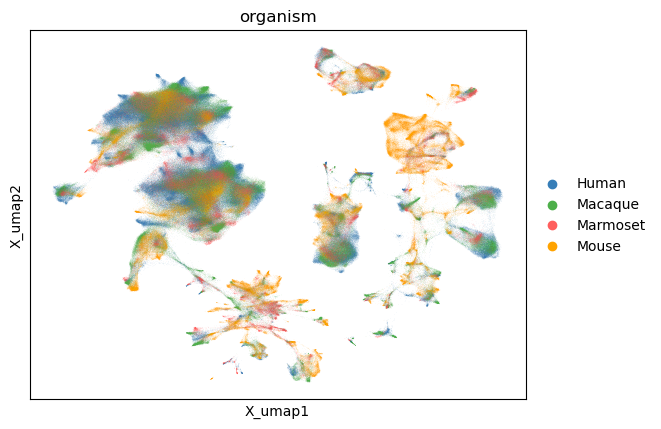

In [10]:
sc.pl.embedding(adata,color=species_key,basis='X_umap',save="species_mouse.pdf")

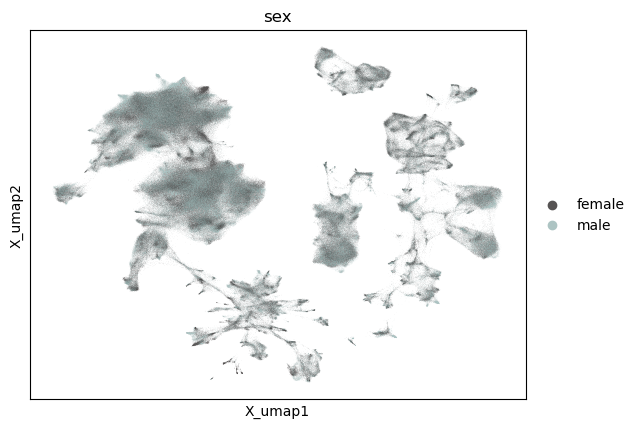

In [11]:
sc.pl.embedding(adata,color=sex_key,basis='X_umap',save="sex_mouse.pdf")

In [12]:
colors = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/anno_tables/Group_colors.txt',header=None,sep='\t')
adata.uns['Group_color_dict'] = dict(zip(colors[0],colors[1]))
adata.uns['Group_colors'] = [adata.uns['Group_color_dict'].get(x,"#777777") for x in adata.obs['Group'].cat.categories]
adata.uns['Group_propagated_colors'] = [adata.uns['Group_color_dict'].get(x,"#777777") for x in adata.obs['Group_propagated'].cat.categories]

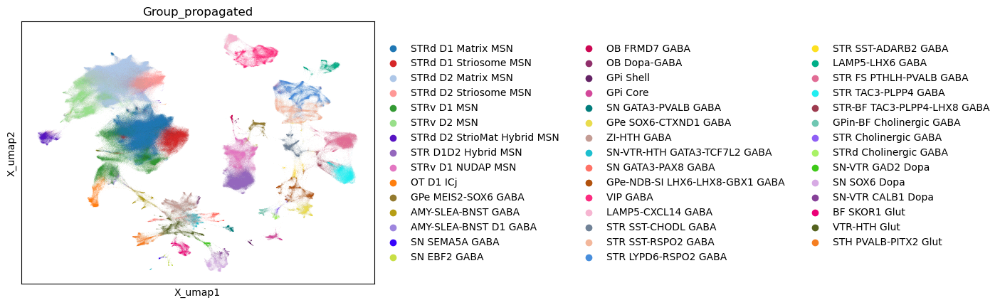

In [13]:
sc.pl.embedding(adata,color=leaf_key,basis='X_umap',save="group_propagated_mouse.pdf")

In [14]:
def distribute_evenly(a, k):
    n = len(a)
    r = [0] * n

    # first pass
    avg = k // n
    for i in range(n):
        r[i] = min(a.iloc[i], avg)

    remaining = k - sum(r)

    # second pass
    while remaining > 0:
        updates = 0
        for i in range(n):
            if r[i] < a.iloc[i]:
                potential_add = min(a.iloc[i] - r[i],
                                    remaining // (n - updates))
                if potential_add > 0:
                    r[i] += potential_add
                    remaining -= potential_add
                    updates += 1
                    if remaining == 0:
                        break
        if updates == 0:
            break

    return r


def select_k_cells(adata, obs_column, k,replace=False):
    a = adata.obs[obs_column].value_counts()
    categories = a.index

    r = distribute_evenly(a,k)
    
    inds=[]
    for i,cat in enumerate(categories):
        cat_cells = adata.obs.index[adata.obs[obs_column] == cat].tolist()
        inds.append(np.random.choice(cat_cells, size=r[i], replace=replace))
    selected_indices=[item for sublist in inds for item in sublist]
    return adata[selected_indices,:]

In [15]:
if not os.path.exists(os.path.join(table_dir, "species_group_means_hqrm.netcdf")):
    # Get real means and xero proportions
    log_real_means,real_mean_levels=antipode.model_functions.get_real_leaf_means(adata,species_key,leaf_key,layer=layer_key)
    real_means=pd.DataFrame(log_real_means.mean(0),columns=adata.var.index,index=real_mean_levels[leaf_key])
    real_means=real_means.loc[real_mean_levels[leaf_key],:]
    aggr_zeros=antipode.model_functions.group_aggr_anndata(adata,[species_key,leaf_key],layer=layer_key,agg_func=antipode.model_functions.prop_zeros,normalize=True)
    
    coords = {species_key:list(adata.obs[species_key].cat.categories),leaf_key:list(adata.obs[leaf_key].cat.categories),'var':list(adata.var.index.astype(str))}
    lrm = xr.DataArray(log_real_means,coords=coords)
    az = xr.DataArray(aggr_zeros[0],coords=coords)
    ads = xr.Dataset({'scalars':lrm,'proportions':az})
    ads.to_netcdf(os.path.join(table_dir, "species_group_means_hqrm.netcdf"), engine="scipy")
else:
    ads = xr.open_dataset(os.path.join(table_dir, "species_group_means_hqrm.netcdf"), engine="scipy")

In [16]:
if not os.path.exists(os.path.join(table_dir, "sex_group_means_hqrm.netcdf")):
    log_real_means,real_mean_levels=antipode.model_functions.get_real_leaf_means(adata,'sex',leaf_key,layer=layer_key)
    real_means=pd.DataFrame(log_real_means.mean(0),columns=adata.var.index,index=real_mean_levels[leaf_key])
    real_means=real_means.loc[real_mean_levels[leaf_key],:]
    aggr_zeros=antipode.model_functions.group_aggr_anndata(adata,['sex',leaf_key],layer=layer_key,agg_func=antipode.model_functions.prop_zeros,normalize=True)
    
    coords = {'sex':list(adata.obs['sex'].cat.categories),leaf_key:list(adata.obs[leaf_key].cat.categories),'var':list(adata.var.index.astype(str))}
    lrm = xr.DataArray(log_real_means,coords=coords)
    az = xr.DataArray(aggr_zeros[0],coords=coords)
    sads = xr.Dataset({'scalars':lrm,'proportions':az})
    sads.to_netcdf(os.path.join(table_dir, "sex_group_means_hqrm.netcdf"), engine="scipy")
else:
    sads = xr.open_dataset(os.path.join(table_dir, "sex_group_means_hqrm.netcdf"), engine="scipy")

In [17]:
def _rgg_df_all_groups(ads, groupby, key="rank_genes_groups"):
    try:
        # works in newer Scanpy
        return sc.get.rank_genes_groups_df(ads, None, key=key)
    except TypeError:
        # older Scanpy: must request one group at a time
        frames = []
        for g in list(ads.obs[groupby].cat.categories):
            try:
                df_g = sc.get.rank_genes_groups_df(ads, g, key=key)
                frames.append(df_g)
            except KeyError:
                continue
        if not frames:
            return pd.DataFrame(columns=["names","group","scores"])
        return pd.concat(frames, ignore_index=True)

def conserved_logreg_markers(
    adata,
    groupby="Group",
    species_key="organism_name",
    method="logreg",
    layer=None,
    use_raw=False,
    min_cells_per_group=5,
    top_k=25,
    normalize=False,
    backed=False
):
    if not pd.api.types.is_categorical_dtype(adata.obs[groupby]):
        adata.obs[groupby] = adata.obs[groupby].astype("category")
    group_levels = list(adata.obs[groupby].cat.categories)
    species_levels = sorted(pd.Index(adata.obs[species_key]).unique())
    genes = adata.var_names.to_list()
    
    species_score_mats = {}
    for sp in species_levels:
        print(sp)
        counts = adata.obs.loc[adata.obs[species_key] == sp][groupby].value_counts()
        keep_groups = counts[counts >= min_cells_per_group].index.tolist()
        if len(keep_groups) < 2:
            species_score_mats[sp] = pd.DataFrame(np.nan, index=genes, columns=group_levels)
            continue
        ads = adata[(adata.obs[groupby].isin(keep_groups))&(adata.obs[species_key] == sp)]
        if normalize:
            sc.pp.normalize_total(ads,layer=layer)
            sc.pp.log1p(ads,layer=layer)

        sc.tl.rank_genes_groups(
            ads,
            groupby=groupby,
            method=method,
            n_genes=ads.n_vars,
            layer=layer,
            use_raw=use_raw
        )

        df = _rgg_df_all_groups(ads, groupby, key="rank_genes_groups")
        if df.empty:
            scmat = pd.DataFrame(np.nan, index=genes, columns=group_levels)
        else:
            scmat = (df.pivot(index="names", columns="group", values="scores")
                       .reindex(index=genes, columns=group_levels))
        species_score_mats[sp] = scmat

    data = np.stack([species_score_mats[sp].to_numpy().T for sp in species_levels], axis=0)
    da = xr.DataArray(
        data,
        coords={species_key: species_levels, groupby: group_levels, "var": genes},
        dims=(species_key, groupby, "var"),
        name=f"{method}_score"
    )

    conserved_da = da.min(dim=species_key, skipna=True)
    conserved_df = pd.DataFrame(
        conserved_da.transpose("var", groupby).values,
        index=genes,
        columns=group_levels
    )

    top_genes = None
    if top_k is not None:
        top_genes = {
            g: conserved_df[g].dropna().sort_values(ascending=False).head(top_k)
            for g in group_levels
        }

    return da, conserved_df, top_genes

# ---- usage ----
# da_scores: xarray (species, group, gene) of logreg scores
# conserved_df: DataFrame (gene × group) of per-gene min across species
# top_genes: dict[group] -> top_k Series of conserved genes
if not os.path.exists(os.path.join(table_dir, "log_reg_markers.netcdf")):
    da_scores, conserved_df, top_genes = conserved_logreg_markers(
        adata, groupby=leaf_key, species_key="organism", layer=None, use_raw=False, top_k=30,normalize=True, # adata[np.random.choice(adata.obs.index,size=10000,replace=False),:]
    )
    da_scores.to_netcdf(os.path.join(table_dir,'log_reg_markers.netcdf'))
else:
    da_scores = xr.open_dataset(os.path.join(table_dir,'log_reg_markers.netcdf'))['logreg_score']



In [18]:
top_k = 5
da = xr.open_dataset('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/anno_tables/RNA/log_reg_markers.netcdf')['logreg_score']
conserved_da = da.min(dim=species_key, skipna=True) # can add .sel({'organism':['Human','Macaque','Marmoset']}) to do just primate (but looks the sameish)
conserved_df = pd.DataFrame(
    conserved_da.transpose("var", leaf_key).values,
    index=conserved_da['var'].data,
    columns=conserved_da.coords[leaf_key].data
)

top_genes = None
if top_k is not None:
    top_genes = {
        g: list(conserved_df[g].dropna().sort_values(ascending=False).head(top_k).index)
        for g in conserved_da.coords[leaf_key].data
    }


In [19]:
top_genes

{'STRd D1 Matrix MSN': ['EBF1', 'RELN', 'TAC1', 'PCDH9', 'DRD1'],
 'STRd D1 Striosome MSN': ['RELN', 'TAC1', 'SORCS1', 'HS6ST3', 'LINGO2'],
 'STRd D2 Matrix MSN': ['DRD2', 'PENK', 'CHRM3', 'PTPRM', 'ADORA2A'],
 'STRd D2 Striosome MSN': ['DRD2', 'PENK', 'CHRM3', 'FIG4', 'KCNK2'],
 'STRv D1 MSN': ['FOXP2', 'EBF1', 'LINGO2', 'DRD1', 'DCC'],
 'STRv D2 MSN': ['PENK', 'DRD2', 'PTPRM', 'UNC5D', 'SGCZ'],
 'STRd D2 StrioMat Hybrid MSN': ['DACH1',
  'PTPRT',
  'BACH2',
  'ZNF804A',
  'GRIK3'],
 'STR D1D2 Hybrid MSN': ['FOXP2', 'ADARB2', 'ALK', 'KCNT2', 'GALNTL6'],
 'STRv D1 NUDAP MSN': ['FOXP2', 'ERBB4', 'ZNF804B', 'TSHZ1', 'MEIS2'],
 'OT D1 ICj': ['FOXP2', 'GRM1', 'GPR149', 'HTR4', 'RASGRP1'],
 'GPe MEIS2-SOX6 GABA': ['SOX6', 'MEIS2', 'ADARB2', 'NXPH1', 'FOXP2'],
 'AMY-SLEA-BNST GABA': ['ZFHX3', 'MEIS2', 'SORCS1', 'EBF1', 'PCDH7'],
 'AMY-SLEA-BNST D1 GABA': ['ZNF804B', 'PCDH11X', 'FIGN', 'FOXP2', 'ARHGAP6'],
 'SN SEMA5A GABA': ['DACH2', 'CADPS2', 'SEMA5A', 'ERBB4', 'SLIT2'],
 'SN EBF2 GABA': ['

In [20]:
super_markers = {'STRd D1 Matrix MSN': ['DRD1','EBF1'],
 'STRd D1 Striosome MSN': [],
 'STRd D2 Matrix MSN': ['DRD2', 'ADORA2A'],
 'STRd D2 Striosome MSN': [],
 'STRv D1 MSN': [],
 'STRv D2 MSN': [],
 'STRd D2 StrioMat Hybrid MSN': ['BACH2','GRIK3'],
 'STR D1D2 Hybrid MSN': ['FOXP2', 'CASZ1'],
 'STRv D1 NUDAP MSN': ['TSHZ1'],
 'OT D1 ICj': ['DRD3'],
 'GPe MEIS2-SOX6 GABA': ['MEIS2', 'SOX6'],
 'AMY-SLEA-BNST GABA': ['ZFHX3'],
 'AMY-SLEA-BNST D1 GABA': ['PCDH11X', 'ARHGAP6'],
 'SN SEMA5A GABA': ['SEMA5A'],
 'SN EBF2 GABA': ['EBF2'],
 'OB FRMD7 GABA': ['FRMD7'],
 'OB Dopa-GABA': ['SCGN','SP8','ETV1'],
 'GPi Shell': ['MEIS1'],
 'GPi Core': ['LUZP2', 'PVALB'],
 'SN GATA3-PVALB GABA': ['GATA3'],
 'GPe SOX6-CTXND1 GABA': ['CPNE4'],
 'ZI-HTH GABA': ['PAX6','ISL1','ZFHX4'],
 'SN-VTR-HTH GATA3-TCF7L2 GABA': ['TCF7L2'],
 'SN GATA3-PAX8 GABA': ['PAX5'],
 'GPe-NDB-SI LHX6-LHX8-GBX1 GABA': ['GBX1','CNTN3'],
 'VIP GABA': ['VIP'],
 'LAMP5-CXCL14 GABA': ['LAMP5'],
 'STR SST-CHODL GABA': ['CHODL'],
 'STR SST-RSPO2 GABA': ['LHX6','RSPO2'],
 'STR LYPD6-RSPO2 GABA': [],
 'STR SST-ADARB2 GABA': ['ADARB2'],
 'LAMP5-LHX6 GABA': [],
 'STR FS PTHLH-PVALB GABA': ['CRABP1', 'PTHLH'],
 'STR TAC3-PLPP4 GABA': ['TAC3'],
 'STR-BF TAC3-PLPP4-LHX8 GABA': ['LHX8'],
 'GPin-BF Cholinergic GABA': ['CHAT', 'SPHKAP'],
 'STR Cholinergic GABA': ['MEGF10'],
 'STRd Cholinergic GABA': ['TRPC3'],
 'SN-VTR GAD2 Dopa': ['TH','DDC','SLC18A2','GAD2','NTNG1'],
 'SN SOX6 Dopa': ['PITX3'],
 'SN-VTR CALB1 Dopa': ['CALB1'],
 'BF SKOR1 Glut': ['SKOR1'],
 'VTR-HTH Glut': ['SLC17A6'],
 'STH PVALB-PITX2 Glut': ['PITX2']}


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


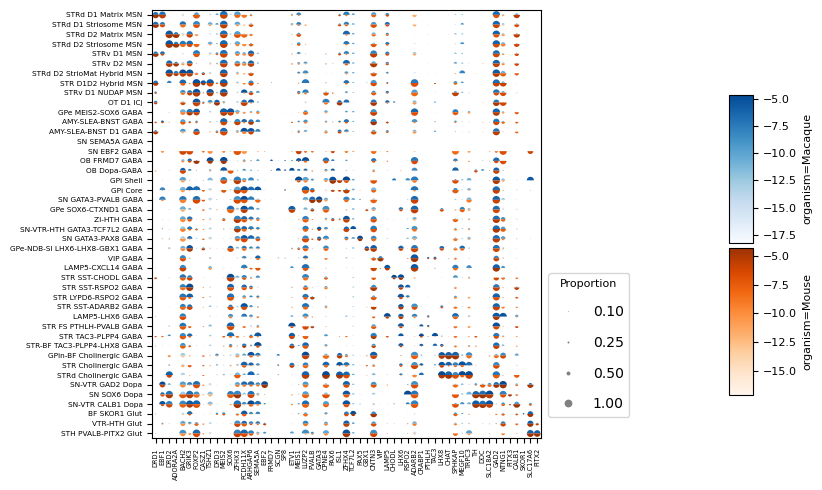

In [25]:
logreg_markers = [super_markers[x][:5] for x in da_scores.coords[leaf_key].data]
logreg_markers = list(itertools.chain(*logreg_markers))
gene_order = logreg_markers
antipode.plotting.pie_dotplot_xr(ads.sel(organism=['Macaque','Mouse'],var=gene_order),row_dim=leaf_key,col_dim='var',slice_dim=species_key,
      scale_by='column', max_radius=0.4, figsize=(8, 5),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
plt.savefig(os.path.join(sc.settings.figdir, 'qm_conserved_marker_dots.pdf'), format='pdf')
plt.show()

In [37]:
xsxqwqczar 369  3307rewtyw
,=eemei=top_genes

{'STRd D1 Matrix MSN': ['EBF1', 'RELN', 'TAC1', 'PCDH9', 'DRD1'],
 'STRd D1 Striosome MSN': ['RELN', 'TAC1', 'SORCS1', 'HS6ST3', 'LINGO2'],
 'STRd D2 Matrix MSN': ['DRD2', 'PENK', 'CHRM3', 'PTPRM', 'ADORA2A'],
 'STRd D2 Striosome MSN': ['DRD2', 'PENK', 'CHRM3', 'FIG4', 'KCNK2'],
 'STRv D1 MSN': ['FOXP2', 'EBF1', 'LINGO2', 'DRD1', 'DCC'],
 'STRv D2 MSN': ['PENK', 'DRD2', 'PTPRM', 'UNC5D', 'SGCZ'],
 'STRd D2 StrioMat Hybrid MSN': ['DACH1',
  'PTPRT',
  'BACH2',
  'ZNF804A',
  'GRIK3'],
 'STR D1D2 Hybrid MSN': ['FOXP2', 'ADARB2', 'ALK', 'KCNT2', 'GALNTL6'],
 'STRv D1 NUDAP MSN': ['FOXP2', 'ERBB4', 'ZNF804B', 'TSHZ1', 'MEIS2'],
 'OT D1 ICj': ['FOXP2', 'GRM1', 'GPR149', 'HTR4', 'RASGRP1'],
 'GPe MEIS2-SOX6 GABA': ['SOX6', 'MEIS2', 'ADARB2', 'NXPH1', 'FOXP2'],
 'AMY-SLEA-BNST GABA': ['ZFHX3', 'MEIS2', 'SORCS1', 'EBF1', 'PCDH7'],
 'AMY-SLEA-BNST D1 GABA': ['ZNF804B', 'PCDH11X', 'FIGN', 'FOXP2', 'ARHGAP6'],
 'SN SEMA5A GABA': ['DACH2', 'CADPS2', 'SEMA5A', 'ERBB4', 'SLIT2'],
 'SN EBF2 GABA': ['

/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


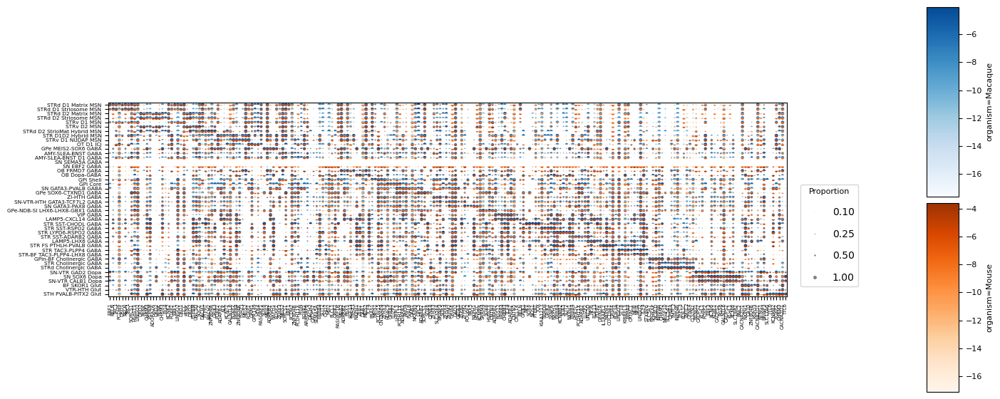

In [29]:
logreg_markers = [top_genes[x][:5] for x in da_scores.coords[leaf_key].data]
logreg_markers = list(itertools.chain(*logreg_markers))
gene_order = logreg_markers
antipode.plotting.pie_dotplot_xr(ads.sel(organism=['Macaque','Mouse'],var=gene_order),row_dim=leaf_key,col_dim='var',slice_dim=species_key,
      scale_by='column', max_radius=0.4, figsize=(15, 9),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
plt.savefig(os.path.join(sc.settings.figdir, 'triple_conserved_marker_dots.pdf'), format='pdf')
plt.show()

In [26]:
#This would only work if we fill nans for species x donors that don't align
# donor_means = antipode.model_functions.group_aggr_anndata(adata,[species_key,leaf_key,donor_key],layer=None,normalize=True)
# donor_means[1]['var'] = list(adata.var.index)
# donor_means_da = xr.DataArray(donor_means[0],dims=list(donor_means[1].keys()),coords=donor_means[1])
# vals = np.log(donor_means_da.data).flatten()
# vals = vals[~np.isinf(vals)]
# low_quantile = np.nanquantile(vals,0.001)
# donor_means_da = np.clip(np.log(donor_means_da),a_min=low_quantile,a_max=np.inf)

In [93]:
adata.X.max()

np.float64(5417.0)

Human


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


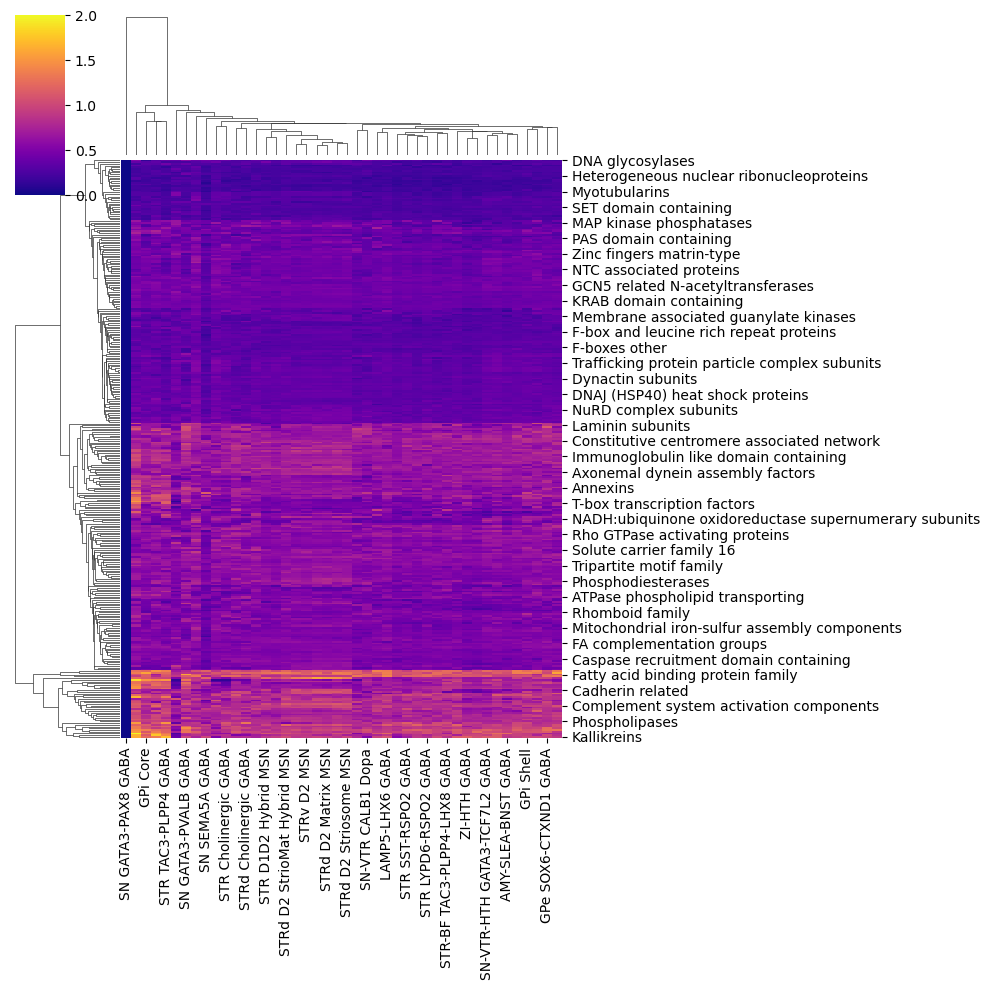

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


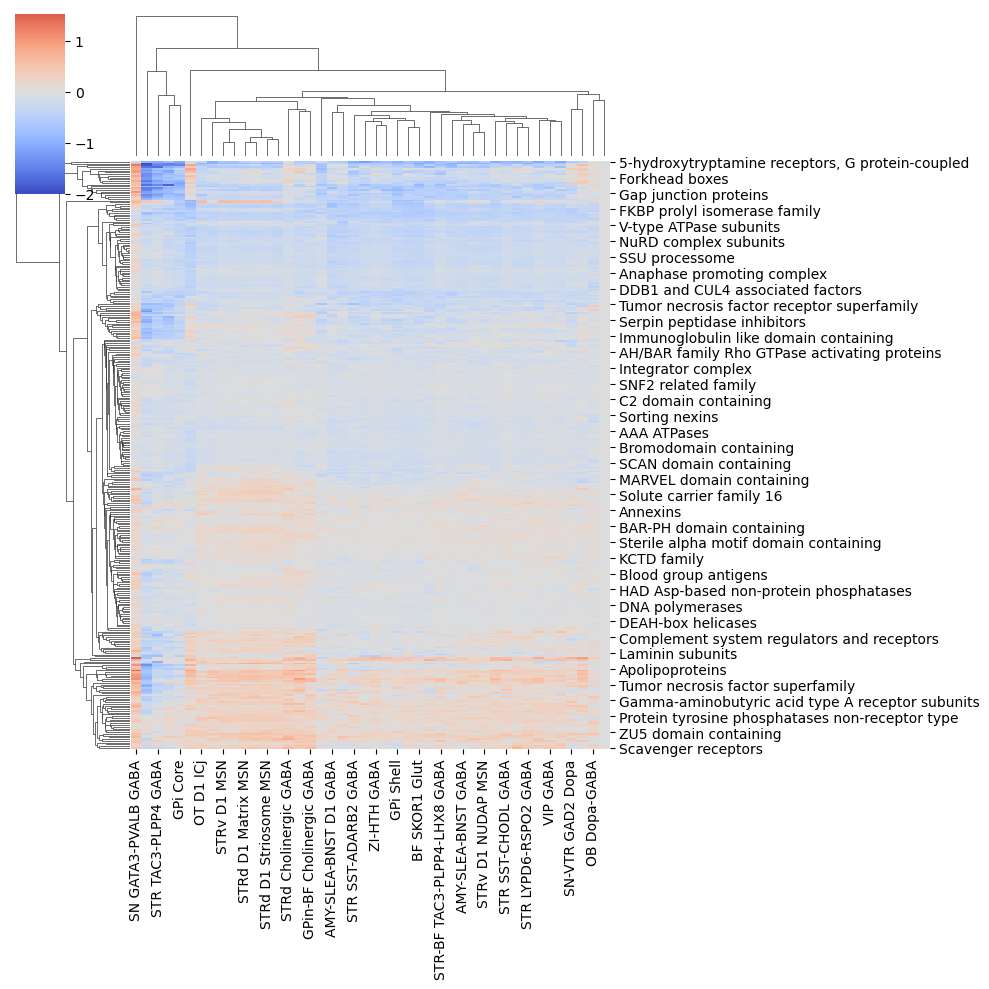

Macaque


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


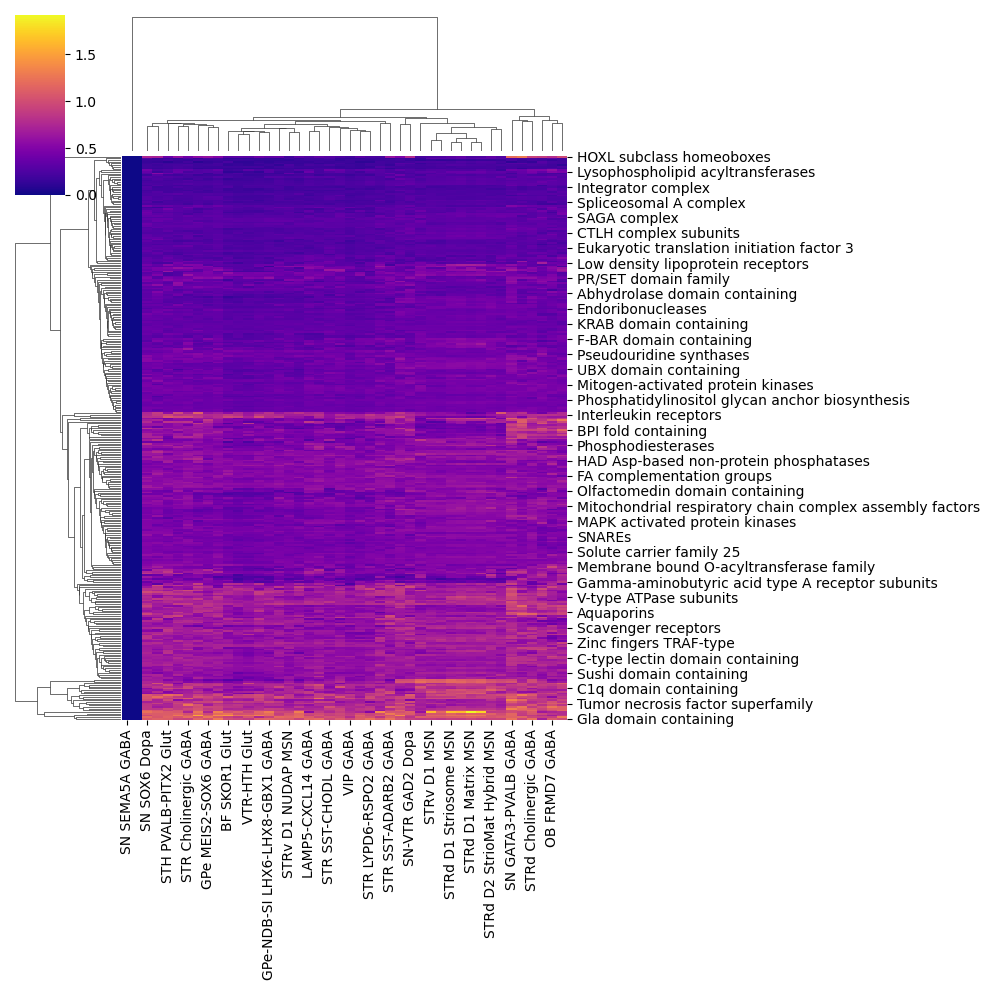

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


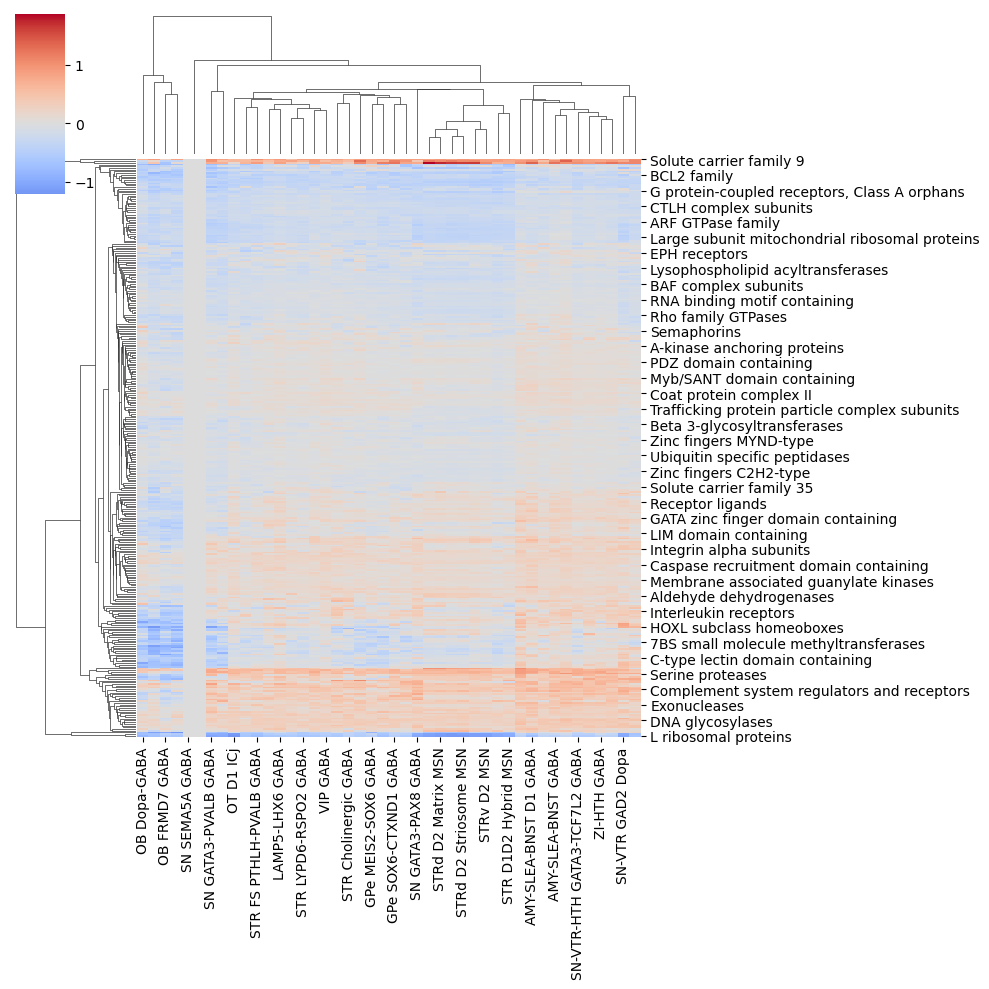

Marmoset


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


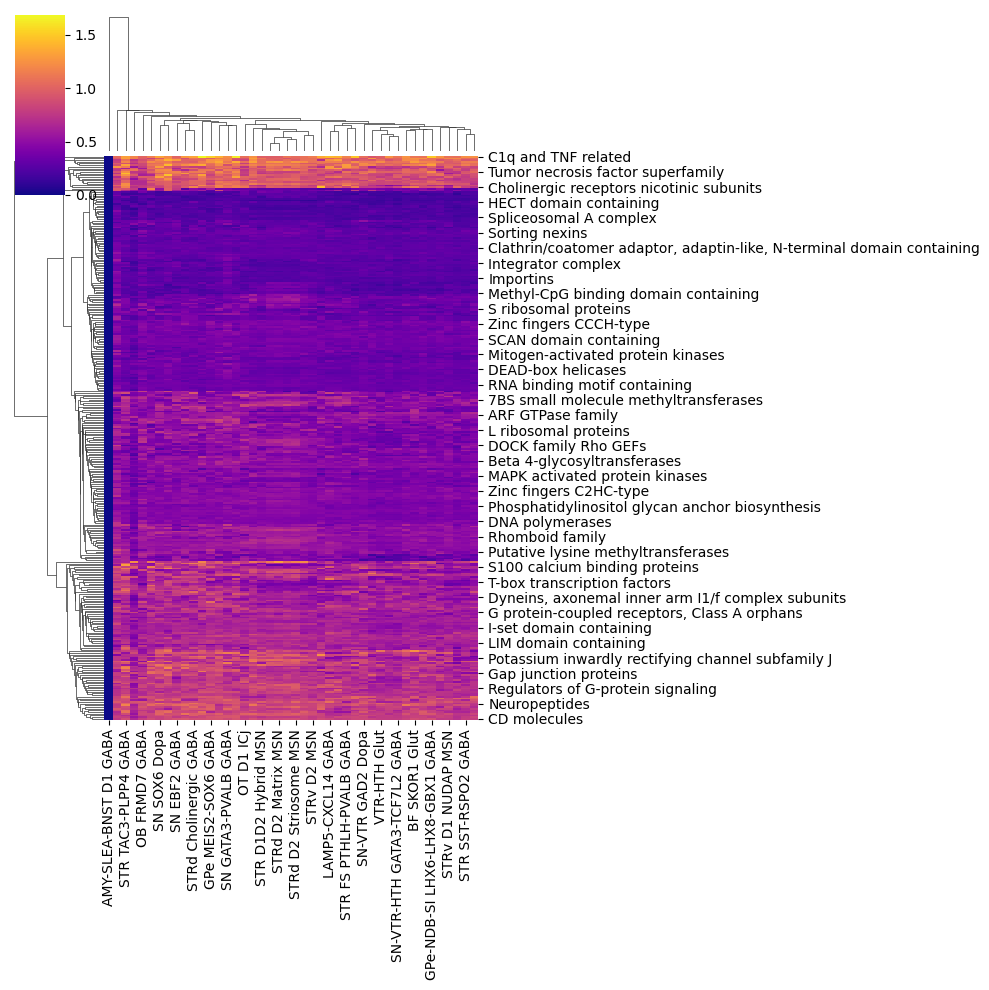

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


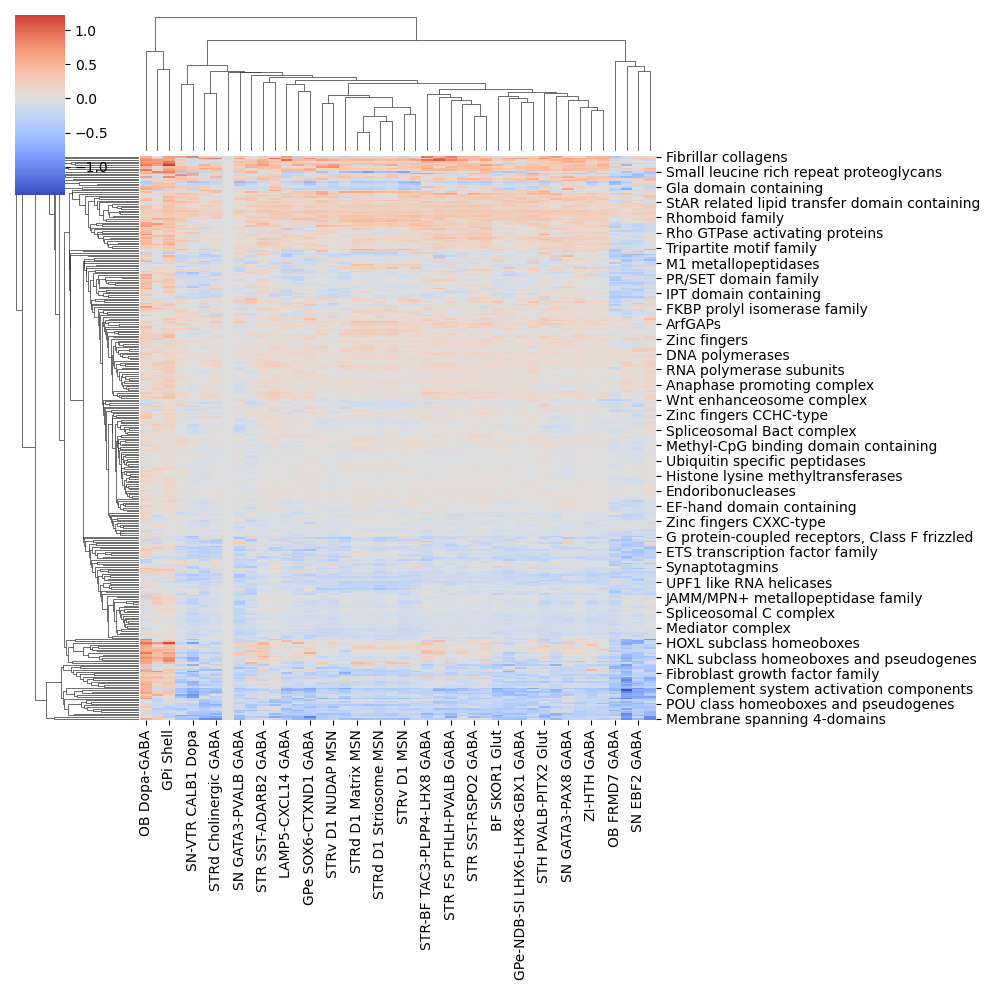

Mouse


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


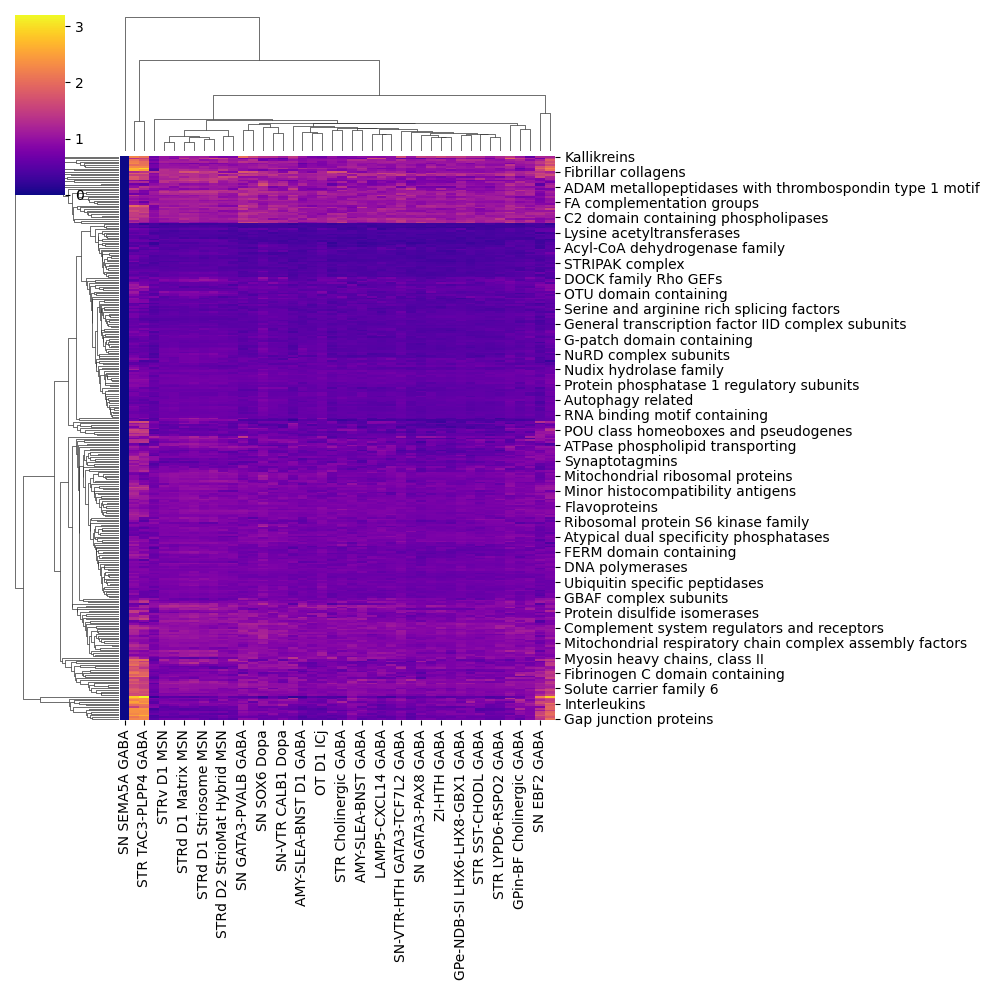

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


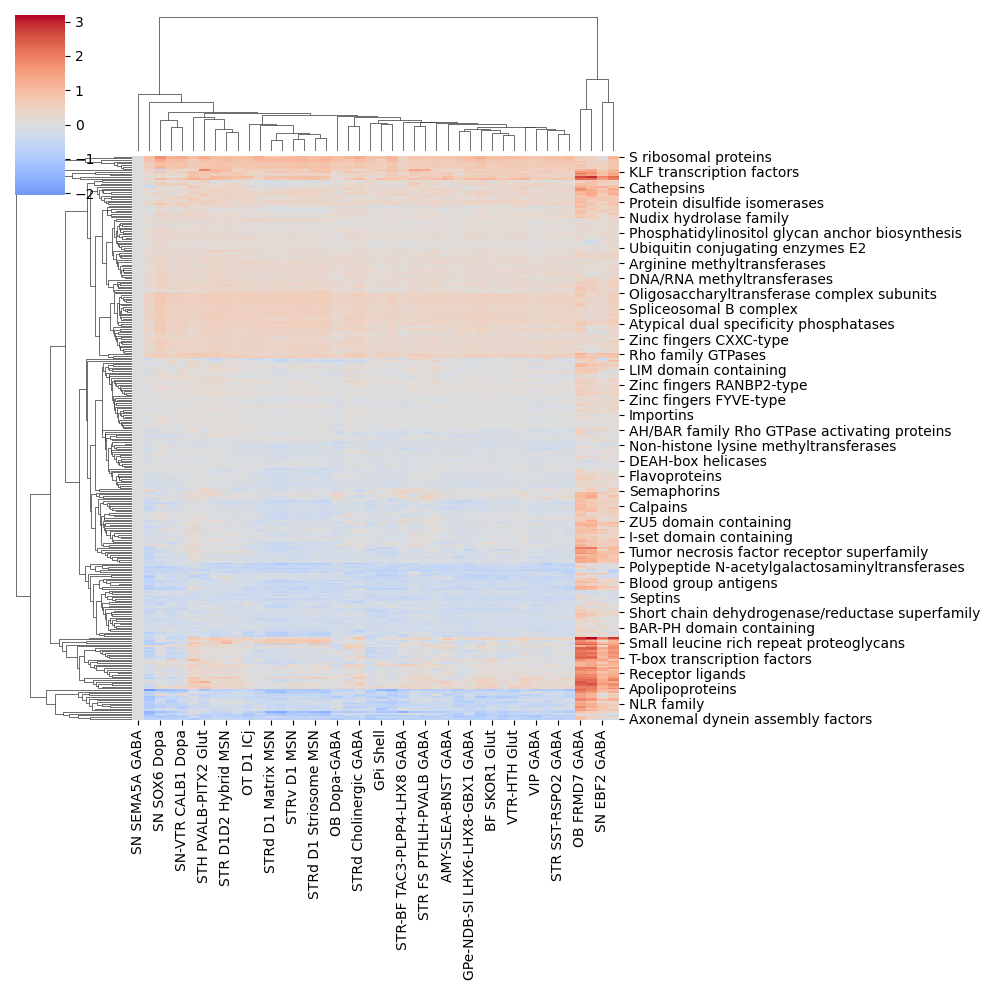

In [163]:
ads = xr.open_dataset(os.path.join(table_dir, "species_group_means_hqrm.netcdf"), engine="scipy")
lfc = (ads['scalars'] - ads['scalars'].mean(species_key)) # .sel({'organism':['Human','Macaque','Marmoset']})
mads = np.abs(lfc).mean('var').to_dataframe().unstack().droplevel(0, axis=1)

family_tab = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/gene_family/hgnc_gene_family_info.csv',sep=',')
family_tab = family_tab.loc[family_tab['symbol'].isin(adata.var.index),:]
vcs = family_tab['family_name'].value_counts()
family_tab = family_tab.loc[family_tab['family_name'].isin(vcs.index[vcs>10])]


family_dicts = {x:list(family_tab.loc[family_tab['family_name']==x,'symbol']) for x in  family_tab['family_name'].unique()}
for species in lfc.coords[species_key].data:
    print(species)
    unsigned = {}
    signed = {}
    for key,value in family_dicts.items():
        signed[key] = lfc.sel(var=value,organism=species).mean('var')
        unsigned[key] = np.abs(lfc.sel(var=value,organism=species)).mean('var')
    
    unsigned_df = pd.DataFrame(unsigned,index=lfc.coords[leaf_key].data)
    unsigned_df = unsigned_df.fillna(0)
    seaborn.clustermap(unsigned_df.T,cmap='plasma')
    plt.show()
    
    signed_df = pd.DataFrame(signed,index=lfc.coords[leaf_key].data)
    signed_df = signed_df.fillna(0)
    seaborn.clustermap(signed_df.T,cmap='coolwarm',center=0)
    plt.show()

/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


(<Figure size 1500x900 with 5 Axes>, <Axes: >)

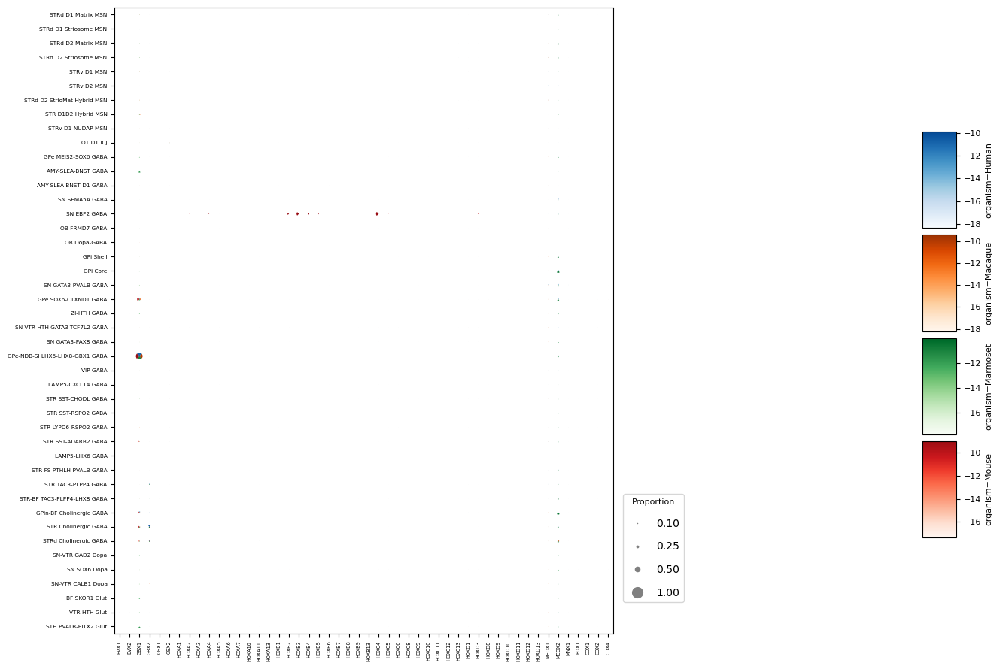

In [88]:

logreg_markers = list(family_tab.loc[family_tab['family_name'].str.contains('HOX'),'symbol'])
gene_order = logreg_markers
antipode.plotting.pie_dotplot_xr(ads.sel(var=gene_order),row_dim=leaf_key,col_dim='var',slice_dim=species_key,
      scale_by='column', max_radius=0.4, figsize=(15, 9),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
plt.show()

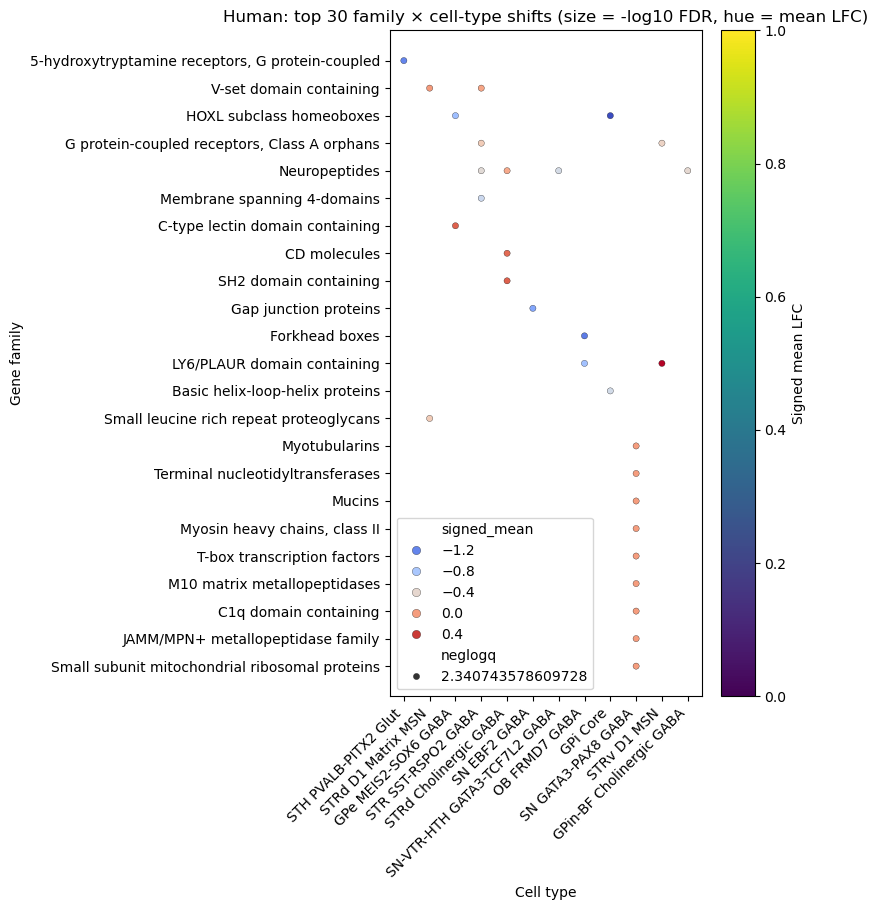

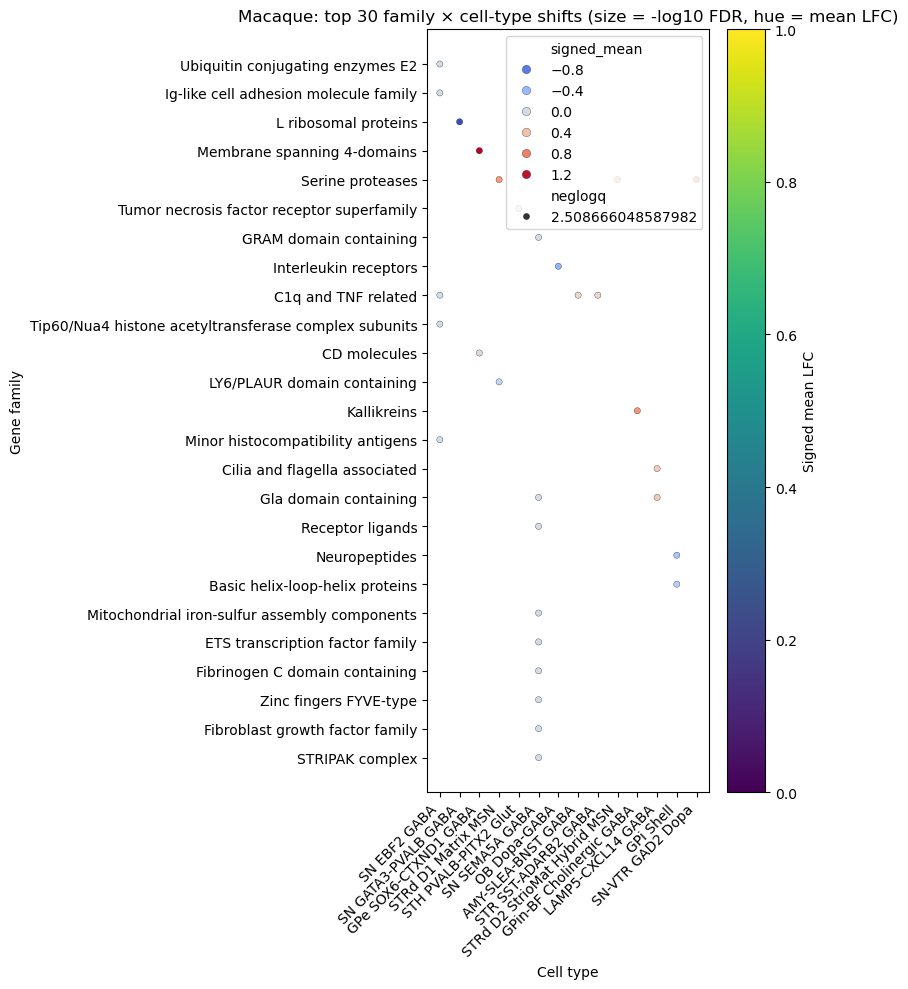

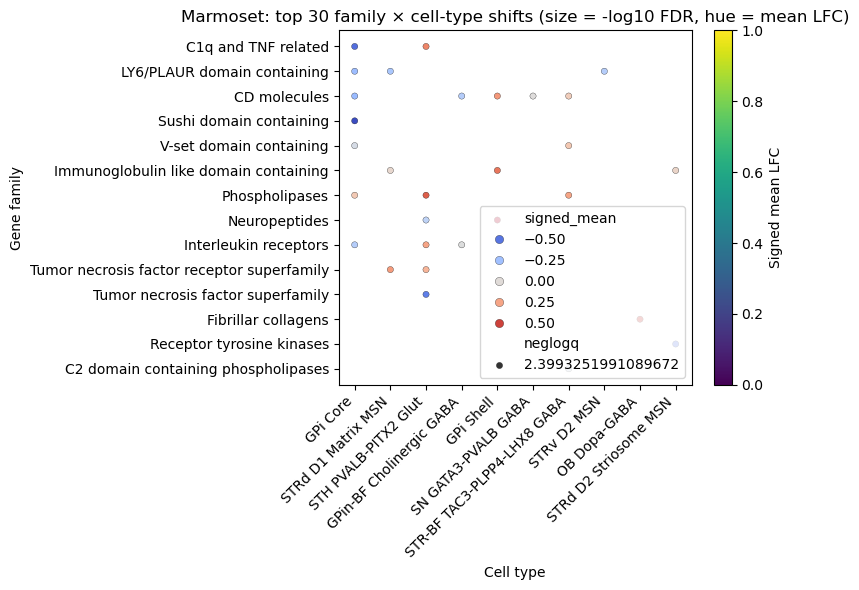

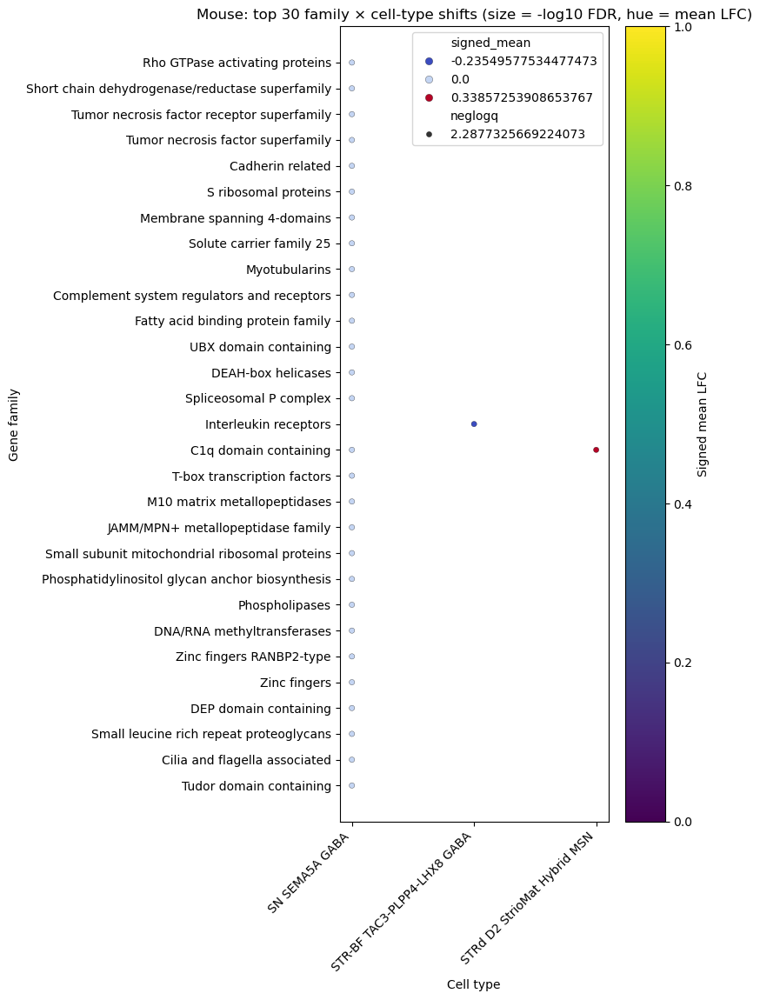

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


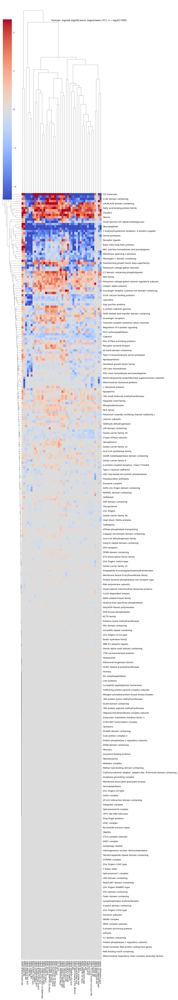

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


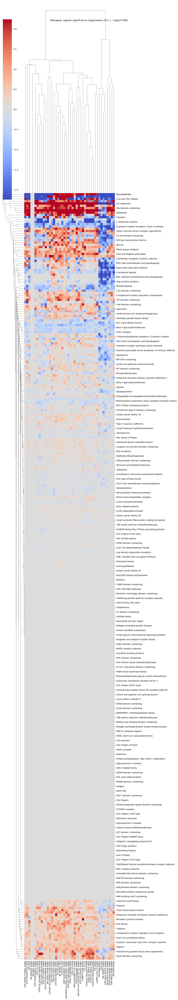

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


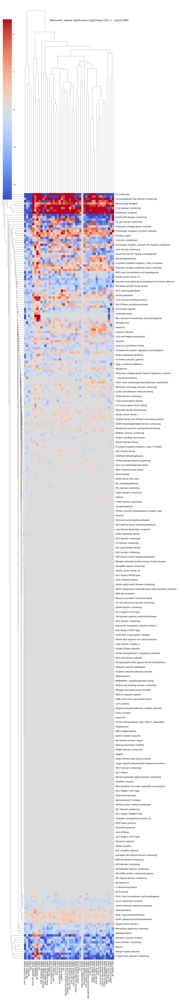

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


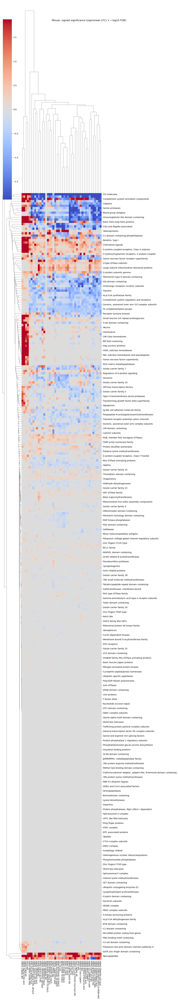

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


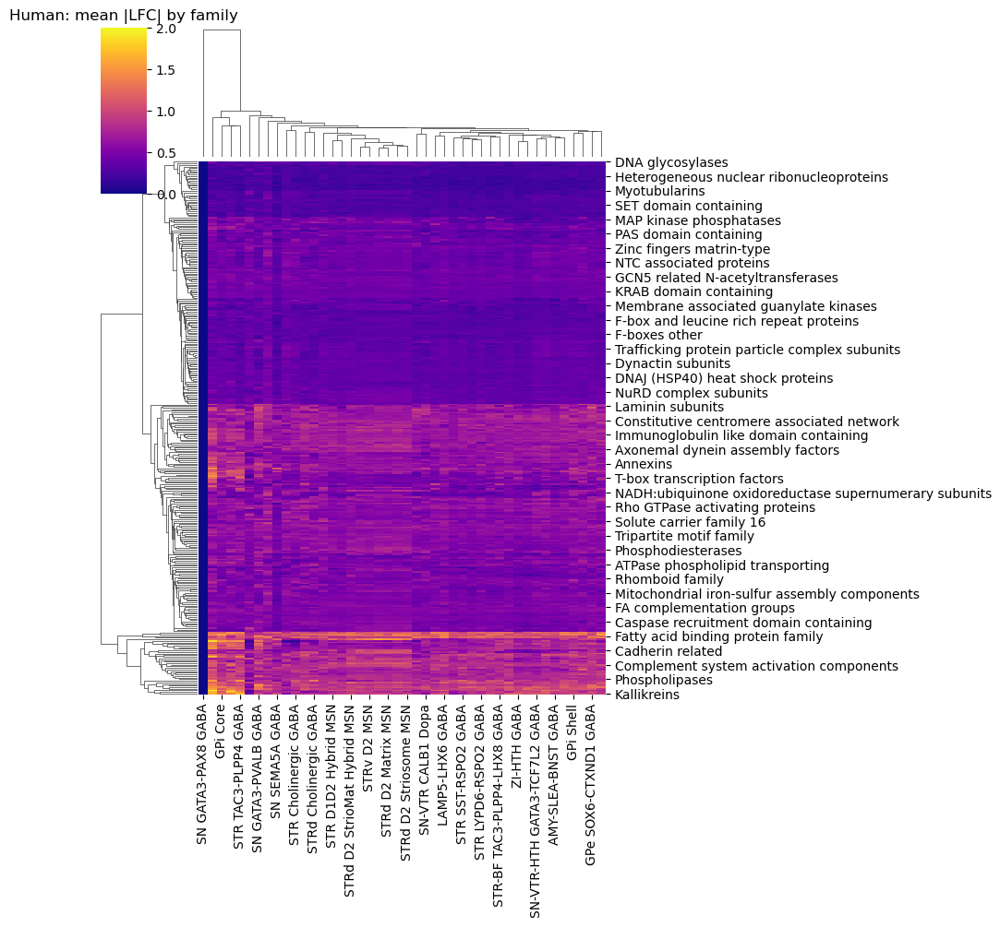

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


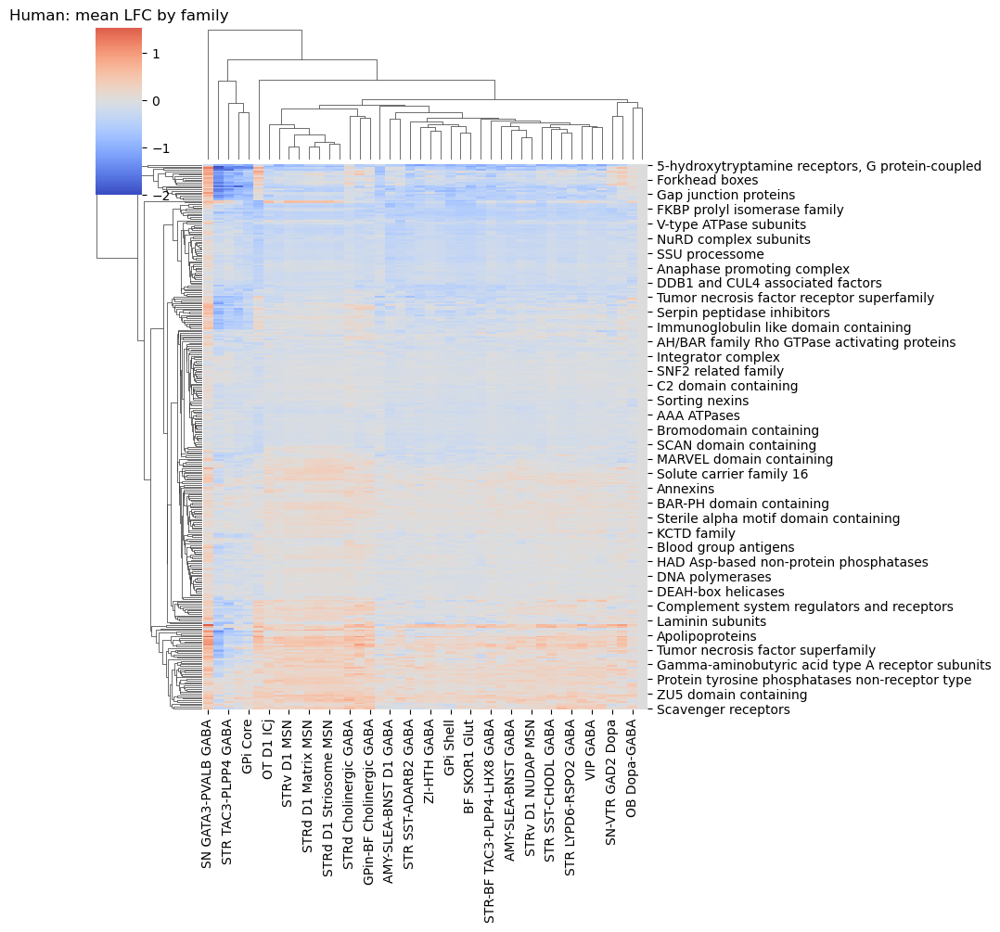

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


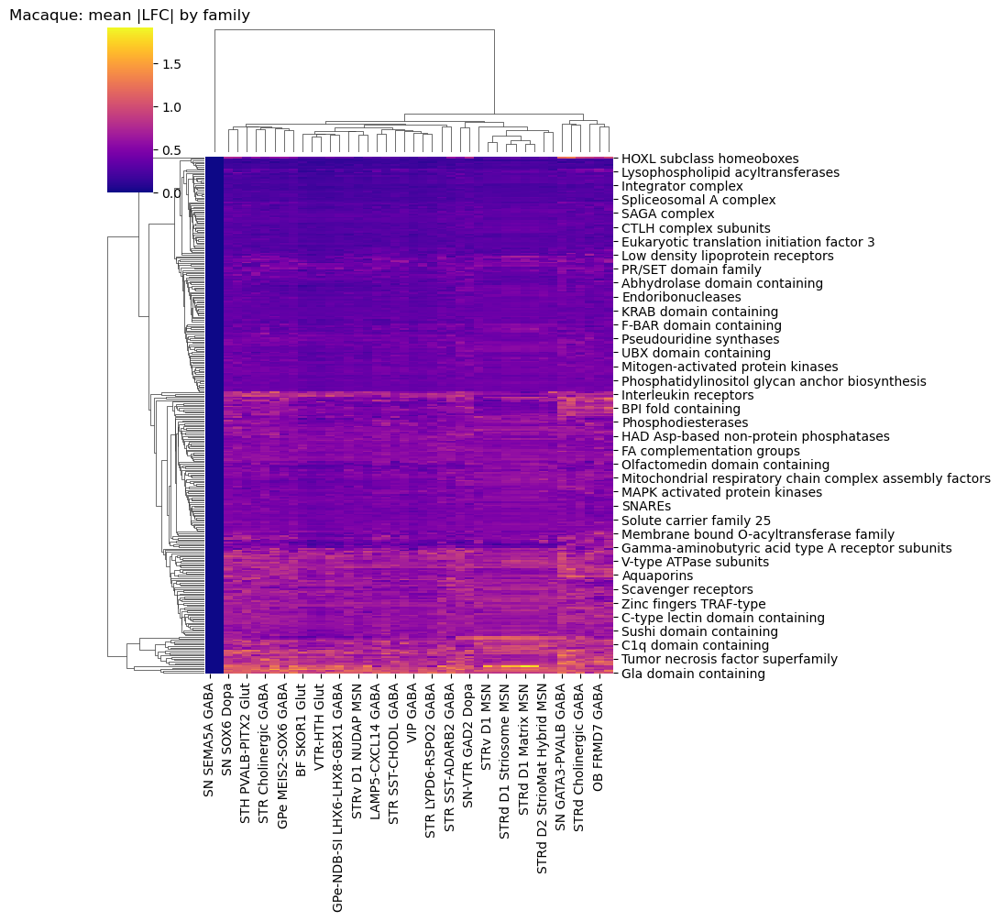

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


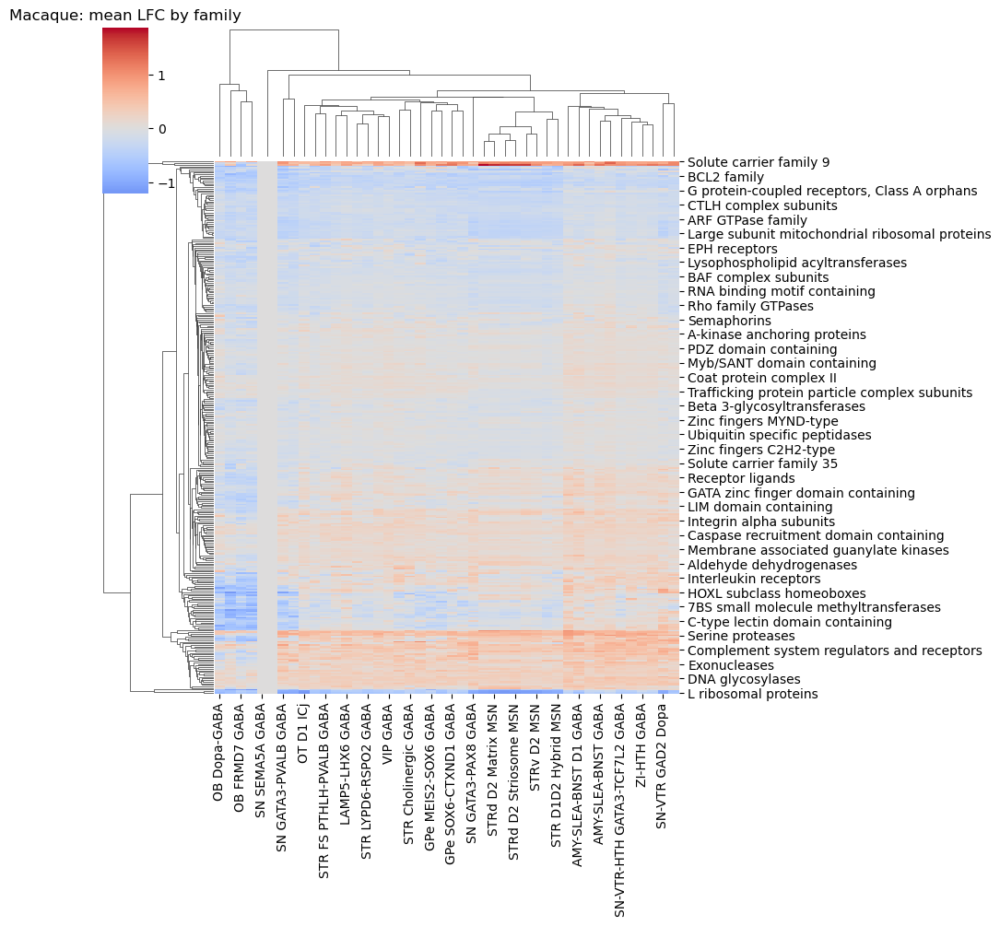

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


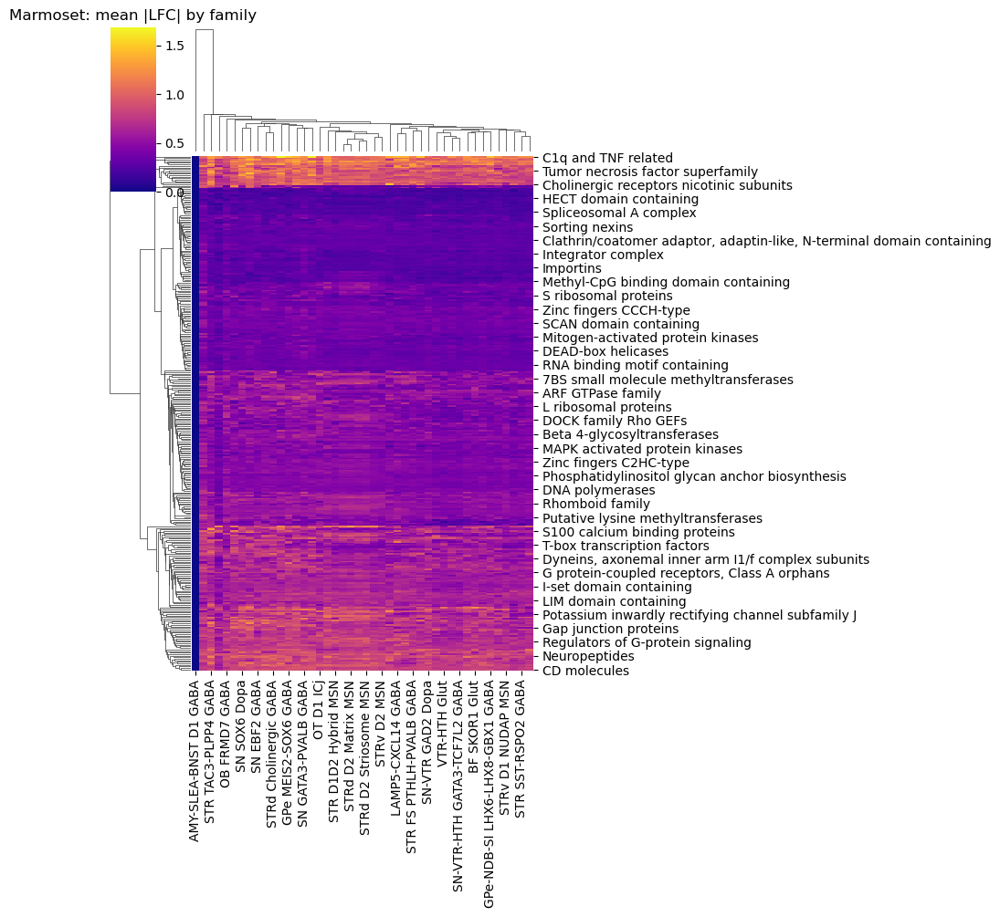

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


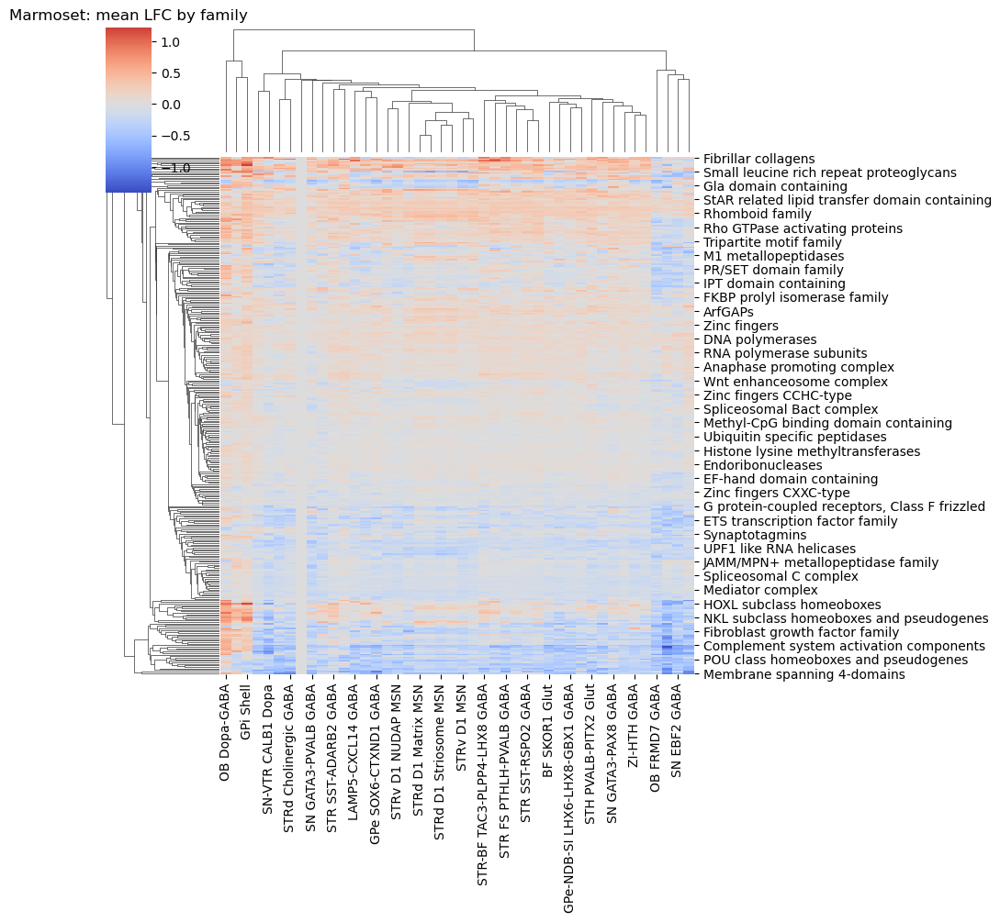

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


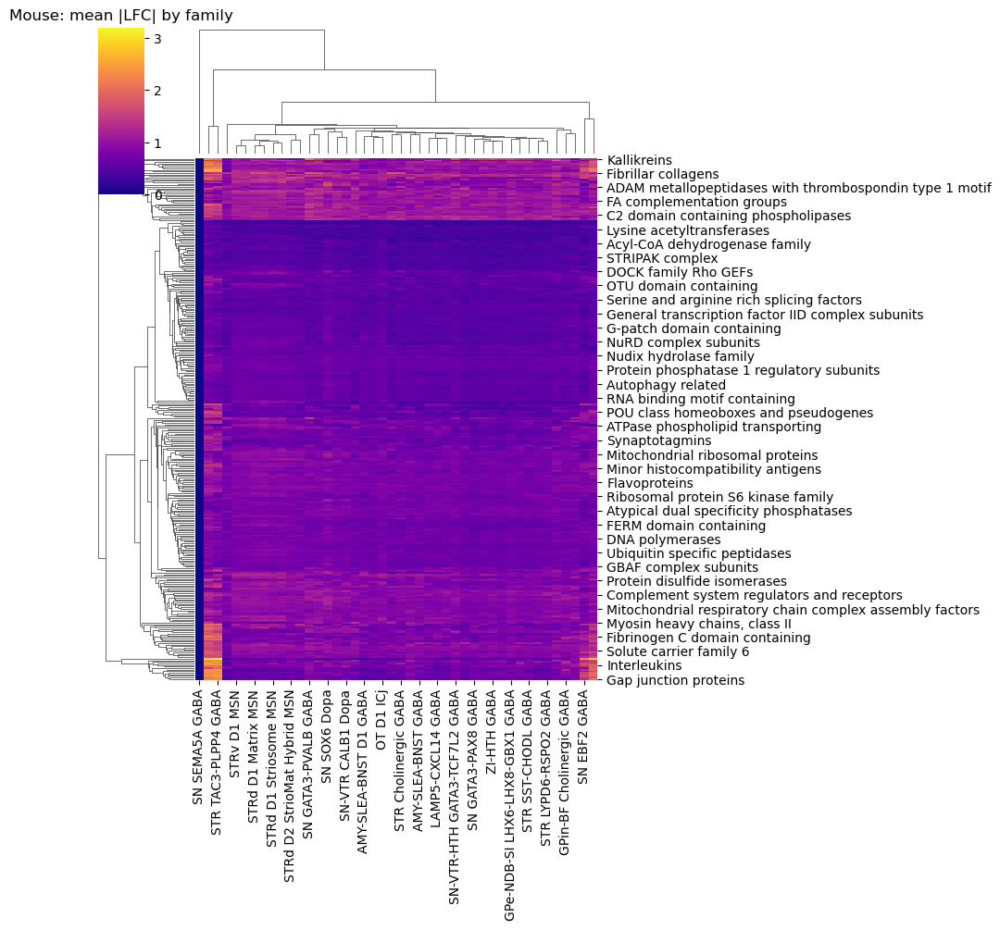

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


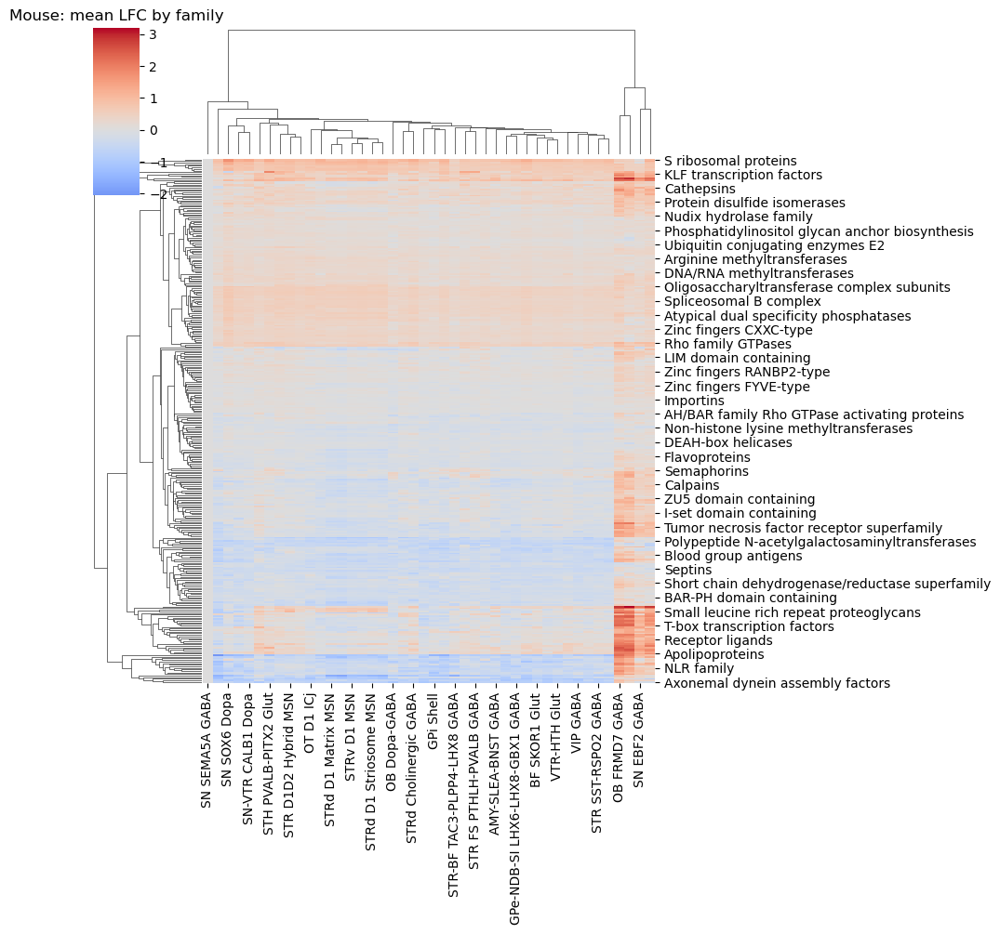

In [81]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn  # note: imported as `seaborn` per your preference
from statsmodels.stats.multitest import multipletests

# ---- inputs you already have ----
# ads = xr.open_dataset(...)
# lfc = (ads['scalars'] - ads['scalars'].mean(species_key))
# family_tab / family_dicts as in your snippet
# species_key, leaf_key defined in your environment

# ---- compute signed/unsigned summaries for families (observed) ----
species_levels = lfc.coords[species_key].to_numpy()
celltypes = lfc.coords[leaf_key].to_numpy()

# Keep a clean list of universe genes per species (present & non-NaN across groups)
# We'll use a species-invariant gene universe by intersecting genes observed across species.
genes_all = lfc.coords['var'].to_numpy()
gene_in_use = np.array([g for g in genes_all if g in set(family_tab['symbol'])])
if len(gene_in_use) == 0:
    raise ValueError("No overlap between lfc genes and family_tab symbols after filtering.")
lfc = lfc.sel(var=gene_in_use)

# Observed means
signed_obs = {}
unsigned_obs = {}
for sp in species_levels:
    obs_signed = {}
    obs_unsigned = {}
    lfc_sp = lfc.sel({species_key: sp})  # dims: (leaf_key, var)
    for fam, fam_genes in family_dicts.items():
        fam_genes = [g for g in fam_genes if g in gene_in_use]
        if len(fam_genes) == 0:
            continue
        arr = lfc_sp.sel(var=fam_genes)  # (leaf_key, var_fam)
        obs_signed[fam] = arr.mean('var').to_numpy()  # per cell type
        obs_unsigned[fam] = np.abs(arr).mean('var').to_numpy()
    signed_obs[sp] = pd.DataFrame(obs_signed, index=celltypes).fillna(0.0)
    unsigned_obs[sp] = pd.DataFrame(obs_unsigned, index=celltypes).fillna(0.0)

# ---- permutation p-values for unsigned magnitudes (upper-tail) ----
def resample_pvals_for_species(lfc_sp: xr.DataArray,
                               family_dicts: dict[str, list[str]],
                               B: int = 2000,
                               random_state: int = 1234) -> pd.DataFrame:
    """
    For a single species (lfc_sp dims: (leaf_key, var)), compute p-values that the mean(|LFC|)
    for each family × celltype exceeds a null built from B gene-set resamples of matching size.
    Returns a DataFrame (celltype × family) of p-values.
    """
    rng = np.random.default_rng(random_state)
    celltypes = lfc_sp.coords[leaf_key].to_numpy()
    genes = lfc_sp.coords['var'].to_numpy()

    # 2D array for speed: G (genes) × C (celltypes)
    # We'll operate as (celltype, gene) to make broadcasting intuitive.
    A = lfc_sp.transpose(leaf_key, 'var').to_numpy()  # shape: (C, G)
    A_abs = np.abs(A)

    # Map family -> indices
    fam_to_idx = {}
    for fam, fam_genes in family_dicts.items():
        idx = np.nonzero(np.isin(genes, fam_genes))[0]
        if idx.size > 0:
            fam_to_idx[fam] = idx

    if not fam_to_idx:
        raise ValueError("No families have genes in this species after intersection.")

    # Unique sizes; build nulls once per size
    sizes = sorted({len(v) for v in fam_to_idx.values()})
    # For each size s, draw B samples (without replacement) of s genes → mean(|LFC|) per celltype per draw
    # We produce a dict: s -> null_means with shape (C, B)
    null_by_size = {}
    G = A_abs.shape[1]
    for s in sizes:
        # For large s close to G, sampling without replacement is constrained; keep it but be mindful.
        # Draw an index matrix of shape (B, s)
        draws = np.vstack([rng.choice(G, size=s, replace=False) for _ in range(B)])  # (B, s)
        # Compute per-draw means for each celltype: mean over s columns
        # We can compute via matrix multiplication by averaging columns; but simple loop is OK and memory-safe:
        # shape (C, B)
        null_means = np.empty((A_abs.shape[0], B), dtype=np.float64)
        for b in range(B):
            null_means[:, b] = A_abs[:, draws[b]].mean(axis=1)
        null_by_size[s] = null_means  # (C, B)

    # Compute p-values: for each family f (size s_f) and celltype c,
    # p = (1 + #null >= obs) / (1 + B)  (upper-tail for magnitude)
    pvals = pd.DataFrame(index=celltypes, columns=list(fam_to_idx.keys()), dtype=float)
    for fam, idx in fam_to_idx.items():
        s = len(idx)
        obs = A_abs[:, idx].mean(axis=1)  # (C,)
        null_means = null_by_size[s]     # (C, B)
        # Compare obs to null per celltype
        ge = (null_means >= obs[:, None]).sum(axis=1)
        p = (ge + 1.0) / (null_means.shape[1] + 1.0)
        pvals[fam] = p
    return pvals.fillna(1.0)

# Run resampling per species
# B = 5000  # increase if you want tighter p-values and can afford the time
# pvals_by_species = {}
# qvals_by_species = {}
# for sp in species_levels:
#     print(f"Resampling for {sp} ...")
#     lfc_sp = lfc.sel({species_key: sp})  # (leaf_key, var)
#     p_df = resample_pvals_for_species(lfc_sp, family_dicts, B=B, random_state=1234)
#     pvals_by_species[sp] = p_df

#     # Benjamini-Hochberg FDR per species over all celltype×family tests
#     flat = p_df.values.ravel()
#     _, q_flat, _, _ = multipletests(flat, alpha=0.10, method='fdr_bh')
#     q_df = pd.DataFrame(q_flat.reshape(p_df.shape), index=p_df.index, columns=p_df.columns)
#     qvals_by_species[sp] = q_df

# ---- convenience: signed means for color, and an effect score ----
# Effect score = sign(mean LFC) * (-log10 FDR) so larger magnitude + direction are visible.
effect_by_species = {}
for sp in species_levels:
    # signed mean already computed above as signed_obs[sp] (celltype × family)
    mean_signed = signed_obs[sp].reindex(index=pvals_by_species[sp].index,
                                         columns=pvals_by_species[sp].columns).fillna(0.0)
    q_df = qvals_by_species[sp]
    with np.errstate(divide='ignore'):
        neglogq = -np.log10(q_df.clip(lower=np.finfo(float).tiny))
    effect = np.sign(mean_signed) * neglogq
    effect_by_species[sp] = effect

# ---- plotting 1: species-specific “top hits” dotmap ----
# For each species, plot the most significant family×celltype points (q small);
# x = celltype, y = family; size = -log10(q), color = signed mean LFC.
top_k = 30  # per species
for sp in species_levels:
    q_df = qvals_by_species[sp]
    m_signed = signed_obs[sp].reindex(index=q_df.index, columns=q_df.columns).fillna(0.0)
    # Stack for ranking
    long = q_df.stack().rename('q').reset_index().rename(columns={'level_0': leaf_key, 'level_1': 'family'})
    long['neglogq'] = -np.log10(long['q'].clip(lower=np.finfo(float).tiny))
    # join signed means
    long['signed_mean'] = [
        m_signed.loc[row[leaf_key], row['family']]
        for _, row in long.iterrows()
    ]
    long = long.sort_values('q', ascending=True).head(top_k)

    plt.figure(figsize=(max(8, len(long[leaf_key].unique()) * 0.4),
                        max(6, len(long['family'].unique()) * 0.4)))
    scatter = seaborn.scatterplot(
        data=long,
        x=leaf_key, y='family',
        size='neglogq', sizes=(20, 250),
        hue='signed_mean', palette='coolwarm', edgecolor='k', linewidth=0.2
    )
    plt.title(f"{sp}: top {top_k} family × cell-type shifts (size = -log10 FDR, hue = mean LFC)")
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Cell type")
    plt.ylabel("Gene family")
    cbar = plt.colorbar(scatter.collections[0], ax=plt.gca())
    cbar.set_label("Signed mean LFC")
    handles, labels = scatter.get_legend_handles_labels()
    # keep only size legend; color uses colorbar
    new_handles, new_labels = [], []
    for h, lab in zip(handles, labels):
        if lab.startswith("neglogq"):
            new_handles.append(h); new_labels.append("−log10 FDR")
    if new_handles:
        plt.legend(new_handles, new_labels, title="", loc='upper right', frameon=False)
    else:
        plt.legend([], [], frameon=False)
    plt.tight_layout()
    plt.show()

# ---- plotting 2: overview heatmap (direction × significance) ----
# effect_by_species[sp] = sign(mean LFC) * (−log10 FDR)
for sp in species_levels:
    effect = effect_by_species[sp]
    # Optional: cap extreme values for visualization
    vmax = np.nanpercentile(np.abs(effect.values.ravel()), 98)
    g = seaborn.clustermap(
        effect.T, cmap='coolwarm', center=0, robust=False,
        vmin=-vmax, vmax=vmax, figsize=(12, max(6, effect.shape[1] * 0.2))
    )
    g.fig.suptitle(f"{sp}: signed significance (sign(mean LFC) × −log10 FDR)")
    plt.show()

# ---- (optional) keep your original clustermaps for raw magnitudes ----
for sp in species_levels:
    seaborn.clustermap(unsigned_obs[sp].T, cmap='plasma')
    plt.title(f"{sp}: mean |LFC| by family")
    plt.show()

    seaborn.clustermap(signed_obs[sp].T, cmap='coolwarm', center=0)
    plt.title(f"{sp}: mean LFC by family")
    plt.show()


<Axes: xlabel='Group_propagated', ylabel='organism'>

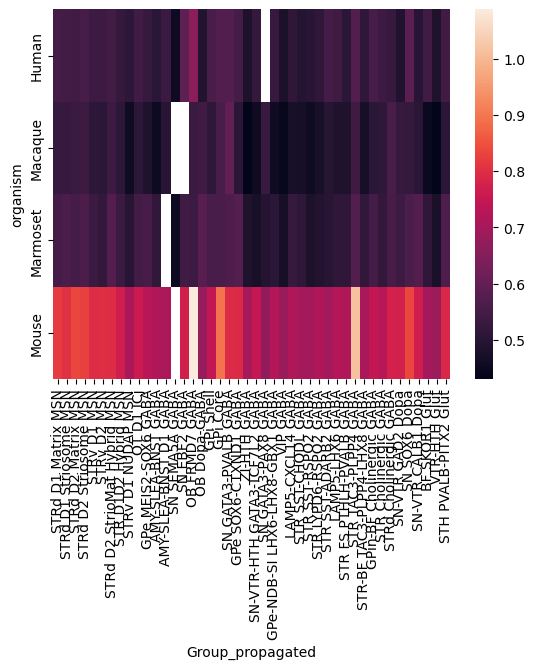

In [81]:
seaborn.heatmap(mads,xticklabels=True)

In [85]:
ads = xr.open_dataset(os.path.join(table_dir, "species_group_means_hqrm.netcdf"), engine="scipy")
lfc = (ads['scalars'].sel({'organism':['Human','Macaque','Marmoset']}) - ads['scalars'].sel({'organism':['Human','Macaque','Marmoset']}).mean(species_key)) # .sel({'organism':['Human','Macaque','Marmoset']})
mads = np.abs(lfc).mean('var').to_dataframe().unstack().droplevel(0, axis=1)

<Axes: xlabel='Group_propagated', ylabel='organism'>

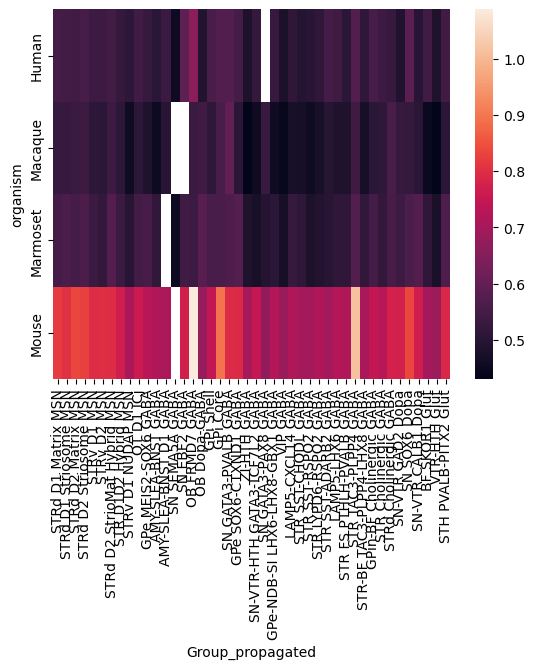

In [77]:
seaborn.heatmap(mads,xticklabels=True)

In [72]:
vcs = adata.obs.groupby(species_key)['Group_propagated'].value_counts().unstack()
vcs[vcs.columns[vcs.columns.str.contains('OB')]]

/scratch/fast/4185259/ipykernel_752532/3566109729.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  vcs = adata.obs.groupby(species_key)['Group_propagated'].value_counts().unstack()


Group_propagated,OB FRMD7 GABA,OB Dopa-GABA
organism,,
Human,881,65
Macaque,415,273
Marmoset,288,65
Mouse,15,158


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


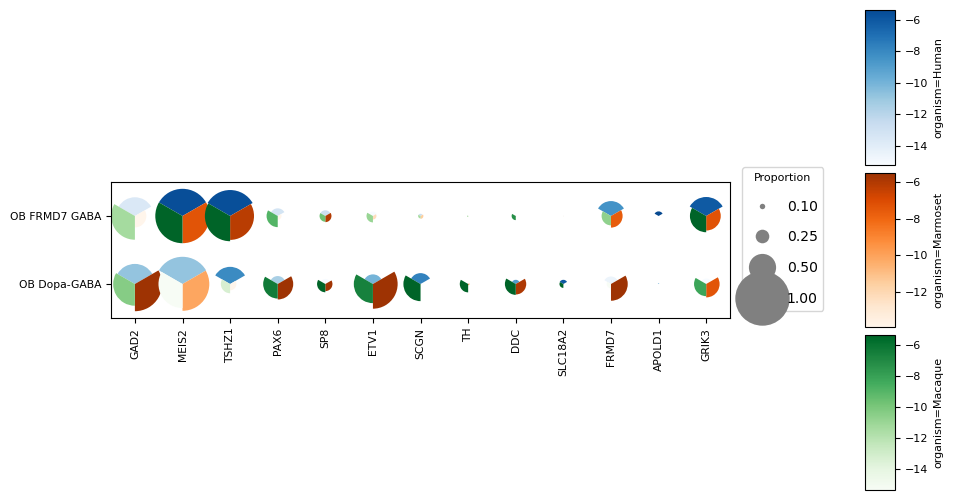

In [237]:
gene_order = ['GAD2','MEIS2','TSHZ1','PAX6','SP8','ETV1','SCGN','TH','DDC','SLC18A2','FRMD7','APOLD1','GRIK3']
antipode.plotting.pie_dotplot_xr(ads.sel(organism=['Human','Marmoset','Macaque',],var=gene_order,Group_propagated=ads.coords[leaf_key][ads.coords[leaf_key].str.contains('OB')]),row_dim=leaf_key,col_dim='var',slice_dim=species_key,
      scale_by='column', max_radius=0.4, figsize=(10, 8),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
plt.savefig(os.path.join(sc.settings.figdir, 'OB_type_markers_dots.pdf'), format='pdf')
plt.show()

In [17]:
# adata.uns['organism_name_color_dict'] = {"Human":"#377eb8", "Macaque":"#4daf4a", "Marmoset":"darkorchid", "Mouse":"darkorange"}
# adata.uns['organism_name_colors'] = [adata.uns['organism_name_color_dict'][x] for x in adata.obs[species_key].cat.categories]

In [229]:
# import os
import numpy as np
import pandas as pd
import xarray as xr
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from pydeseq2.default_inference import DefaultInference

# preserve categorical orders if present
if pd.api.types.is_categorical_dtype(adata.obs[species_key]):
    species_levels = adata.obs[species_key].cat.categories.to_numpy()
else:
    species_levels = np.sort(adata.obs[species_key].unique())

if pd.api.types.is_categorical_dtype(adata.obs[leaf_key]):
    leaf_levels = adata.obs[leaf_key].cat.categories.to_numpy()
else:
    leaf_levels = np.sort(adata.obs[leaf_key].unique())

n_species = len(species_levels)
n_leaf = len(leaf_levels)
n_genes = adata.shape[1]
batch_cell_threshold = 20

species_pairs = [(i, j) for i in range(n_species) for j in range(i + 1, n_species)]
pair_to_idx   = {p: c for c, p in enumerate(species_pairs)}
contrast_labels = [f"{species_levels[i]}-{species_levels[j]}" for (i, j) in species_pairs]
sex_label = "sex:male-female"
contrast_labels_all = contrast_labels + [sex_label]
lfc_all  = np.full((len(contrast_labels_all), n_leaf, n_genes), np.nan, dtype=float)
padj_all = np.full((len(contrast_labels_all), n_leaf, n_genes), np.nan, dtype=float)
sex_cidx = len(contrast_labels_all) - 1

inference = DefaultInference(n_cpus=4)

def _std_sex(s):
    x = s.astype(str).str.strip().str.lower()
    x = x.replace({"m":"male","f":"female"})
    x = x.where(x.isin(["male","female"]), "unknown")
    return pd.Categorical(x, categories=["female","male","unknown"], ordered=True)

def _full_rank_ok(meta, use_species, use_sex):
    cols = ([species_key] if use_species else []) + (["sex_std"] if use_sex else [])
    if not cols:
        return False
    # ensure purely numeric design
    Z = meta[cols].astype("string")                         # avoid mixed/object dtypes
    X = pd.get_dummies(Z, drop_first=True, dtype=float)     # force float dummies
    if X.shape[1] == 0:
        return False
    X = np.c_[np.ones((X.shape[0], 1), dtype=float), X.to_numpy(dtype=float, copy=False)]
    r = np.linalg.matrix_rank(X)
    return r == X.shape[1]

def _sex_levels_present(meta):
    lvls = meta["sex_std"].unique().tolist()
    return ("male" in lvls) and ("female" in lvls)

def _not_confounded(meta):
    tab = pd.crosstab(meta[species_key], meta["sex_std"])
    tab = tab.reindex(columns=["female", "male"], fill_value=0)  # safe if a column is missing
    present = (tab > 0)
    return present.sum(axis=0).min() > 1 and present.sum(axis=1).min() > 1

out_nc = os.path.join(table_dir, "deseq2_bg_hqrm.netcdf")
if not os.path.exists(out_nc):
    for k, lvl2 in enumerate(leaf_levels):
        print("Processing:", lvl2)
        adata_sub = adata[adata.obs[leaf_key] == lvl2].copy()
        
        layer = adata_sub.layers[layer_key] if layer_key is not None else adata_sub.X
        counts_mat = layer.todense() if hasattr(layer, "todense") else layer
        counts_df = pd.DataFrame(counts_mat.astype(int),
                                 index=adata_sub.obs_names,
                                 columns=adata_sub.var_names)

        metadata = adata_sub.obs.copy()
        metadata[species_key] = pd.Categorical(metadata[species_key],
                                               categories=species_levels, ordered=True)
        metadata[donor_key] = metadata[donor_key].astype(str)
        metadata["sex_std"] = _std_sex(metadata.get(sex_key, pd.Series(index=metadata.index, dtype=object)))

        batch_counts = metadata.groupby(donor_key).size()
        valid_batches = batch_counts[batch_counts >= batch_cell_threshold].index
        if len(valid_batches) == 0:
            print(f"  skip (no valid batches ≥{batch_cell_threshold})")
            continue

        metadata_pb = metadata[metadata[donor_key].isin(valid_batches)].copy()
        counts_df_pb = counts_df.loc[metadata_pb.index].groupby(metadata_pb[donor_key]).sum()
        metadata_pb = metadata_pb.groupby(donor_key).first()

        sp_counts = metadata_pb[species_key].value_counts()
        valid_species = sp_counts.index[sp_counts >= 1].tolist()
        if len(valid_species) < 2:
            print("  skip (need ≥2 species)")
            continue

        keep = metadata_pb[species_key].isin(valid_species)
        metadata_pb = metadata_pb.loc[keep].copy()
        counts_df_pb = counts_df_pb.loc[metadata_pb.index]
        metadata_pb[species_key] = pd.Categorical(metadata_pb[species_key],
                                                  categories=valid_species, ordered=True)
        if "sex" in metadata_pb:
            sex_raw = metadata_pb["sex"].astype(str).str.strip().str.lower()
        else:
            sex_raw = pd.Series(index=metadata_pb.index, dtype="string")
        
        sex_std = sex_raw.replace({"m": "male", "f": "female"})
        sex_std = sex_std.where(sex_std.isin(["male", "female"]), "unknown").astype("string")
        metadata_pb["sex_std"] = pd.Categorical(sex_std, categories=["female", "male", "unknown"], ordered=True)
        metadata_pb["sex_std"] = metadata_pb["sex_std"].cat.remove_unused_categories()

        use_sex = _sex_levels_present(metadata_pb) and _not_confounded(metadata_pb) and _full_rank_ok(metadata_pb, True, True)
        design = f"~ {species_key}" + (" + sex_std" if use_sex else "")
        # fit primary model for species (and sex if OK)
        try:
            dds = DeseqDataSet(counts=counts_df_pb, metadata=metadata_pb, design=design,
                               refit_cooks=True, inference=inference)
            dds.deseq2()
        except Exception as e:
            print(f"  model failed ({design}): {e}")
            continue

        present_to_global = {s: int(np.where(species_levels == s)[0][0]) for s in valid_species}

        # species contrasts
        for a in range(len(valid_species)):
            for b in range(a + 1, len(valid_species)):
                s_i, s_j = valid_species[a], valid_species[b]
                gi, gj = present_to_global[s_i], present_to_global[s_j]
                try:
                    ds = DeseqStats(dds, contrast=[species_key, s_i, s_j], inference=inference)
                    ds.summary()
                    res = ds.results_df.reindex(counts_df_pb.columns)
                    lfc, q = res["log2FoldChange"].to_numpy(), res["padj"].to_numpy()
                except Exception as e:
                    print(f"  contrast {s_i} vs {s_j} failed: {e}")
                    lfc = np.full(n_genes, np.nan); q = np.full(n_genes, np.nan)
                i, j = (gi, gj) if gi < gj else (gj, gi)
                cidx = pair_to_idx[(i, j)]
                sign = +1 if gi < gj else -1
                lfc_all[cidx, k, :]  = sign * lfc
                padj_all[cidx, k, :] = q

        # sex contrast
        if use_sex:
            try:
                ds_sex = DeseqStats(dds, contrast=["sex_std", "male", "female"], inference=inference)
                ds_sex.summary()
                res = ds_sex.results_df.reindex(counts_df_pb.columns)
                lfc_all[sex_cidx, k, :]  = res["log2FoldChange"].to_numpy()
                padj_all[sex_cidx, k, :] = res["padj"].to_numpy()
            except Exception as e:
                print(f"  sex contrast failed in primary model: {e}")
        else:
            meta_sf = metadata_pb.loc[metadata_pb["sex_std"].isin(["female","male"])].copy()
            if meta_sf.shape[0] >= 3 and _sex_levels_present(meta_sf) and _full_rank_ok(meta_sf, False, True):
                cdf_sf = counts_df_pb.loc[meta_sf.index]
                try:
                    dds2 = DeseqDataSet(counts=cdf_sf, metadata=meta_sf, design="~ sex_std",
                                        refit_cooks=True, inference=inference)
                    dds2.deseq2()
                    ds_sex = DeseqStats(dds2, contrast=["sex_std", "male", "female"], inference=inference)
                    ds_sex.summary()
                    res = ds_sex.results_df.reindex(cdf_sf.columns)
                    lfc_all[sex_cidx, k, :]  = res["log2FoldChange"].to_numpy()
                    padj_all[sex_cidx, k, :] = res["padj"].to_numpy()
                except Exception as e:
                    print(f"  sex-only model failed: {e}")
            else:
                print("  sex contrast not estimable (levels/replication/confounding)")

    deds = xr.Dataset(
        {"lfc": xr.DataArray(lfc_all,  dims=["contrast", leaf_key, "gene"],
                             coords={"contrast": contrast_labels_all, leaf_key: leaf_levels, "gene": adata.var_names}),
         "padj": xr.DataArray(padj_all, dims=["contrast", leaf_key, "gene"],
                              coords={"contrast": contrast_labels_all, leaf_key: leaf_levels, "gene": adata.var_names})}
    )
    deds.attrs["species_order"] = ",".join(map(str, species_levels))
    deds.attrs["group_order"]   = ",".join(map(str, leaf_levels))
    deds.attrs["sex_contrast"]  = sex_label
    deds.to_netcdf(out_nc, engine="scipy")


/scratch/fast/4200988/ipykernel_2968642/3601824797.py:10: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs[species_key]):
/scratch/fast/4200988/ipykernel_2968642/3601824797.py:15: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs[leaf_key]):


In [188]:
adata.obs

,Neighborhood,Class,Subclass,Group,Cluster,cluster_id,cell_type_ontology_term,load_id,donor_id,assay,...,library,sex,ClusterKey_y,ClusterNm_y,derived_cell_libs_y,dataset,log10_n_counts,Group_propagated,Subclass_propagated,Class_propagated
AAACCAACAAGGTACG-2362_A05,Subpallium GABA,CN LGE GABA,STR D1 MSN,STRv D1 MSN,Human-154,Human-154,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,male,NaN,NaN,NaN,NaN,4.468731,STRv D1 MSN,STR D1 MSN,CN LGE GABA
AAACCAACATGAAGTA-2362_A05,Subpallium GABA,CN LGE GABA,STR D2 MSN,STRd D2 Matrix MSN,Human-563,Human-563,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,male,NaN,NaN,NaN,NaN,4.762731,STRd D2 Matrix MSN,STR D2 MSN,CN LGE GABA
AAACCGAAGTAGAGGC-2362_A05,Subpallium GABA,CN LGE GABA,STR D2 MSN,STRd D2 Matrix MSN,Human-563,Human-563,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,male,NaN,NaN,NaN,NaN,4.718011,STRd D2 Matrix MSN,STR D2 MSN,CN LGE GABA
AAACCGCGTACGTTTC-2362_A05,Subpallium GABA,CN LGE GABA,STR D1 MSN,STRd D1 Matrix MSN,Human-512,Human-512,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,male,NaN,NaN,NaN,NaN,4.275657,STRd D1 Matrix MSN,STR D1 MSN,CN LGE GABA
AAACCGCGTGATTTGG-2362_A05,Subpallium GABA,CN LGE GABA,STR D1 MSN,STRv D1 MSN,Human-155,Human-155,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,male,NaN,NaN,NaN,NaN,4.849229,STRv D1 MSN,STR D1 MSN,CN LGE GABA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pBICCNsMMrS1iF022d210713A6_TCGCTCATCACCGGGT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pBICCNsMMrS1iF022d210713A6,mouse,NaN,...,pBICCNsMMrS1iF022d210713A6,female,300-0-0-0-0-1-0-0,Inh_Lhx6_Pvalb_Tac1,pBICCNsMMrS1iF022d210713A6,WMB_Subpallium-GABA,4.363029,STR LYPD6-RSPO2 GABA,STR RSPO2 GABA,CN MGE GABA
pBICCNsMMrTHT6iF016d210330A3_TCCGTGTGTTATCCAG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pBICCNsMMrTHT6iF016d210330A3,mouse,NaN,...,pBICCNsMMrTHT6iF016d210330A3,female,300-0-0-0-0-0-0-3-0-0,Ex_Lypd6b_Dipk1c_1,pBICCNsMMrTHT6iF016d210330A3,WMB_TH-EPI-Glut,3.851014,VTR-HTH Glut,F M Glut,F M Glut
pBICCNsMMrTHT6iF016d210330A1_GATCGTAGTACAAACA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pBICCNsMMrTHT6iF016d210330A1,mouse,NaN,...,pBICCNsMMrTHT6iF016d210330A1,female,300-0-0-0-0-0-0-3-0-0,Ex_Lypd6b_Dipk1c_1,pBICCNsMMrTHT6iF016d210330A1,WMB_TH-EPI-Glut,3.815445,ZI-HTH GABA,F GABA,F M GABA
pBICCNsMMrTHT6iM018d210407A1_TTTAGTCCAGGGTTGA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pBICCNsMMrTHT6iM018d210407A1,mouse,NaN,...,pBICCNsMMrTHT6iM018d210407A1,male,300-0-0-0-0-0-0-3-0-0,Ex_Lypd6b_Dipk1c_1,pBICCNsMMrTHT6iM018d210407A1,WMB_TH-EPI-Glut,4.279462,VTR-HTH Glut,F M Glut,F M Glut


In [42]:
import os
import numpy as np
import pandas as pd
import xarray as xr
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from pydeseq2.default_inference import DefaultInference

# preserve categorical orders if present
if pd.api.types.is_categorical_dtype(adata.obs[species_key]):
    species_levels = adata.obs[species_key].cat.categories.to_numpy()
else:
    species_levels = np.sort(adata.obs[species_key].unique())

if pd.api.types.is_categorical_dtype(adata.obs[leaf_key]):
    leaf_levels = adata.obs[leaf_key].cat.categories.to_numpy()
else:
    leaf_levels = np.sort(adata.obs[leaf_key].unique())

n_species = len(species_levels)
n_leaf = len(leaf_levels)
n_genes = adata.shape[1]
batch_cell_threshold = 20

inference = DefaultInference(n_cpus=4)

def _std_sex(s):
    x = s.astype(str).str.strip().str.lower()
    x = x.replace({"m": "male", "f": "female"})
    x = x.where(x.isin(["male", "female"]), "unknown")
    return pd.Categorical(x, categories=["female", "male", "unknown"], ordered=True)

def _full_rank_ok(meta):
    if "sex_std" not in meta.columns:
        return False
    Z = meta[["sex_std"]].astype("string")
    X = pd.get_dummies(Z, drop_first=True, dtype=float)
    if X.shape[1] == 0:
        return False
    X = np.c_[np.ones((X.shape[0], 1), dtype=float), X.to_numpy(dtype=float, copy=False)]
    r = np.linalg.matrix_rank(X)
    return r == X.shape[1]

def _sex_levels_present(meta):
    lvls = meta["sex_std"].cat.categories[meta["sex_std"].cat.categories.isin(meta["sex_std"].unique())]
    return ("male" in meta["sex_std"].unique()) and ("female" in meta["sex_std"].unique())

out_nc = os.path.join(table_dir, "deseq2_bg_sex_by_species_hqrm.netcdf")

lfc_sex  = np.full((n_species, n_leaf, n_genes), np.nan, dtype=float)
padj_sex = np.full((n_species, n_leaf, n_genes), np.nan, dtype=float)
ok_mask  = np.zeros((n_species, n_leaf), dtype=bool)

if not os.path.exists(out_nc):
    for k, lvl2 in enumerate(leaf_levels):
        print("Processing:", lvl2)
        adata_sub = adata[adata.obs[leaf_key] == lvl2].copy()

        layer = adata_sub.layers[layer_key] if layer_key is not None else adata_sub.X
        counts_mat = layer.todense() if hasattr(layer, "todense") else layer
        counts_df = pd.DataFrame(
            counts_mat.astype(int),
            index=adata_sub.obs_names,
            columns=adata_sub.var_names
        )

        metadata = adata_sub.obs.copy()
        metadata[species_key] = pd.Categorical(metadata[species_key],
                                               categories=species_levels, ordered=True)
        metadata[donor_key] = metadata[donor_key].astype(str)
        metadata["sex_std"] = _std_sex(metadata.get(sex_key, pd.Series(index=metadata.index, dtype=object)))

        # collapse to donor-level with a minimum per-donor cell count
        batch_counts = metadata.groupby(donor_key).size()
        valid_batches = batch_counts[batch_counts >= batch_cell_threshold].index
        if len(valid_batches) == 0:
            print(f"  skip (no valid batches ≥{batch_cell_threshold})")
            continue

        metadata_pb   = metadata[metadata[donor_key].isin(valid_batches)].copy()
        counts_df_pb  = counts_df.loc[metadata_pb.index].groupby(metadata_pb[donor_key]).sum()
        metadata_pb   = metadata_pb.groupby(donor_key).first()

        # iterate species and run sex-only model per species
        for si, sp in enumerate(species_levels):
            meta_sp = metadata_pb.loc[metadata_pb[species_key] == sp].copy()
            if meta_sp.shape[0] < 2:
                continue

            # restrict to male/female; drop unknown
            meta_sp = meta_sp.loc[meta_sp["sex_std"].isin(["female", "male"])].copy()
            if meta_sp.shape[0] < 2 or not _sex_levels_present(meta_sp):
                continue

            cdf_sp = counts_df_pb.loc[meta_sp.index]
            # DESeq2 requires some replication; insist on >=1 donor per sex and >=3 donors total if possible
            sex_counts = meta_sp["sex_std"].value_counts()
            if (sex_counts.get("female", 0) < 1) or (sex_counts.get("male", 0) < 1) or (meta_sp.shape[0] < 3):
                continue

            meta_sp["sex_std"] = meta_sp["sex_std"].cat.remove_unused_categories()
            if not _full_rank_ok(meta_sp):
                continue

            try:
                dds = DeseqDataSet(counts=cdf_sp, metadata=meta_sp, design="~ sex_std",
                                   refit_cooks=True, inference=inference)
                dds.deseq2()
                ds = DeseqStats(dds, contrast=["sex_std", "male", "female"], inference=inference)
                ds.summary()
                res = ds.results_df.reindex(cdf_sp.columns)
                lfc_sex[si, k, :]  = res["log2FoldChange"].reindex(adata.var_names).to_numpy()
                padj_sex[si, k, :] = res["padj"].reindex(adata.var_names).to_numpy()
                ok_mask[si, k] = True
            except Exception as e:
                print(f"  {sp} sex model failed ({lvl2}): {e}")
                continue

    deds = xr.Dataset(
        {
            "lfc": xr.DataArray(
                lfc_sex, dims=["species", leaf_key, "gene"],
                coords={"species": species_levels, leaf_key: leaf_levels, "gene": adata.var_names}
            ),
            "padj": xr.DataArray(
                padj_sex, dims=["species", leaf_key, "gene"],
                coords={"species": species_levels, leaf_key: leaf_levels, "gene": adata.var_names}
            ),
            "ok": xr.DataArray(
                ok_mask, dims=["species", leaf_key],
                coords={"species": species_levels, leaf_key: leaf_levels}
            ),
        }
    )
    deds.attrs["species_order"] = ",".join(map(str, species_levels))
    deds.attrs["group_order"]   = ",".join(map(str, leaf_levels))
    deds.attrs["design"]        = "~ sex_std  (per species, per group)"
    deds.attrs["note"]          = f"donor-level aggregation; min {batch_cell_threshold} cells per donor"
    deds.to_netcdf(out_nc, engine="scipy")


/scratch/fast/4225144/ipykernel_3817034/1760682488.py:10: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs[species_key]):
/scratch/fast/4225144/ipykernel_3817034/1760682488.py:15: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs[leaf_key]):


In [20]:
# padj_array = deds['padj'].data
# lfc_array = deds['lfc'].data

In [18]:
def plot_up_down_counts(ds: xr.Dataset, alpha=0.05, lfc_thresh=0.0, save_dir=None,contrast_var="contrast"):
    groups = ds[leaf_key].values
    contrasts = ds[contrast_var].values

    for c in contrasts:
        padj = ds["padj"].sel({contrast_var:c})
        lfc  = ds["lfc"].sel({contrast_var:c})
        lfc_thresh = np.abs(lfc_thresh)
        
        sig   = padj < alpha
        up    = (sig & (lfc >  lfc_thresh)).sum(dim="gene").to_pandas()
        down  = (sig & (lfc < -lfc_thresh)).sum(dim="gene").to_pandas()

        x = np.arange(len(groups))
        w = 0.45
        fig, ax = plt.subplots(figsize=(max(10, len(groups)*0.25), 6))
        ax.bar(x - w/2, up.reindex(groups).fillna(0).astype(int),  width=w, label=f"Up (>{lfc_thresh})")
        ax.bar(x + w/2, down.reindex(groups).fillna(0).astype(int), width=w, label=f"Down (<{-lfc_thresh})")

        ax.set_xticks(x)
        ax.set_xticklabels(groups, rotation=90)
        ax.set_ylabel("# genes")
        ax.set_title(f"{c} (padj < {alpha})")
        ax.legend(frameon=False)
        fig.tight_layout()
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            fig.savefig(os.path.join(save_dir, f"updown_{str(c).replace(' ','_')}.pdf"), bbox_inches="tight")
        plt.show()



In [19]:
deds = xr.open_dataset(os.path.join(table_dir, "deseq2_bg_sex_by_species_hqrm.netcdf"))

In [20]:
ads = ads.sel({leaf_key:adata.obs[leaf_key].cat.categories})
sads = sads.sel({leaf_key:adata.obs[leaf_key].cat.categories})
deds = deds.sel({leaf_key:adata.obs[leaf_key].cat.categories})

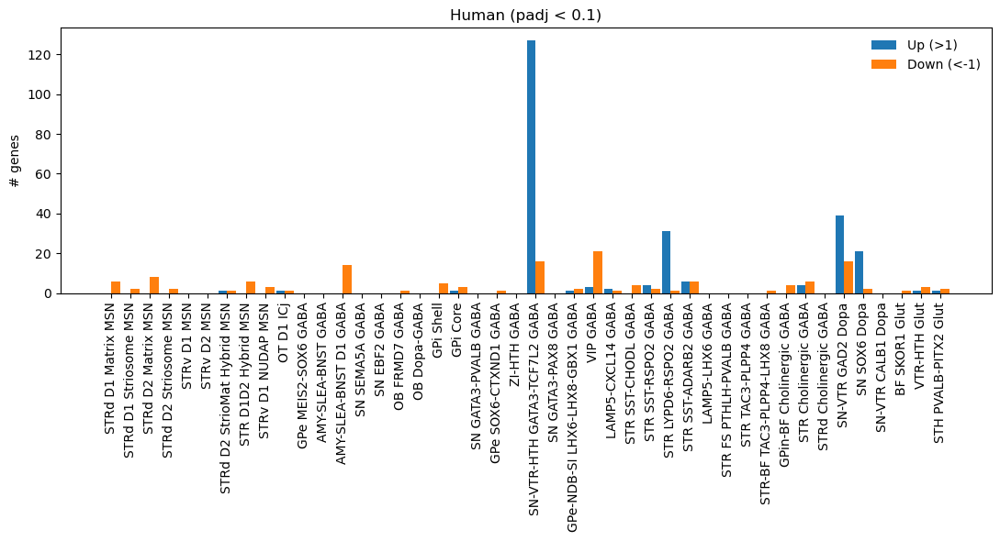

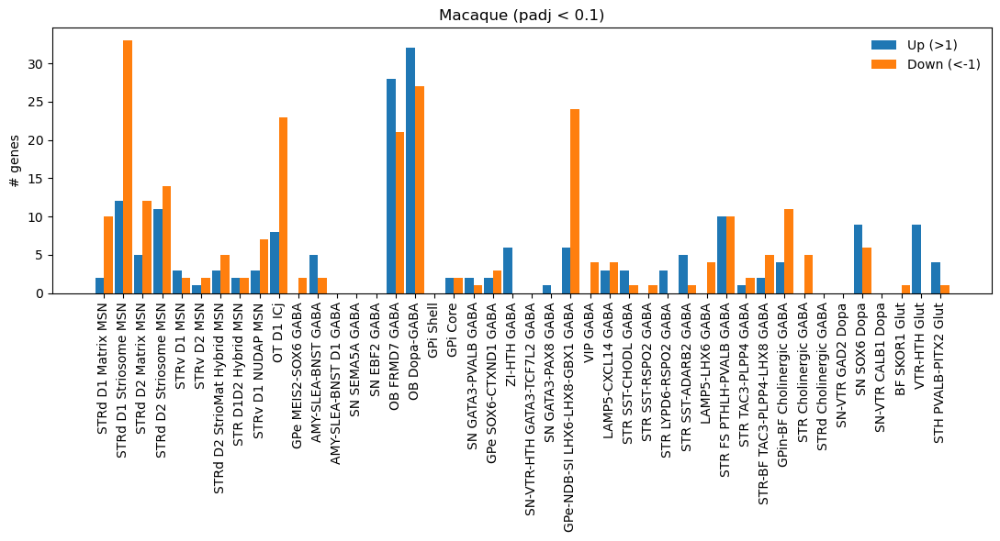

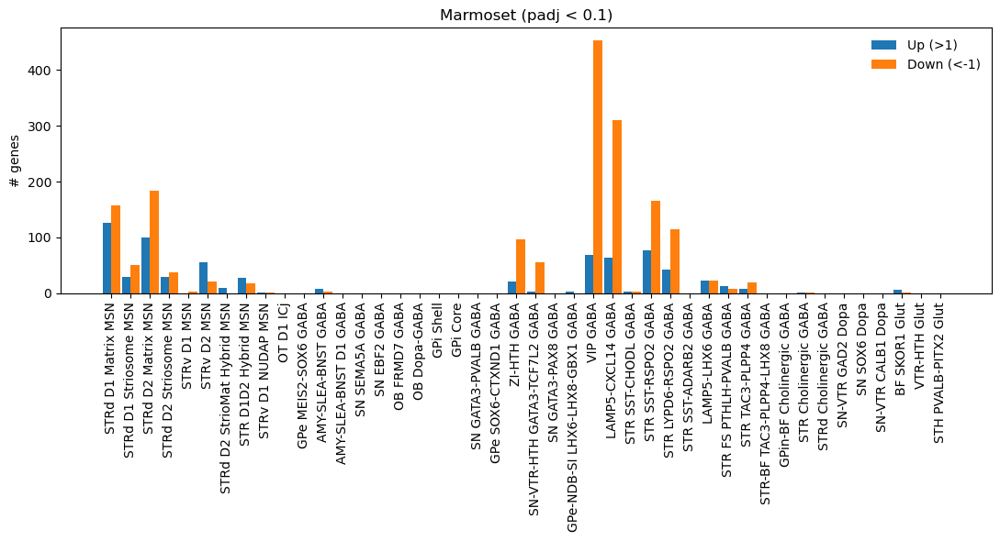

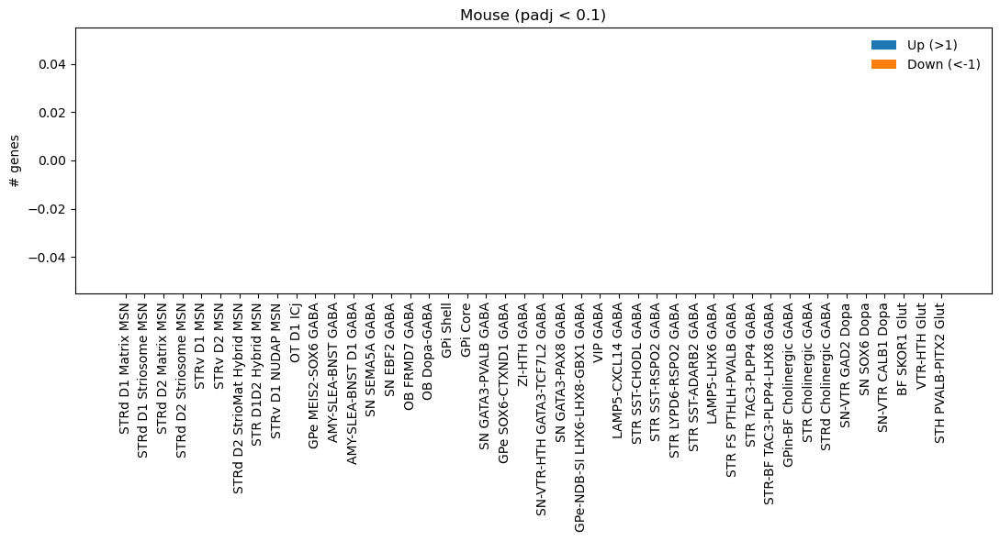

In [21]:
plot_up_down_counts(deds,lfc_thresh=1,alpha=0.1,save_dir=sc.settings.figdir,contrast_var='species')

In [22]:
deds = xr.open_dataset(os.path.join(table_dir, "deseq2_bg_hqrm.netcdf"))

In [23]:
ads = ads.sel({leaf_key:adata.obs[leaf_key].cat.categories})
sads = sads.sel({leaf_key:adata.obs[leaf_key].cat.categories})
deds = deds.sel({leaf_key:adata.obs[leaf_key].cat.categories})

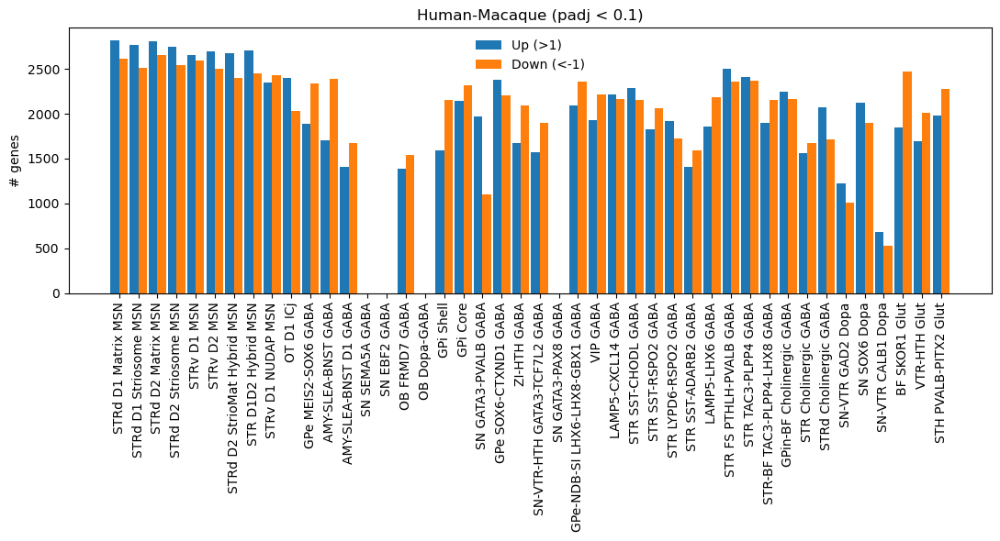

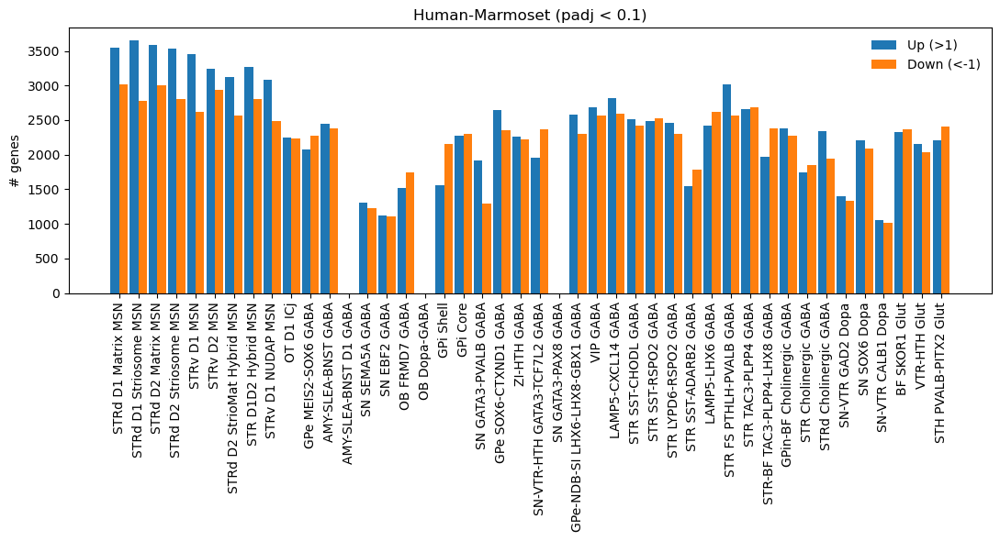

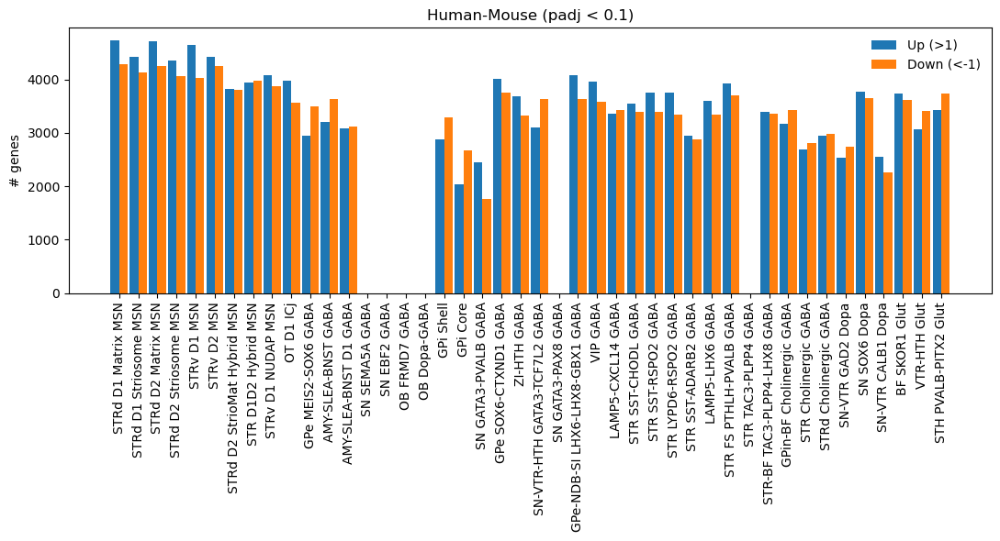

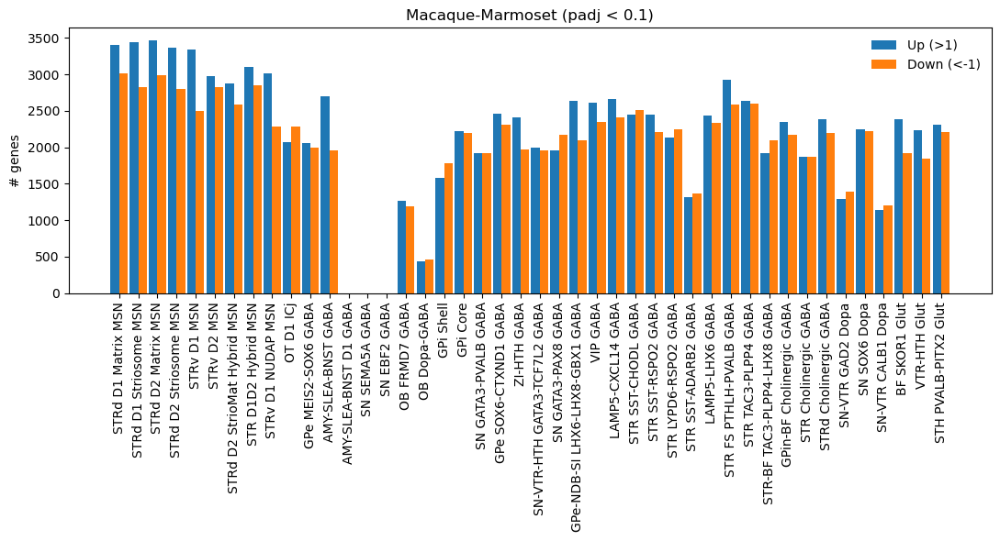

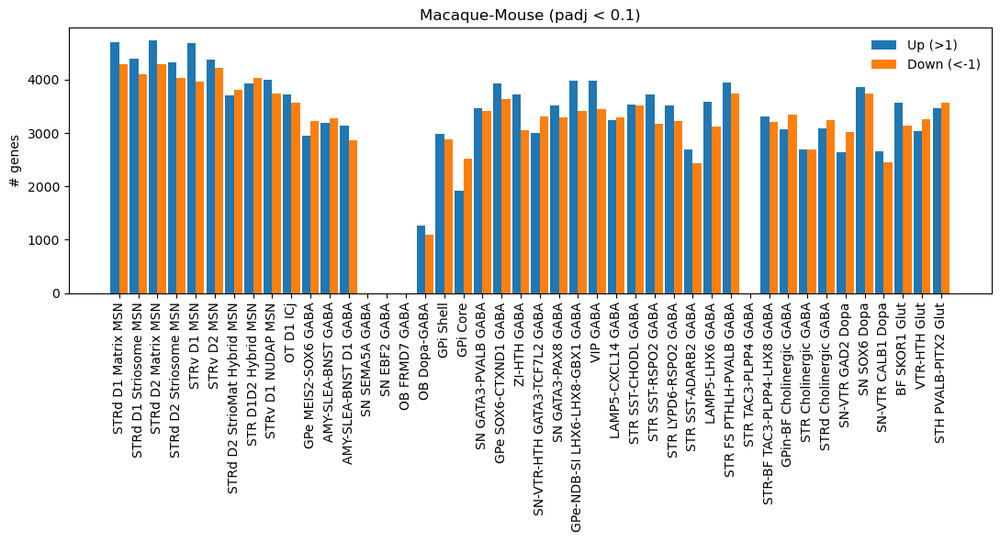

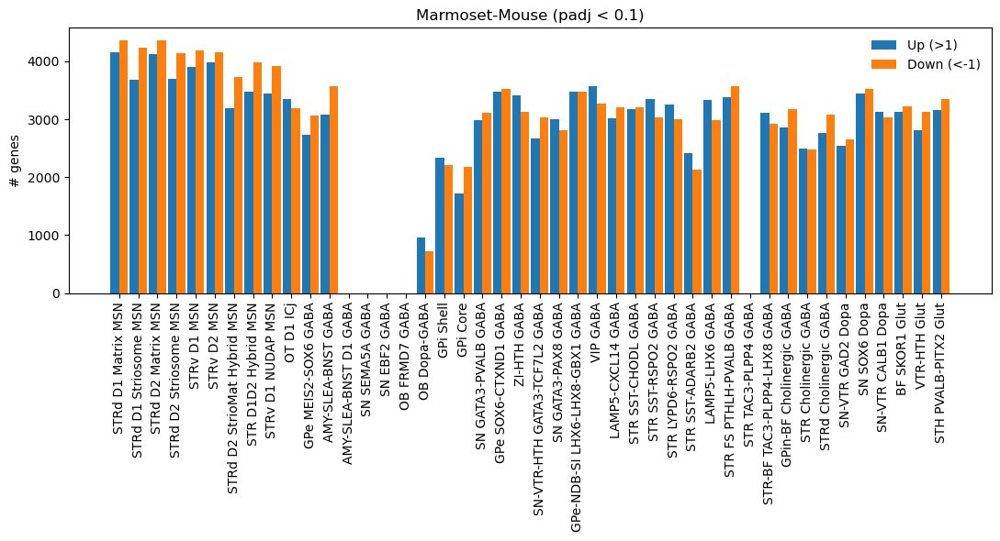

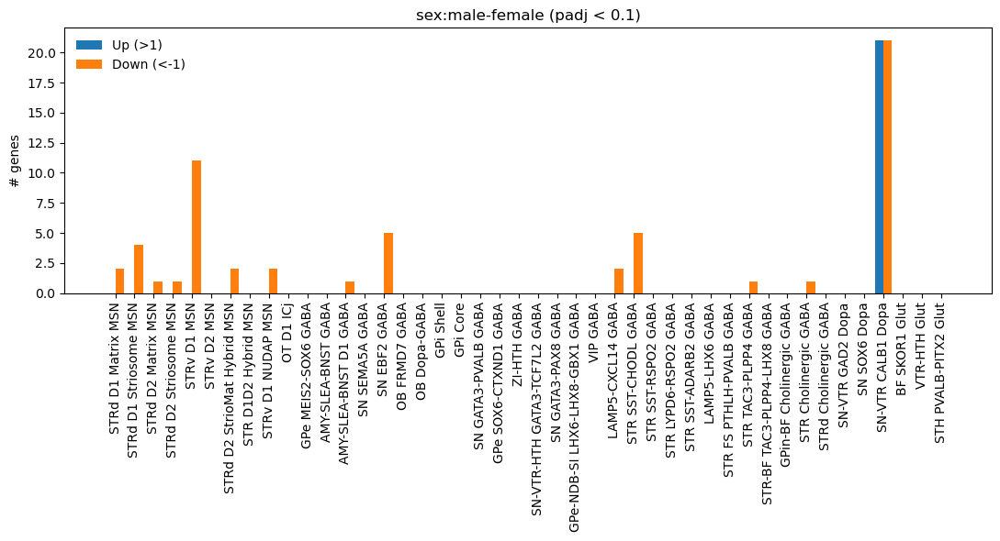

In [24]:
plot_up_down_counts(deds,lfc_thresh=1,alpha=0.1,save_dir=sc.settings.figdir)

In [49]:
lfc_thresh = 1.
alpha = 0.1
c= 'sex:male-female'
padj = deds["padj"].sel(contrast=c)
lfc  = deds["lfc"].sel(contrast=c)
genes = deds.coords['gene'].data

sig   = padj < alpha
up    = (sig & (lfc >  lfc_thresh))
down  = (sig & (lfc < -lfc_thresh))

up_genes = {}
down_genes = {}

for g in deds.coords[leaf_key].data:
    up_genes[g] = genes[up.sel(Group_propagated=g)]
    down_genes[g] = genes[down.sel(Group_propagated=g)]

In [50]:
import itertools
print(set(list(itertools.chain(*up_genes.values()))))
print(set(list(itertools.chain(*down_genes.values()))))

{'NEB', 'CORIN', 'PTPN20', 'SLCO1C1', 'TRIM69', 'CALCR', 'ADGRF3', 'ALDH8A1', 'CPVL', 'ADAMTS13', 'ST8SIA6', 'YIPF7', 'DNHD1', 'BCL2L14', 'GLIPR1L1', 'SLC6A13', 'TXK', 'STAT4', 'C20H17orf67', 'RNF212', 'GEN1'}
{'TRIM38', 'RNF227', 'CNTNAP4', 'GPX5', 'SCP2D1', 'CCDC158', 'ANXA1', 'APEX2', 'NELL1', 'KRT23', 'MLIP', 'PDZRN4', 'AGBL1', 'IL13RA2', 'TMEM207', 'NOS2', 'MINAR2', 'ARAF', 'CASQ2', 'GRIN3A', 'C1H1orf210', 'MEP1A', 'OTOL1', 'ANXA10', 'LY6H', 'SLC16A11', 'NNAT', 'EXT1', 'CST3', 'OIT3', 'FOXP2', 'ZWINT', 'IRF6', 'BRDT', 'CHRNB3', 'SCGN', 'VIP', 'CTSV', 'C2H14orf39', 'TECR', 'SGCZ', 'ZCCHC18', 'USP29', 'FREM1', 'DLK1', 'IL18R1', 'GRXCR2', 'MTTP', 'CGNL1', 'HAPLN4'}


In [272]:
sads

<xarray.Dataset> Size: 22MB
Dimensions:           (var: 15466, Group_propagated: 44, sex: 2)
Coordinates:
  * var               (var) object 124kB 'TLE2' 'TRADD' ... 'LOC101337707'
  * Group_propagated  (Group_propagated) object 352B 'STRd D1 Matrix MSN' ......
  * sex               (sex) object 16B 'female' 'male'
Data variables:
    scalars           (sex, Group_propagated, var) float64 11MB ...
    proportions       (sex, Group_propagated, var) float64 11MB ...

In [273]:
import collections
up_counts = collections.Counter(list(itertools.chain(*up_genes.values())))
print(up_counts)
filtered = {k: [g for g in v if up_counts[g] < 5] for k, v in up_genes.items()}
{k: v for k, v in filtered.items() if len(v) > 0}

Counter({'TRIM69': 1, 'SLCO1C1': 1, 'CPVL': 1, 'YIPF7': 1, 'C20H17orf67': 1, 'PTPN20': 1, 'ST8SIA6': 1, 'CORIN': 1, 'ALDH8A1': 1, 'ADGRF3': 1, 'CALCR': 1, 'ADAMTS13': 1, 'BCL2L14': 1, 'GEN1': 1, 'DNHD1': 1, 'TXK': 1, 'SLC6A13': 1, 'NEB': 1, 'GLIPR1L1': 1, 'STAT4': 1, 'RNF212': 1})


{'SN-VTR CALB1 Dopa': ['TRIM69',
  'SLCO1C1',
  'CPVL',
  'YIPF7',
  'C20H17orf67',
  'PTPN20',
  'ST8SIA6',
  'CORIN',
  'ALDH8A1',
  'ADGRF3',
  'CALCR',
  'ADAMTS13',
  'BCL2L14',
  'GEN1',
  'DNHD1',
  'TXK',
  'SLC6A13',
  'NEB',
  'GLIPR1L1',
  'STAT4',
  'RNF212']}

In [274]:
down_counts = collections.Counter(list(itertools.chain(*down_genes.values())))
print(down_counts)
filtered = {k: [g for g in v if up_counts[g] < 5] for k, v in down_genes.items()}
{k: v for k, v in filtered.items() if len(v) > 0}


Counter({'TRIM38': 3, 'ANXA10': 3, 'IRF6': 3, 'CHRNB3': 3, 'MEP1A': 2, 'MLIP': 1, 'CGNL1': 1, 'GRIN3A': 1, 'OTOL1': 1, 'KRT23': 1, 'GPX5': 1, 'CCDC158': 1, 'SCP2D1': 1, 'HAPLN4': 1, 'C1H1orf210': 1, 'GRXCR2': 1, 'IL18R1': 1, 'PDZRN4': 1, 'EXT1': 1, 'NELL1': 1, 'SGCZ': 1, 'FREM1': 1, 'AGBL1': 1, 'IL13RA2': 1, 'OIT3': 1, 'NOS2': 1, 'SCGN': 1, 'CASQ2': 1, 'FOXP2': 1, 'MINAR2': 1, 'CST3': 1, 'C2H14orf39': 1, 'NNAT': 1, 'ZCCHC18': 1, 'ARAF': 1, 'DLK1': 1, 'RNF227': 1, 'ZWINT': 1, 'MTTP': 1, 'TMEM207': 1, 'BRDT': 1, 'APEX2': 1, 'CTSV': 1, 'VIP': 1, 'TECR': 1, 'LY6H': 1, 'CNTNAP4': 1, 'ANXA1': 1, 'SLC16A11': 1, 'USP29': 1})


{'STRd D1 Matrix MSN': ['TRIM38', 'ANXA10'],
 'STRd D1 Striosome MSN': ['MLIP', 'TRIM38', 'CGNL1', 'ANXA10'],
 'STRd D2 Matrix MSN': ['TRIM38'],
 'STRd D2 Striosome MSN': ['GRIN3A'],
 'STRv D1 MSN': ['OTOL1',
  'KRT23',
  'GPX5',
  'CCDC158',
  'SCP2D1',
  'HAPLN4',
  'C1H1orf210',
  'IRF6',
  'MEP1A',
  'GRXCR2',
  'IL18R1'],
 'STRd D2 StrioMat Hybrid MSN': ['IRF6', 'CHRNB3'],
 'STRv D1 NUDAP MSN': ['IRF6', 'CHRNB3'],
 'AMY-SLEA-BNST D1 GABA': ['PDZRN4'],
 'SN EBF2 GABA': ['EXT1', 'NELL1', 'SGCZ', 'FREM1', 'AGBL1'],
 'LAMP5-CXCL14 GABA': ['IL13RA2', 'OIT3'],
 'STR SST-CHODL GABA': ['NOS2', 'SCGN', 'CASQ2', 'MEP1A', 'CHRNB3'],
 'STR TAC3-PLPP4 GABA': ['ANXA10'],
 'STR Cholinergic GABA': ['FOXP2'],
 'SN-VTR CALB1 Dopa': ['MINAR2',
  'CST3',
  'C2H14orf39',
  'NNAT',
  'ZCCHC18',
  'ARAF',
  'DLK1',
  'RNF227',
  'ZWINT',
  'MTTP',
  'TMEM207',
  'BRDT',
  'APEX2',
  'CTSV',
  'VIP',
  'TECR',
  'LY6H',
  'CNTNAP4',
  'ANXA1',
  'SLC16A11',
  'USP29']}

/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


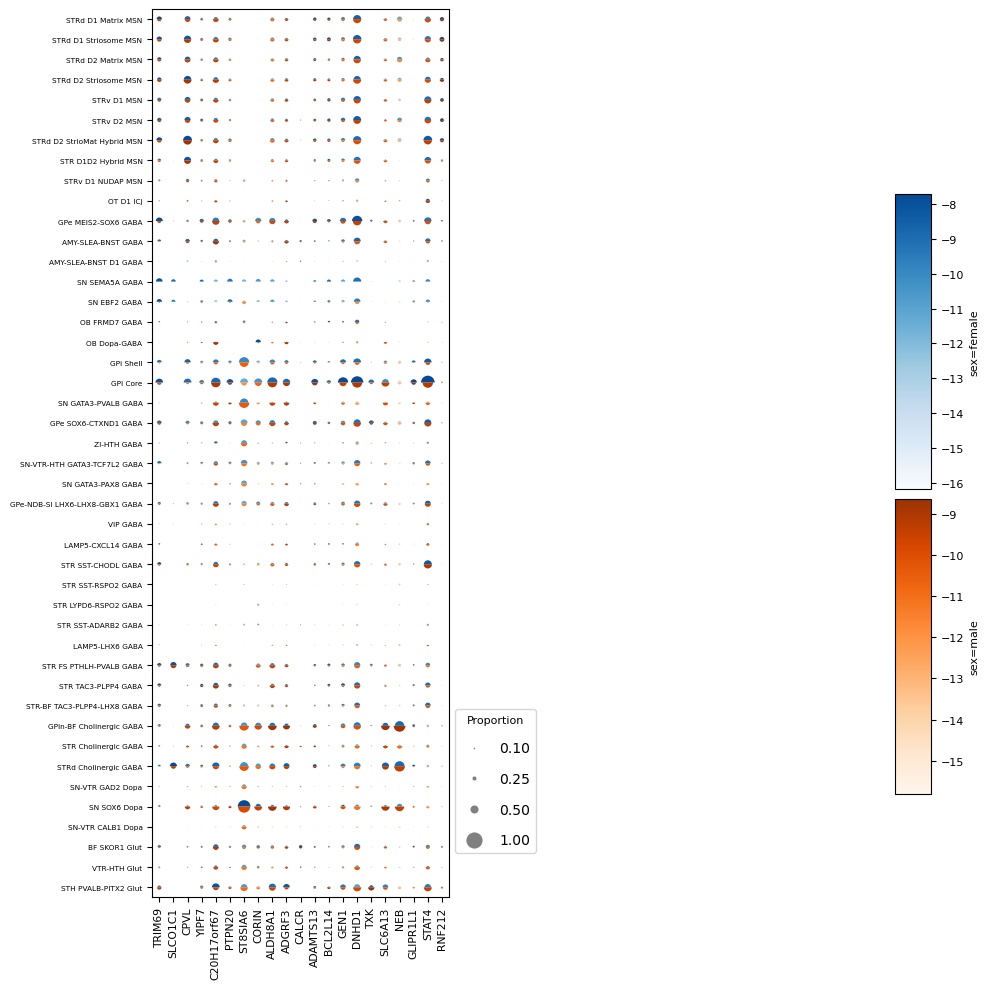

/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:877: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.75, 1])


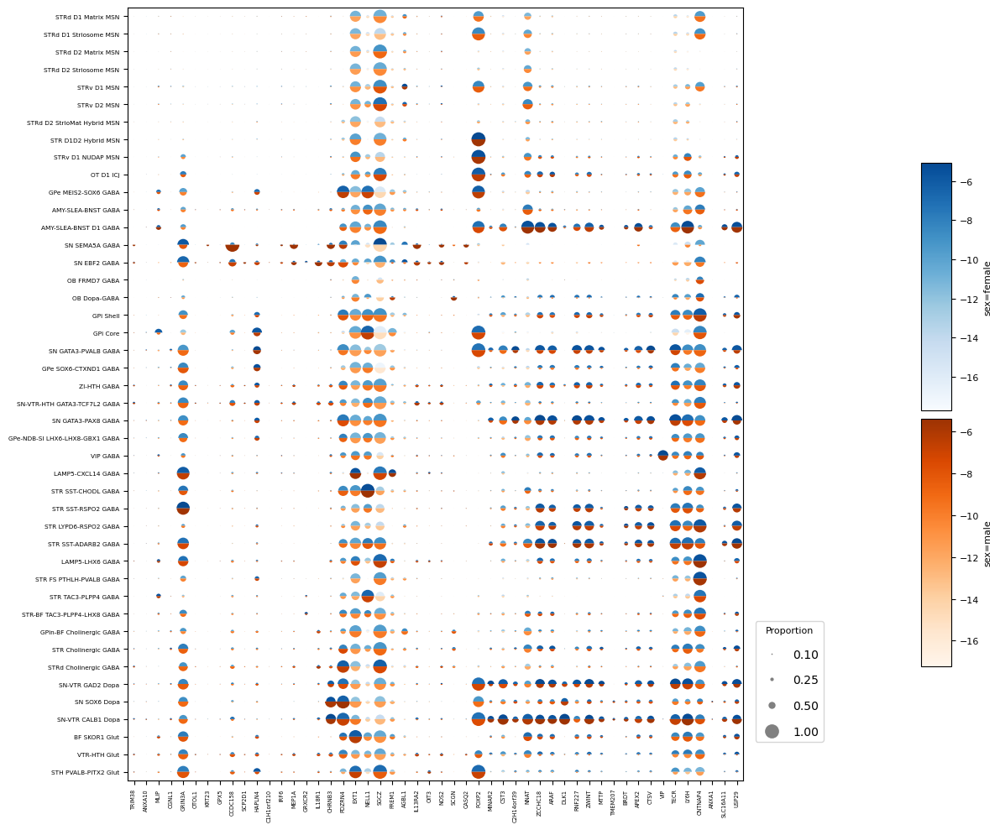

In [275]:
gene_order = antipode.post.uniqlist(list(itertools.chain(*up_genes.values())))
ax,fig = antipode.plotting.pie_dotplot_xr(sads.sel(var=gene_order),row_dim=leaf_key,col_dim='var',slice_dim='sex',
      scale_by='column', max_radius=0.4, figsize=(12, 10),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
# plt.savefig(os.path.join(sc.settings.figdir, 'triple_conserved_marker_dots.svg'), format='svg')
plt.show()

gene_order = antipode.post.uniqlist(list(itertools.chain(*down_genes.values())))
ax,fig = antipode.plotting.pie_dotplot_xr(sads.sel(var=gene_order),row_dim=leaf_key,col_dim='var',slice_dim='sex',
      scale_by='column', max_radius=0.4, figsize=(12, 10),fontsize_mul=0.78,x_spacing=.7, y_spacing=1.)
# plt.savefig(os.path.join(sc.settings.figdir, 'triple_conserved_marker_dots.svg'), format='svg')
plt.show()

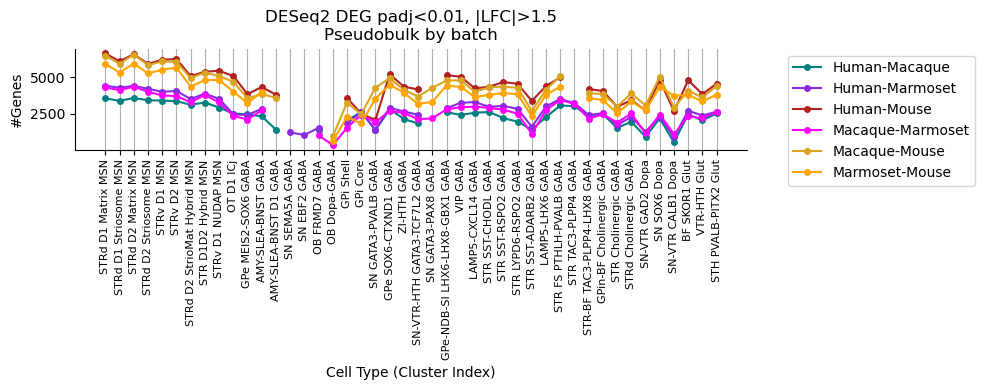

In [276]:
import numpy as np
import matplotlib.pyplot as plt
import os

# thresholds
padj_thresh = 0.01
lfc_thresh = 1.5

# counts per (contrast, cluster): padj<0.01 and |lfc|>1.5
cond = (deds["padj"] < padj_thresh) & (np.abs(deds["lfc"]) > lfc_thresh)
counts = cond.fillna(False).sum(dim="gene").where(lambda x: x > 0)  # zeros -> NaN

# cluster labels from the dataset (same order used when building deds)
cluster_labels = deds.coords[leaf_key].to_numpy()
x = np.arange(cluster_labels.size)

# optional: custom colors for specific contrasts
palette = {'Human-Macaque':'teal','Human-Marmoset':'blueviolet','Macaque-Marmoset':'fuchsia','Human-Mouse':'firebrick','Macaque-Mouse':'goldenrod','Marmoset-Mouse':'orange'}

plt.figure(figsize=(10, 4))
for contrast in counts["contrast"].to_numpy():
    if 'sex' in contrast:
        continue
    y = counts.sel(contrast=contrast).to_numpy()
    color = palette.get(contrast, None)
    if color is None:
        plt.plot(x, y, marker='o', markersize=4, label=contrast)
    else:
        plt.plot(x, y, marker='o', markersize=4, label=contrast, c=color)

plt.xticks(ticks=x, labels=cluster_labels, rotation=90, fontsize=8)
plt.xlabel("Cell Type (Cluster Index)")
plt.ylabel("#Genes")
plt.title("DESeq2 DEG padj<0.01, |LFC|>1.5\nPseudobulk by batch")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='x')
plt.savefig(os.path.join(sc.settings.figdir, 'de_per_group.pdf'), format='pdf')
plt.show()


Human-Macaque


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


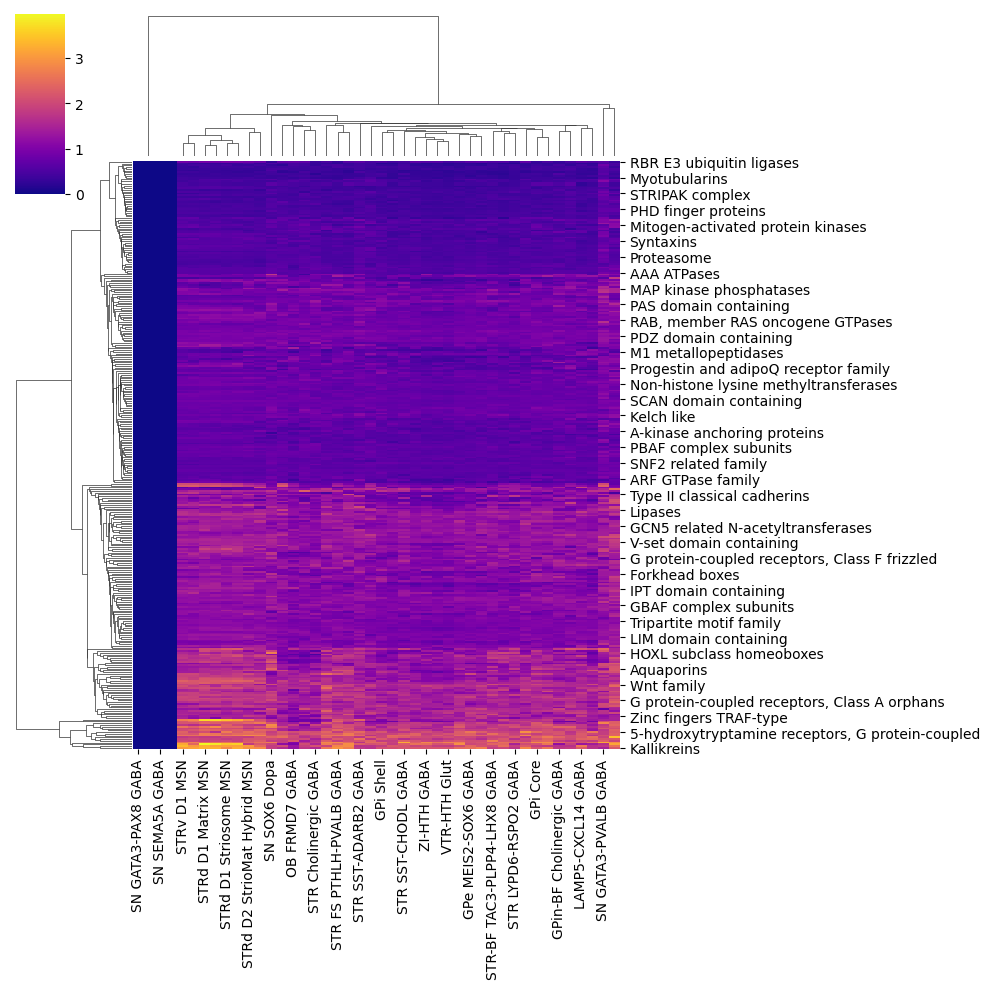

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


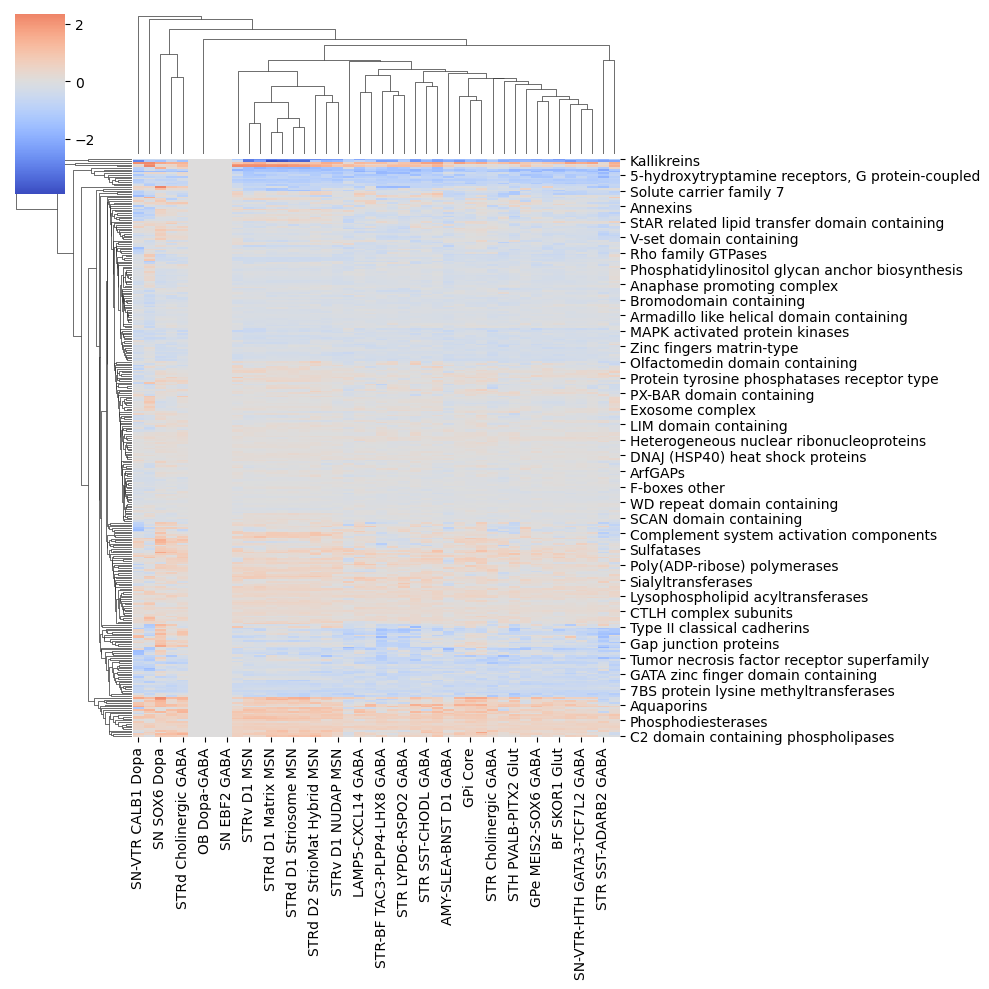

Human-Marmoset


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


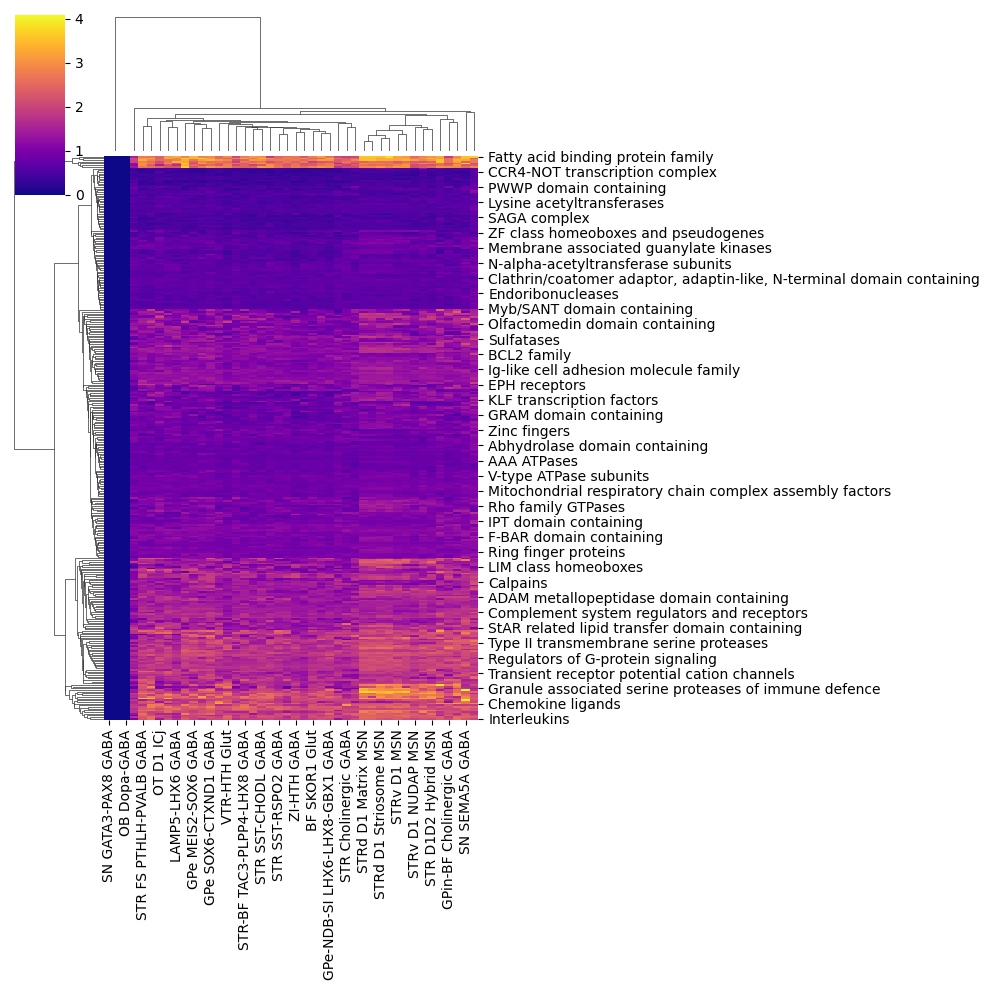

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


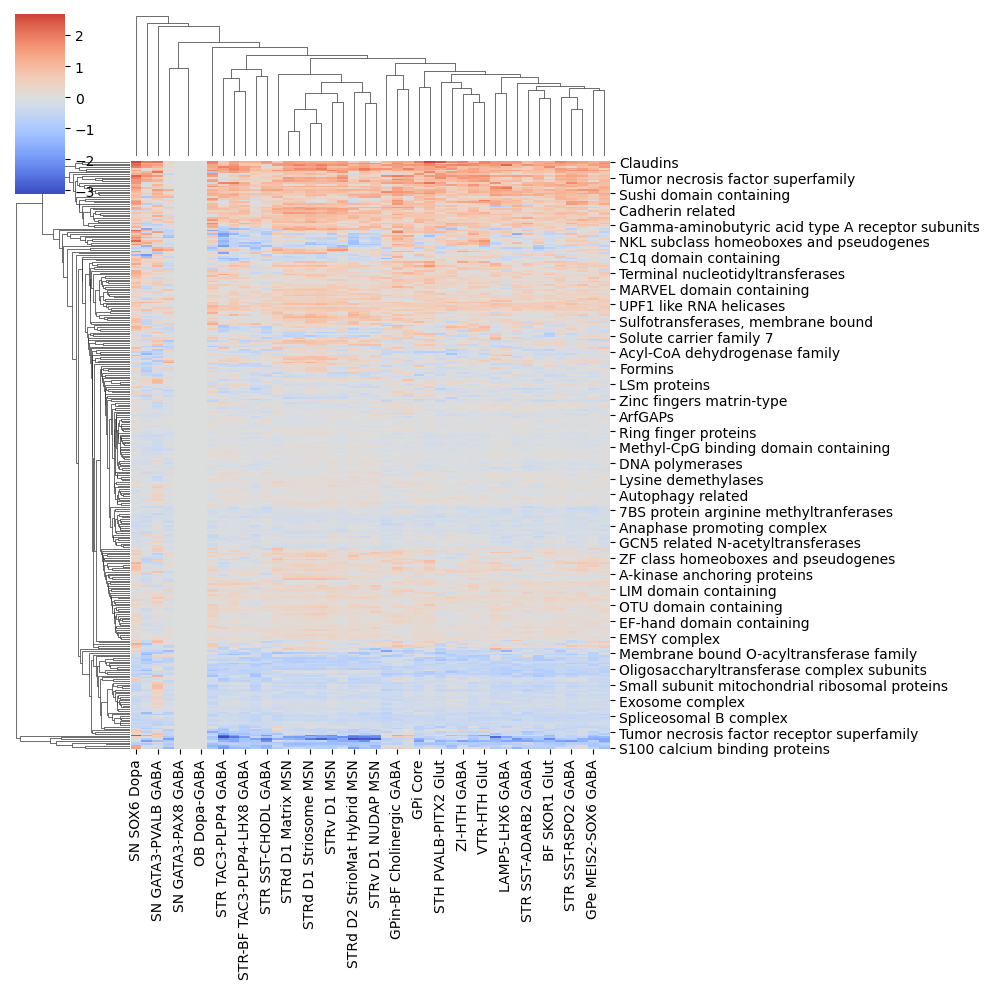

Human-Mouse


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


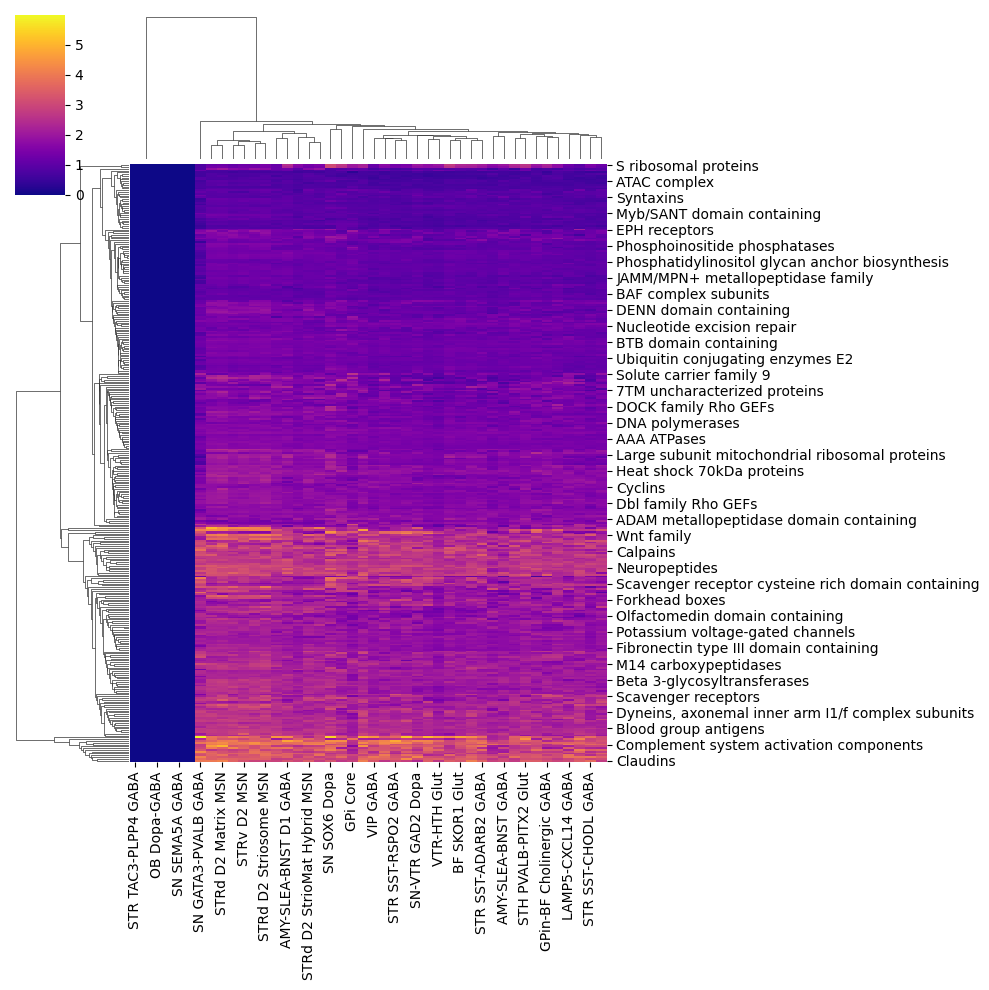

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


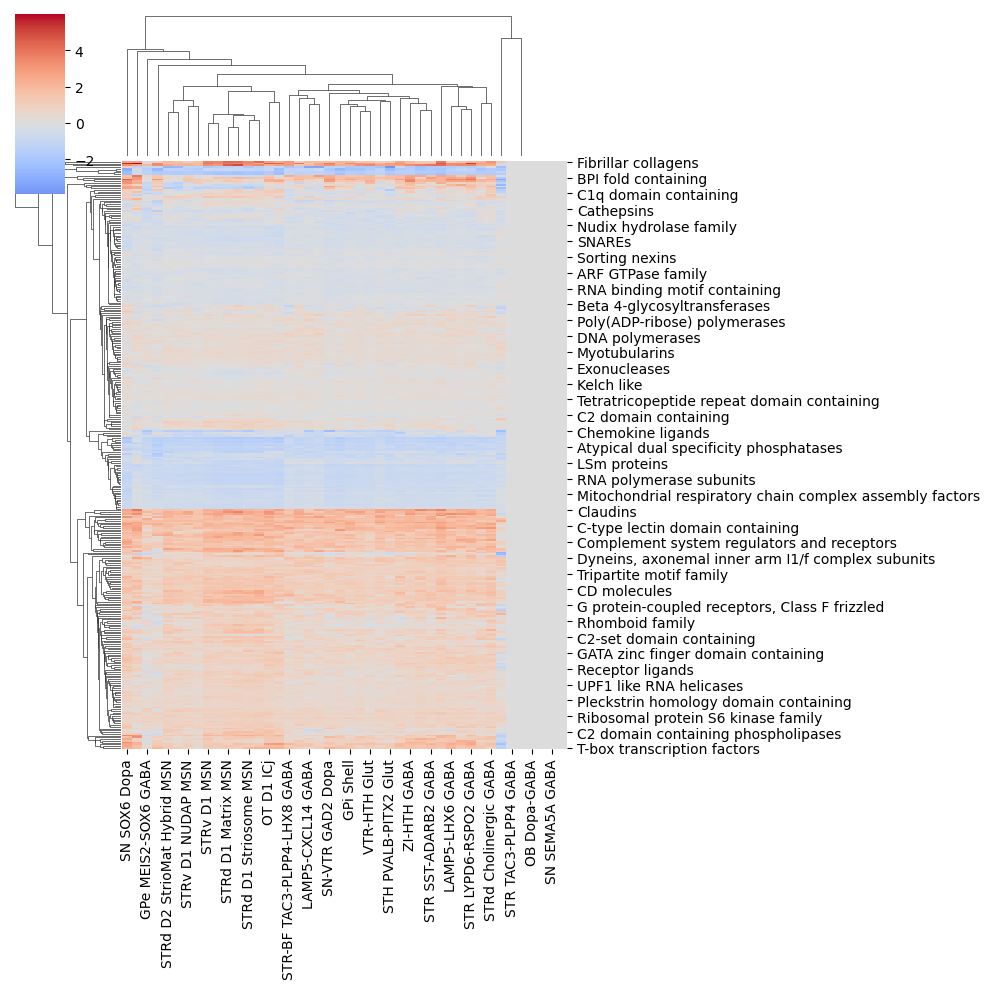

In [236]:
lfc = deds.sel(contrast=['Human-Macaque','Human-Marmoset','Human-Mouse'])['lfc']
mads = np.abs(lfc).mean('gene').to_dataframe().unstack().droplevel(0, axis=1)

family_tab = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/gene_family/hgnc_gene_family_info.csv',sep=',')
family_tab = family_tab.loc[family_tab['symbol'].isin(adata.var.index),:]
vcs = family_tab['family_name'].value_counts()
family_tab = family_tab.loc[family_tab['family_name'].isin(vcs.index[vcs>10])]


family_dicts = {x:list(family_tab.loc[family_tab['family_name']==x,'symbol']) for x in  family_tab['family_name'].unique()}
for species in lfc.coords['contrast'].data:
    print(species)
    unsigned = {}
    signed = {}
    for key,value in family_dicts.items():
        signed[key] = lfc.sel(gene=value,contrast=species).mean('gene')
        unsigned[key] = np.abs(lfc.sel(gene=value,contrast=species)).mean('gene')
    
    unsigned_df = pd.DataFrame(unsigned,index=lfc.coords[leaf_key].data)
    unsigned_df = unsigned_df.fillna(0)
    seaborn.clustermap(unsigned_df.T,cmap='plasma')
    plt.show()
    
    signed_df = pd.DataFrame(signed,index=lfc.coords[leaf_key].data)
    signed_df = signed_df.fillna(0)
    seaborn.clustermap(signed_df.T,cmap='coolwarm',center=0)
    plt.show()

In [92]:
pd.set_option('display.max_rows', 100)
vcs = adata.obs.groupby('organism')[leaf_key].value_counts().unstack().T

/scratch/fast/4200988/ipykernel_2968642/624132982.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  vcs = adata.obs.groupby('organism')[leaf_key].value_counts().unstack().T


/scratch/fast/4200988/ipykernel_2968642/2717375132.py:7: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_species = ads.dims[species_key]
/scratch/fast/4200988/ipykernel_2968642/2717375132.py:8: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_clusters = ads.dims[leaf_key]


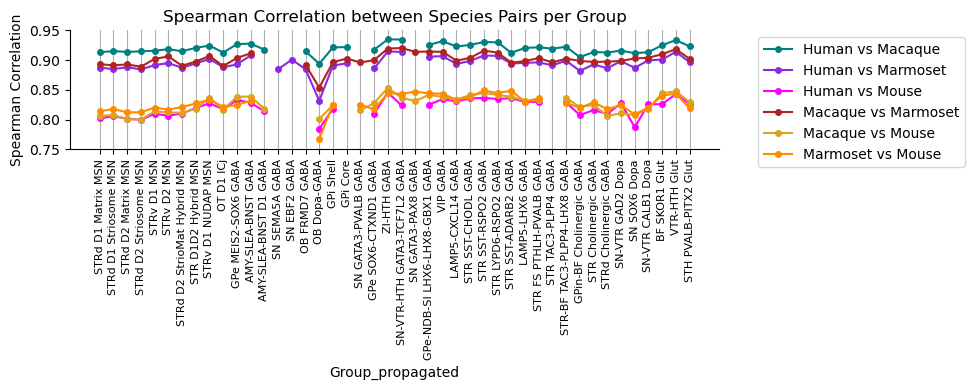

In [93]:
# simple older correlations

from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import itertools

num_species = ads.dims[species_key]
num_clusters = ads.dims[leaf_key]
species_cats = adata.obs[species_key].cat.categories

# Generate all species pairs (combinations)
species_pairs = list(itertools.combinations(range(num_species), 2))
correlations = {pair: [] for pair in species_pairs}

# Compute Spearman correlation for each cell type for every species pair
for cluster in range(num_clusters):
    for pair in species_pairs:
        i, j = pair
        # Extract gene expression vectors for the current cell type
        if (vcs.iloc[cluster,i] > 50) &  (vcs.iloc[cluster,j] > 50):
            expr_i = ads['scalars'].data[i, cluster, :]
            expr_j = ads['scalars'].data[j, cluster, :]
            rho, _ = spearmanr(expr_i, expr_j)
            correlations[pair].append(rho)
        else:
            correlations[pair].append(np.nan)
palette = {'Human-Macaque':'teal','Human-Marmoset':'blueviolet','Macaque-Marmoset':'fuchsia','Human-Mouse':'firebrick','Macaque-Mouse':'goldenrod','Marmoset-Mouse':'darkorange'}

# Create the line plot
x = np.arange(num_clusters)
plt.figure(figsize=(10, 4))
for i,(pair, corr_vals) in enumerate(correlations.items()):
    label = f"{species_cats[pair[0]]} vs {species_cats[pair[1]]}"
    plt.plot(x, corr_vals, marker='o',markersize=4, label=label,c=list(palette.values())[i])

plt.xticks(ticks=x, labels=adata.obs[leaf_key].cat.categories, rotation=90,fontsize=8)
plt.xlabel(leaf_key)
plt.ylabel("Spearman Correlation")
plt.title("Spearman Correlation between Species Pairs per Group")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.tight_layout()
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.ylim(0.75, .95)
ax.grid(axis='x')
plt.savefig(os.path.join(sc.settings.figdir, 'spearman_correlations_group.pdf'), format='pdf')
plt.show()


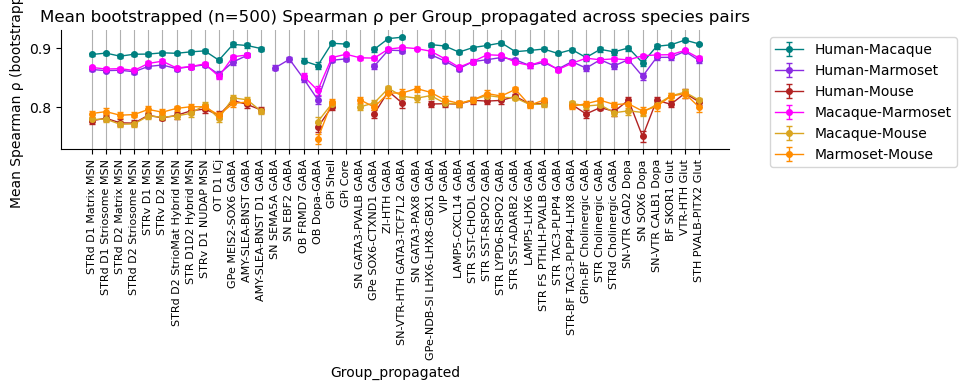

In [175]:
# bootstrap for correlations

rng = np.random.default_rng(42)
min_cells = 50 # less than this # get excluded all together
n_boot = 500 
n_per_group = 100

leaf_levels = list(ads.coords[leaf_key].values)
gene_names = list(ads.coords["var"].values)
species_cats = list(adata.obs[species_key].cat.categories)
coords = ads.coords

# species pairs by index in species_cats
species_pairs = list(itertools.combinations(range(len(species_cats)), 2))

counts = pd.crosstab(adata.obs[leaf_key], adata.obs[species_key]).reindex(index=leaf_levels, columns=species_cats, fill_value=0)

# helper: sample exactly n_per_group per leaf (with replacement)
def sample_indices_per_species_leaf(adata, species_key, leaf_key, n_per_group, rng):
    idx = []
    obs = adata.obs
    for sp in adata.obs[species_key].cat.categories:
        for leaf in adata.obs[leaf_key].cat.categories:
            pool = obs.index[(obs[species_key] == sp) & (obs[leaf_key] == leaf)].to_numpy()
            if pool.size == 0:
                continue
            take = rng.choice(pool, size=n_per_group, replace=True)
            idx.append(take)
    return np.concatenate(idx).astype(str) if idx else np.array([], dtype=str)

def rho_spearman(x, y):
    r, _ = spearmanr(x, y, nan_policy="omit")
    return r

if not  os.path.exists(os.path.join(sc.settings.figdir, f'boot_spearman_pairs_{leaf_key}.csv')):
    # boot results: dict[(i,j)] -> DataFrame (leaf × boot)
    boot_rhos = {pair: pd.DataFrame(index=leaf_levels, columns=np.arange(n_boot), dtype=float)
                 for pair in species_pairs}
    
    for b in range(n_boot):
        sel = sample_indices_per_species_leaf(adata, species_key, leaf_key, n_per_group, rng)
        if sel.size == 0:
            raise ValueError("No cells selected in bootstrap; check group labels present in adata.obs.")
        adb = adata[sel, :]
    
        lrm_b, _ = antipode.model_functions.get_real_leaf_means(
            adb, species_key, leaf_key, layer=layer_key
        )
        lrm_b = xr.DataArray(
            lrm_b,
            dims=[species_key, leaf_key, "var"],
            coords=coords,
        )
        lrm_b = lrm_b.sel({leaf_key: leaf_levels, "var": gene_names, species_key: species_cats})
    
        for leaf in leaf_levels:
            for (i, j) in species_pairs:
                si, sj = species_cats[i], species_cats[j]
                if (counts.loc[leaf, si] < min_cells) or (counts.loc[leaf, sj] < min_cells):
                    boot_rhos[(i, j)].loc[leaf, b] = np.nan
                    continue
                xi = lrm_b.sel({species_key: si, leaf_key: leaf}).to_numpy().ravel()
                xj = lrm_b.sel({species_key: sj, leaf_key: leaf}).to_numpy().ravel()
                boot_rhos[(i, j)].loc[leaf, b] = rho_spearman(xi, xj)
    
    # summarize to long table
    rows = []
    for (i, j), df in boot_rhos.items():
        mean_rho = df.mean(axis=1)
        sd_rho = df.std(axis=1, ddof=1)
        q025 = df.quantile(0.025, axis=1)
        q975 = df.quantile(0.975, axis=1)
        pair_label = f"{species_cats[i]}-{species_cats[j]}"
        tmp = pd.DataFrame({
            "leaf": df.index,
            "pair": pair_label,
            "mean_rho": mean_rho.values,
            "sd_rho": sd_rho.values,
            "p2p5": q025.values,
            "p97p5": q975.values,
            "n_boot": n_boot
        })
        rows.append(tmp)
    summary = pd.concat(rows, ignore_index=True)
    summary.to_csv(os.path.join(sc.settings.figdir, f'boot_spearman_pairs_{leaf_key}.csv'))
else:
    summary = pd.read_csv(os.path.join(sc.settings.figdir, f'boot_spearman_pairs_{leaf_key}.csv'),index_col=0)

# line plot of mean bootstrapped correlations per pair across leaves
palette = {
    'Human-Macaque':'teal','Human-Marmoset':'blueviolet','Macaque-Marmoset':'fuchsia',
    'Human-Mouse':'firebrick','Macaque-Mouse':'goldenrod','Marmoset-Mouse':'darkorange'
}
x = np.arange(len(leaf_levels))
plt.figure(figsize=(10, 4))

for pair_label, gdf in summary.groupby("pair"):
    gdf = gdf.set_index("leaf").reindex(leaf_levels)
    y = gdf["mean_rho"].to_numpy()
    lo = gdf["p2p5"].to_numpy()
    hi = gdf["p97p5"].to_numpy()

    # m = np.isfinite(y) & np.isfinite(lo) & np.isfinite(hi)
    # if m.sum() == 0:
    #     continue

    # xm, ym, lom, him = x[m], y[m], lo[m], hi[m]
    xm, ym, lom, him = x, y, lo, hi
    c = palette.get(pair_label, None)

    yerr = np.vstack([ym - lom, him - ym])
    plt.errorbar(xm, ym, yerr=yerr, fmt='-o', capsize=2, markersize=4, linewidth=1,
                 color=c if c else None, label=pair_label)


plt.xticks(ticks=x, labels=leaf_levels, rotation=90, fontsize=8)
plt.xlabel(leaf_key)
plt.ylabel("Mean Spearman ρ (bootstrapped)")
plt.title(f"Mean bootstrapped (n={n_boot}) Spearman ρ per {leaf_key} across species pairs")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='x')
plt.savefig(os.path.join(sc.settings.figdir, f'boot_spearman_pairs_{leaf_key}.pdf'), format='pdf')
plt.show()

# gene lists analyses

In [29]:
import gseapy
gok = pd.Series(gseapy.get_library('GO_Biological_Process_2025').keys())
go = gseapy.get_library('GO_Biological_Process_2025')
axon_guidance = {k:go[k] for k in gok[gok.str.lower().str.contains('axon guidance')]}
axon_guidance = list(set(itertools.chain(*[axon_guidance[k] for k in axon_guidance.keys()])))

synapse = {k:go[k] for k in gok[gok.str.lower().str.contains('synapse')]}
synapse = list(set(itertools.chain(*[synapse[k] for k in synapse.keys()])))

ion = {k:go[k] for k in gok[gok.str.lower().str.contains('ion channel')]}
ion = list(set(itertools.chain(*[ion[k] for k in ion.keys()])))


tf_list = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/TFs_lambert_pmid29425488_1.01.txt')['hgnc_symbol']
shared_tfs = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/gene_lists/dev_adult_shared_tfs.tsv',sep='\t',index_col=0)
neuron_shared_tfs = pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/gene_lists/dev_adult_shared_neuron_tfs.tsv',sep='\t',index_col=0)
shared_tfs = shared_tfs.loc[~shared_tfs['tfs'].isna()]
neuron_shared_tfs = neuron_shared_tfs.loc[~neuron_shared_tfs['tfs'].isna()]
shared_tfs_list = list(set([x for sublist in shared_tfs['tfs'].str.split(',') for x in sublist if len(x)]))
neuron_shared_tfs_list = list(set([x for sublist in neuron_shared_tfs['tfs'].str.split(',') for x in sublist]))

In [30]:
gene_lists = {'synapse':synapse,'axon guidance':axon_guidance,'tfs':tf_list,'ion channel':ion,'all':adata.var.index}

In [31]:
msn_ads = ads.sel({leaf_key:ads.coords[leaf_key][ads.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]})

<Axes: ylabel='Count'>

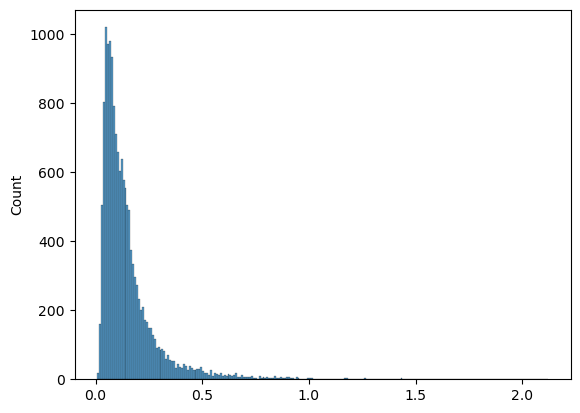

In [32]:
seaborn.histplot(msn_ads['scalars'].std(leaf_key).min(species_key).data)

In [33]:
msn_var_genes = msn_ads.coords['var'].data[msn_ads['scalars'].std(leaf_key).min(species_key).argsort()][-5000:]

In [34]:
msn_ads = msn_ads.sel(var=msn_var_genes)

/scratch/fast/4386645/ipykernel_2869982/642827102.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(species_cats))


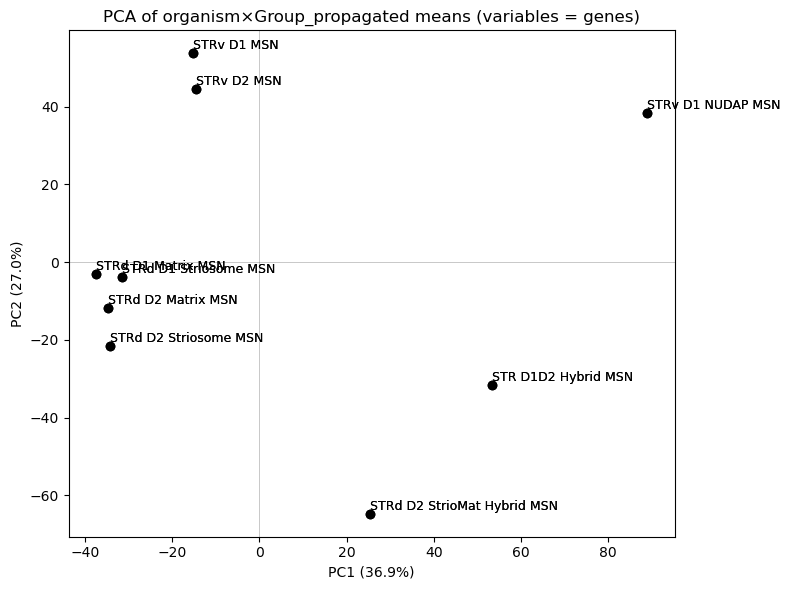

,species,Group_propagated,PC1,PC2
0,Human,STRd D1 Matrix MSN,37.440680,-3.013944
1,Human,STRd D1 Striosome MSN,31.629801,-3.856445
2,Human,STRd D2 Matrix MSN,34.634157,-11.834740
3,Human,STRd D2 Striosome MSN,34.209220,-21.583902
4,Human,STRv D1 MSN,15.230960,53.715712


In [35]:
from sklearn.decomposition import PCA,FastICA

# data: (species, leaf, var)
sub_ads = msn_ads['scalars'].sel({species_key:['Human','Human']})
A = sub_ads.transpose(species_key, leaf_key, 'var').to_numpy()
S, L, G = A.shape
X = A.reshape(S * L, G)

# standardize genes
mu = X.mean(0)
sd = X.std(0, ddof=0)
sd[sd == 0] = 1.0
Xz = (X - mu) / sd

pca = PCA(n_components=5, random_state=0)
PC = pca.fit_transform(Xz)
try:
    ev = pca.explained_variance_ratio_
except:
    ev = [0 for x in range(PC.shape[-1])]

species_cats = list(sub_ads.coords[species_key].values)
leaf_cats = list(sub_ads.coords[leaf_key].values)

# labels and species per row
labels = [f"{lv}" for sp in species_cats for lv in leaf_cats]
species_per_row = [sp for sp in species_cats for _ in leaf_cats]

# colors per species (use adata.uns['species_colors'] if present, else tab10)
if isinstance(adata.uns.get('species_colors', None), (list, np.ndarray)) and \
   len(adata.uns['species_colors']) >= len(species_cats):
    sp_colors = dict(zip(species_cats, list(adata.uns['species_colors'])[:len(species_cats)]))
else:
    cmap = plt.cm.get_cmap('tab10', len(species_cats))
    sp_colors = {sp: cmap(i) for i, sp in enumerate(species_cats)}

plt.figure(figsize=(8, 6))
for i, (x, y) in enumerate(PC[:, :2]):
    sp = species_per_row[i]
    plt.plot(-x, y, 'o', color='black') 
    t = plt.text(-x, y+1, labels[i], color='black', fontsize=9)
    t.set_rasterized(True)

plt.axhline(0, lw=0.5, color='k', alpha=0.3)
plt.axvline(0, lw=0.5, color='k', alpha=0.3)
plt.xlabel(f"PC1 ({ev[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({ev[1]*100:.1f}%)")
plt.title(f"PCA of {species_key}×{leaf_key} means (variables = genes)")
plt.tight_layout()
outfile = os.path.join(sc.settings.figdir, f"pca_{leaf_key}_text.png")
plt.savefig(outfile, format="png")
plt.show()

# optional: PC table
pc_df = pd.DataFrame({
    "species": species_per_row,
    leaf_key: [lv for _ in species_cats for lv in leaf_cats],
    "PC1": PC[:, 0],
    "PC2": PC[:, 1],
})
pc_df.head()


In [36]:
gene_loadings = pd.DataFrame(pca.components_,columns=msn_ads.coords['var'].data)

In [37]:
gene_loadings.index = list(range(1,len(gene_loadings.index)+1))

In [38]:
lfc = msn_ads - msn_ads.mean(species_key)

In [39]:
mads = np.abs(lfc).mean(species_key)

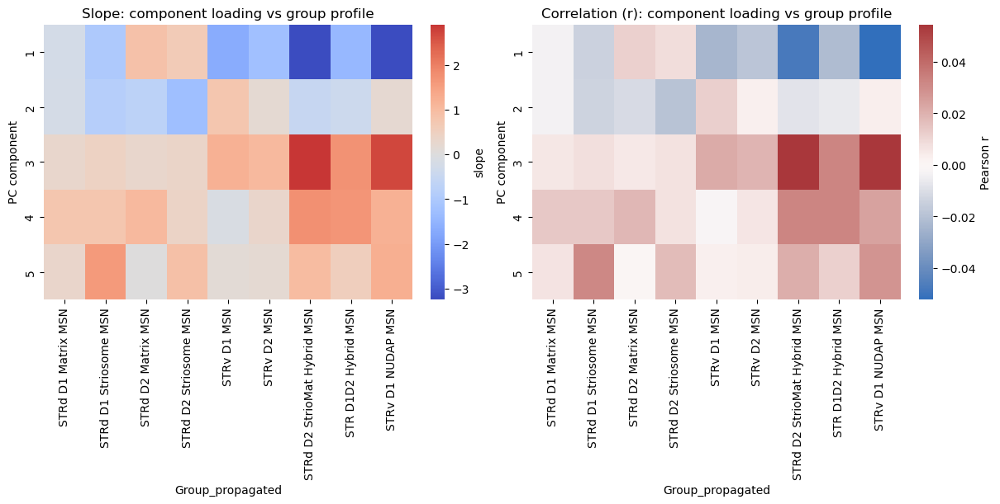

(   STRd D1 Matrix MSN  STRd D1 Striosome MSN  STRd D2 Matrix MSN  \
 1           -0.247733              -1.004316            0.873505   
 2           -0.231662              -0.861860           -0.720654   
 3            0.310392               0.447658            0.295551   
 4            0.777512               0.771808            1.052343   
 5            0.323263               1.600261            0.011496   
 
    STRd D2 Striosome MSN  STRv D1 MSN  STRv D2 MSN  \
 1               0.627380    -1.662694    -1.251788   
 2              -1.287464     0.744552     0.179075   
 3               0.382262     1.194919     1.032191   
 4               0.390740    -0.096137     0.326266   
 5               0.888502     0.141249     0.176703   
 
    STRd D2 StrioMat Hybrid MSN  STR D1D2 Hybrid MSN  STRv D1 NUDAP MSN  
 1                    -3.237214            -1.431796          -3.215578  
 2                    -0.509384            -0.387300           0.192807  
 3                     2.90268

In [40]:
from scipy.stats import linregress
genes_mads = pd.Index(mads.coords['var'].values.astype(str))
genes_load = pd.Index(gene_loadings.columns.astype(str))
common = genes_mads.intersection(genes_load)
if common.empty:
    raise ValueError("No overlapping genes between mads.var and gene_loadings.columns")

# restrict and order consistently
gl = np.abs(gene_loadings).loc[:, common]
X_groups = mads['scalars'].sel(var=common)  # (Group_propagated, var)

comp_labels = gl.index.astype(str).tolist()
group_labels = mads.coords['Group_propagated'].values.astype(str).tolist()

n_comp = len(comp_labels)
n_grp = len(group_labels)

slope_mat = np.full((n_comp, n_grp), np.nan, dtype=float)
r_mat     = np.full((n_comp, n_grp), np.nan, dtype=float)

# compute slope and r per (component, group)
for ci, comp in enumerate(gl.index):
    x = gl.loc[comp].to_numpy()
    for gi, grp in enumerate(group_labels):
        y = X_groups.sel(Group_propagated=grp).to_numpy()
        m = np.isfinite(x) & np.isfinite(y)
        if m.sum() >= 3 and np.std(x[m]) > 0 and np.std(y[m]) > 0:
            lr = linregress(x[m], y[m])
            slope_mat[ci, gi] = lr.slope
            r_mat[ci, gi] = lr.rvalue

slope_df = pd.DataFrame(slope_mat, index=comp_labels, columns=group_labels)
r_df     = pd.DataFrame(r_mat,     index=comp_labels, columns=group_labels)

# ---- plotting ----
fig_w = max(12, 0.45 * len(group_labels) * 2)
fig_h = max(6,  0.35 * len(comp_labels))
fig, axes = plt.subplots(1, 2, figsize=(fig_w, fig_h), constrained_layout=True)

seaborn.heatmap(slope_df, ax=axes[0], cmap="coolwarm", center=0,
                cbar_kws={"label": "slope"})
axes[0].set_title("Slope: component loading vs group profile")
axes[0].set_xlabel("Group_propagated")
axes[0].set_ylabel("PC component")

seaborn.heatmap(r_df, ax=axes[1], cmap="vlag", center=0,
                cbar_kws={"label": "Pearson r"})
axes[1].set_title("Correlation (r): component loading vs group profile")
axes[1].set_xlabel("Group_propagated")
axes[1].set_ylabel("PC component")

# out_png = os.path.join(sc.settings.figdir, "loadings_vs_group_heatmaps.png")
# out_pdf = os.path.join(sc.settings.figdir, "loadings_vs_group_heatmaps.pdf")
# plt.savefig(out_png, dpi=300)
# plt.savefig(out_pdf)
plt.show()

slope_df, r_df


In [41]:
# for k in gene_lists.keys():
#     # species-mean leaf profiles: (leaf, gene)
#     sub_ads = msn_ads.sel({'var':msn_ads.coords['var'][msn_ads.coords['var'].isin(gene_lists[k])]})['scalars']
#     A = sub_ads.mean(species_key).to_numpy()#.transpose(species_key, leaf_key, 'var')
#     L, G = A.shape
#     X = A.reshape( L, G)
    
#     # standardize genes
#     mu = X.mean(0)
#     sd = X.std(0, ddof=0)
#     sd[sd == 0] = 1.0
#     Xz = X-mu #since it's already log scaled, dividing by std would throw off distances
    
#     pca = PCA(n_components=4, random_state=0)
#     PC = pca.fit_transform(Xz)
#     try:
#         ev = pca.explained_variance_ratio_
#     except:
#         ev = [0 for x in range(PC.shape[-1])]
    
#     species_cats = list(sub_ads.coords[species_key].values)
#     leaf_cats = list(sub_ads.coords[leaf_key].values)
    
#     # labels and species per row
#     labels = [f"{sp}-{lv}" for sp in species_cats for lv in leaf_cats]
#     species_per_row = [sp for sp in species_cats for _ in leaf_cats]
    
#     # colors per species (use adata.uns['species_colors'] if present, else tab10)
#     if isinstance(adata.uns.get('species_colors', None), (list, np.ndarray)) and \
#        len(adata.uns['species_colors']) >= len(species_cats):
#         sp_colors = dict(zip(species_cats, list(adata.uns['species_colors'])[:len(species_cats)]))
#     else:
#         cmap = plt.cm.get_cmap('tab10', len(species_cats))
#         sp_colors = {sp: cmap(i) for i, sp in enumerate(species_cats)}
    
#     plt.figure(figsize=(12, 8))
#     for i, (x, y) in enumerate(PC[:, :2]):
#         sp = species_per_row[i]
#         plt.plot(x, y, 'o', color=sp_colors[sp]) 
#         t = plt.text(x, y, labels[i], color=sp_colors[sp], fontsize=8, clip_on=False)
#         t.set_rasterized(True)
    
#     plt.axhline(0, lw=0.5, color='k', alpha=0.3)
#     plt.axvline(0, lw=0.5, color='k', alpha=0.3)
#     plt.xlabel(f"PC1 ({ev[0]*100:.1f}%)")
#     plt.ylabel(f"PC2 ({ev[1]*100:.1f}%)")
#     plt.title(f"PCA of {leaf_key} variable: {k} genes")
#     plt.tight_layout()
#     outfile = os.path.join(sc.settings.figdir, f"pca_{species_key}_by_{k}_text.png")
#     # plt.savefig(outfile, format="png")
#     plt.show()


/scratch/fast/4386645/ipykernel_2869982/906371324.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


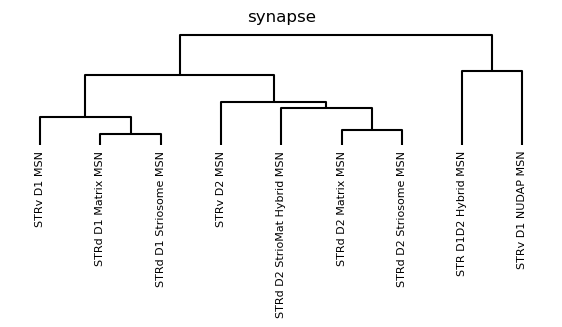

/scratch/fast/4386645/ipykernel_2869982/906371324.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


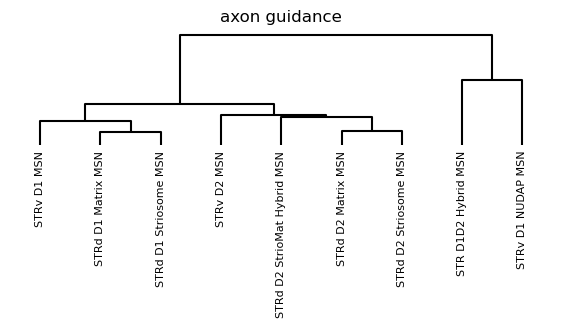

/scratch/fast/4386645/ipykernel_2869982/906371324.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


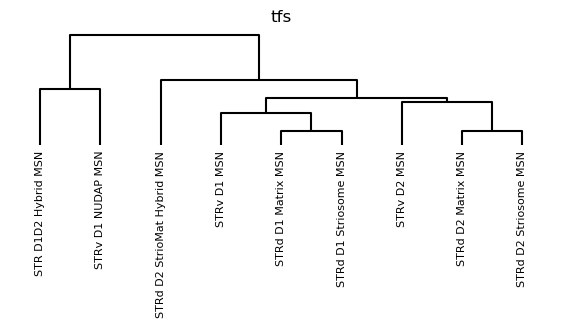

/scratch/fast/4386645/ipykernel_2869982/906371324.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


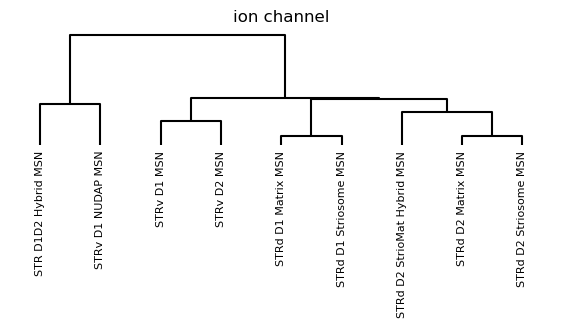

/scratch/fast/4386645/ipykernel_2869982/906371324.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


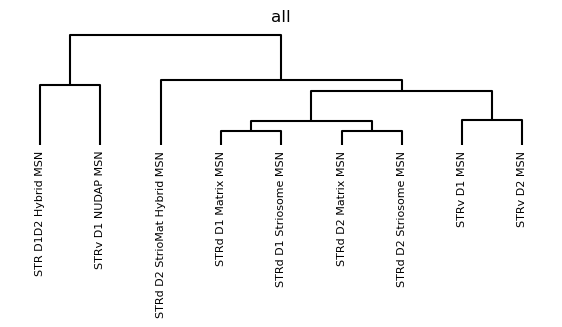

In [42]:
from scipy.stats import spearmanr
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform

for k in gene_lists.keys():
    # species-mean leaf profiles: (leaf, gene)
    sub_ads = msn_ads.sel({species_key:['Human','Macaque','Marmoset','Mouse'],'var':msn_ads.coords['var'][msn_ads.coords['var'].isin(gene_lists[k])]})
    leaf_means = sub_ads['scalars'].mean(dim=species_key)
    leaf_levels = list(leaf_means.coords[leaf_key].values)
    
    X = leaf_means.transpose(leaf_key, 'var').to_numpy()  # (n_leaf, n_gene)
    mask = np.nanstd(X, axis=0) > 0
    X = X[:, mask]  # drop constant genes
    
    # Spearman correlation among leaves (columns=leaves -> transpose first)
    rho = spearmanr(X.T, axis=0, nan_policy='omit').correlation
    rho = np.clip(rho, -1.0, 1.0)
    
    # distance matrix and linkage
    D = 1.0 - rho
    D = (D + D.T) / 2.0
    np.fill_diagonal(D, 0.0)
    Z = linkage(squareform(D), method='average')
    
    fig, ax = plt.subplots(figsize=(7, 1.5))
    dendrogram(
        Z,
        labels=leaf_levels,
        leaf_rotation=90,
        leaf_font_size=8,
        above_threshold_color='k',
        link_color_func=lambda _: 'k',
        ax = ax
    )
    
    ax.get_yaxis().set_visible(False)
    ax.tick_params(axis='x', which='both', length=0)
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.margins(y=0.02)
    plt.title(f"{k}")
    plt.tight_layout()
    outfile = os.path.join(sc.settings.figdir, f"dendrogram_{k}_spearmanmean.pdf")
    plt.savefig(outfile, format="pdf",bbox_inches='tight')
    plt.show()

# striosome, dv, d1d2 effect on divergence

In [43]:
adata.obs['striosome'] = 'nan' 
adata.obs.loc[adata.obs['Group_propagated'].str.contains('Striosome'),'striosome'] = 'Striosome'
adata.obs.loc[adata.obs['Group_propagated'].str.contains('Matrix'),'striosome'] = 'Matrix'


adata.obs['d1d2'] = 'nan'
adata.obs.loc[adata.obs['Group_propagated'].str.contains('STRd D1'),'d1d2'] = 'D1'
adata.obs.loc[adata.obs['Group_propagated'].str.contains('STRd D2'),'d1d2'] = 'D2'
adata.obs.loc[adata.obs['Group_propagated'].str.contains('STRv D1 MSN'),'d1d2'] = 'D1'
adata.obs.loc[adata.obs['Group_propagated'].str.contains('STRv D2 MSN'),'d1d2'] = 'D2'

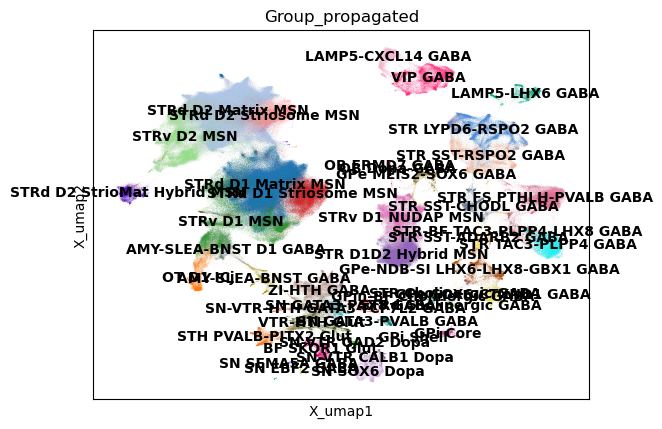

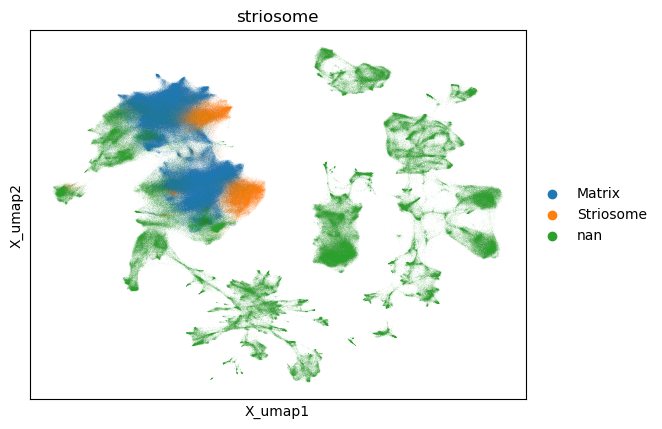

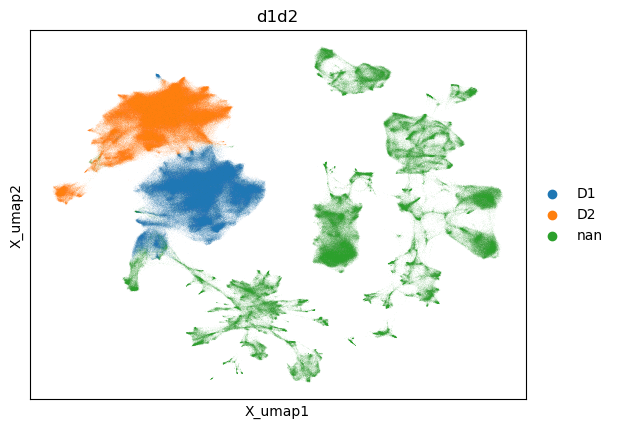

In [44]:
sc.pl.embedding(adata,color='Group_propagated',basis='X_umap',legend_loc='on data')
sc.pl.embedding(adata,color='striosome',basis='X_umap')
sc.pl.embedding(adata,color='d1d2',basis='X_umap')

In [45]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [46]:
def pairwise_wilcoxon_xr(
    adata,
    contrasts,
    *,
    species_key=None,          # e.g. "organism" or None
    layer=None,
    use_raw=False,
    corr_method="benjamini-hochberg",
    min_cells=5,
    pts=True
):
    # contrasts: list of dicts with keys: col, case, ref, optional name
    genes = adata.var_names.to_list()
    if species_key is None:
        species_levels = ["all_species"]
    else:
        species_levels = list(pd.Index(adata.obs[species_key]).unique())

    contrast_names = [
        c.get("name", f"{c['col']}:{c['case']}_vs_{c['ref']}")
        for c in contrasts
    ]
    case_labels = [c["case"] for c in contrasts]
    ref_labels  = [c["ref"]  for c in contrasts]
    cols_used   = [c["col"]  for c in contrasts]

    S, C, G = len(species_levels), len(contrasts), len(genes)
    fill = np.full((S, C, G), np.nan, dtype=float)

    arr_score = fill.copy()
    arr_logfc = fill.copy()
    arr_pval  = fill.copy()
    arr_padj  = fill.copy()
    arr_pct_case = fill.copy()
    arr_pct_ref  = fill.copy()

    for si, sp in enumerate(species_levels):
        a_sp = adata if species_key is None else adata[adata.obs[species_key] == sp]
        for ci, c in enumerate(contrasts):
            col, case, ref = c["col"], c["case"], c["ref"]
            if col not in a_sp.obs.columns:
                continue
            if not pd.api.types.is_categorical_dtype(a_sp.obs[col]):
                a_sp.obs[col] = a_sp.obs[col].astype("category")

            mask = a_sp.obs[col].isin([case, ref])
            a_sub = a_sp[mask].copy()
            if a_sub.n_obs == 0:
                continue
            vc = a_sub.obs[col].value_counts()
            if case not in vc or ref not in vc or vc.min() < min_cells:
                continue

            key = f"wilcoxon_{contrast_names[ci]}_{species_levels[si]}"
            sc.tl.rank_genes_groups(
                a_sub,
                groupby=col,
                method="wilcoxon",
                groups=[case],
                reference=ref,
                corr_method=corr_method,
                use_raw=use_raw,
                layer=layer,
                pts=pts,
                key_added=key
            )
            df = sc.get.rank_genes_groups_df(a_sub, group=case, key=key)
            if df.empty:
                continue
            df = df.set_index("names").reindex(genes)

            # assign
            arr_score[si, ci, :]    = df["scores"].to_numpy()
            arr_logfc[si, ci, :]    = df["logfoldchanges"].to_numpy()
            arr_pval[si, ci, :]     = df["pvals"].to_numpy()
            arr_padj[si, ci, :]     = df["pvals_adj"].to_numpy()
            print(df)
            if "pct_nz_group" in df.columns and "pct_nz_reference" in df.columns:
                arr_pct_case[si, ci, :] = df["pct_nz_group"].to_numpy()
                arr_pct_ref[si, ci, :]  = df["pct_nz_reference"].to_numpy()

    ds = xr.Dataset(
        data_vars=dict(
            score=(["species","contrast","var"], arr_score),
            logfc=(["species","contrast","var"], arr_logfc),
            pval=(["species","contrast","var"], arr_pval),
            padj=(["species","contrast","var"], arr_padj),
            pct_case=(["species","contrast","var"], arr_pct_case),
            pct_ref=(["species","contrast","var"], arr_pct_ref),
        ),
        coords=dict(
            species=("species", species_levels),
            contrast=("contrast", contrast_names),
            var=("var", genes),
            col=("contrast", cols_used),
            case=("contrast", case_labels),
            ref=("contrast", ref_labels),
        ),
        attrs=dict(
            method="wilcoxon",
            corr_method=corr_method,
            layer=str(layer),
            use_raw=bool(use_raw),
            min_cells=int(min_cells),
            pts=bool(pts),
        )
    )
    return ds

# ---- example usage with your labels ----
# ensure your adata.obs columns exist (as you defined earlier)
contrasts = [
    {"col": "striosome", "case": "Striosome", "ref": "Matrix", "name": "Striosome_vs_Matrix"},
    {"col": "d1d2",      "case": "D1",        "ref": "D2",     "name": "D1_vs_D2"},
]

if not os.path.exists(os.path.join(table_dir, "d1d2_striosome_wilcoxon_tests.netcdf")):
    ds_wilc = pairwise_wilcoxon_xr(
        adata,
        contrasts,
        species_key=species_key,
        layer=None,
        use_raw=False,
        min_cells=5
    )
    ds_wilc.to_netcdf(os.path.join(table_dir, "d1d2_striosome_wilcoxon_tests.netcdf"), engine="scipy")
else:
    ds_wilc = xr.open_dataset(os.path.join(table_dir, "d1d2_striosome_wilcoxon_tests.netcdf"), engine="scipy")



<Axes: ylabel='Count'>

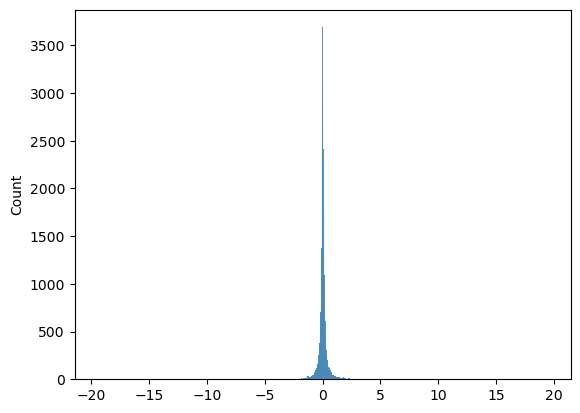

In [47]:
seaborn.histplot(ds_wilc["logfc"].data.flatten())

In [48]:
cond = (ds_wilc["logfc"] > 1) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].mean('organism').max('Group_propagated')>0.2)

mask_any = cond.any(dim="species")  # dims: contrast × var

up_union_genes = {
    str(c): ds_wilc["var"].where(mask_any.sel(contrast=c), drop=True).values.tolist()
    for c in ds_wilc["contrast"].values
}

cond = (ds_wilc["logfc"] < -1) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].mean('organism').max('Group_propagated')>0.2)

mask_any = cond.any(dim="species")  # dims: contrast × var

down_union_genes = {
    str(c): ds_wilc["var"].where(mask_any.sel(contrast=c), drop=True).values.tolist()
    for c in ds_wilc["contrast"].values
}



In [49]:
path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/de_mts/gradients/"

dfs = {}
for fname in os.listdir(path):
    if fname.endswith("_spatial_genes_corr.csv"):
        species = fname.replace("_spatial_genes_corr.csv", "")
        fpath = os.path.join(path, fname)
        dfs[species] = pd.read_csv(fpath,index_col=0)


In [50]:
spatial_correlations = xr.DataArray(np.stack([x.to_numpy() for x in dfs.values()],0),dims=[species_key,'var','proxy'],coords={species_key:list(dfs.keys()),'var':dfs['Mouse'].index,'proxy':dfs['Mouse'].columns})

In [51]:
spatial_correlations

<xarray.DataArray (organism: 4, var: 15466, proxy: 8)> Size: 4MB
array([[[-1.32371495e-03, -7.24862787e-02, -4.94076995e-03, ...,
          2.60778641e-02,  2.45791497e-02, -8.81468625e-02],
        [-6.89672868e-04,  2.51620805e-02,  5.63040593e-03, ...,
          7.26902029e-03, -1.08959261e-02,  4.43515273e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 1.14133282e-02,  1.22579792e-01, -9.22919118e-03, ...,
         -3.55959681e-02, -3.78363871e-02,  1.10101320e-01],
        [-7.64656236e-04,  4.11119226e-02, -4.56455727e-03, ...,
         -5.79438301e-04, -1.37555249e-02,  5.27276113e-02],
        [ 4.54371837e-03,  1.56570091e-01, -6.37957899e-02, ...,
          2.89245686e-02, -8.31635185e-02,  3.56277064e-01]],

       [[-3.74179882e-02, -9.01298087e-03, -3.29219269e-03, ...,
          4.09304199e-02,  6.60125812e-02, -4.08782818e-02],
        [ 2.18296442e-02,  3.20461848e-02, -3.19775489e-03, ...,
          4.01114831e-02,  3.58453701e-03,  6.95894415e-02],
        [-1.11526528e-03, -1.12832157e-03,  5.24083430e-03, ...,
          7.63449223e-03,  6.67056473e-03,  1.19796542e-03],
...
        [ 7.13200650e-03,  2.30511800e-03,  3.03460626e-02, ...,
          3.08625771e-02,  2.26236501e-02, -3.68281627e-04],
        [ 3.35133388e-02,  3.24508226e-02, -1.55095743e-02, ...,
         -7.83613685e-03, -3.12424311e-02,  7.75936223e-02],
        [ 5.06733928e-02,  6.95801254e-02,  1.50960942e-04, ...,
         -1.37203652e-02, -5.69260757e-02,  1.51862338e-01]],

       [[-5.47576022e-02,  1.59863451e-02, -6.67681676e-02, ...,
          2.47755247e-02, -8.65346575e-04, -5.52096520e-02],
        [ 3.02291217e-03,  4.10038381e-03,  1.77818310e-02, ...,
          9.92965577e-03,  1.45770651e-02,  1.89401864e-03],
        [ 5.81684311e-06,  4.39117811e-03, -1.76199713e-03, ...,
         -8.51483965e-05, -2.28671829e-04,  3.88565666e-05],
        ...,
        [-9.04632342e-03, -9.33034713e-03,  1.69168502e-02, ...,
          3.13691837e-02,  2.87059708e-02, -1.51629796e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 2.98857635e-02,  2.16417886e-02, -5.05502586e-02, ...,
          1.41676606e-02, -2.47823994e-02,  3.11009417e-01]]])
Coordinates:
  * organism  (organism) <U8 128B 'Mouse' 'Macaque' 'Marmoset' 'Human'
  * var       (var) object 124kB 'TLE2' 'TRADD' ... 'PTPRCAP' 'LOC101337707'
  * proxy     (proxy) object 64B 'TESPA1' 'CNR1' ... 'ARHGAP6' 'PPP1R1B'

In [52]:
mask_any.sum('var')

<xarray.DataArray (contrast: 2)> Size: 16B
array([321, 237])
Coordinates:
  * contrast  (contrast) object 16B 'Striosome_vs_Matrix' 'D1_vs_D2'
    col       (contrast) object 16B 'striosome' 'd1d2'
    case      (contrast) object 16B 'Striosome' 'D1'
    ref       (contrast) object 16B 'Matrix' 'D2'

In [53]:
print(np.quantile(np.abs(spatial_correlations).max('organism'),0.3,axis=0))
cond = (np.abs(spatial_correlations) > 0.3) & (ads['proportions'].mean('organism').max('Group_propagated')>0.2)

mask_any = cond.any(dim=species_key)  # dims: contrast × var

spatial_genes = {
    str(c): pd.Series(spatial_correlations.sel(var=spatial_correlations["var"].where(mask_any.sel(proxy=c), drop=True).values.tolist()).mean('organism').values.tolist(),index=spatial_correlations["var"].where(mask_any.sel(proxy=c), drop=True).values.tolist())
    for c in spatial_correlations["proxy"].values
}


[0.02062804 0.02802477 0.02071632 0.02401232 0.03251934 0.02897572
 0.02546369 0.03824126]


In [54]:
(spatial_correlations.sel(proxy='TESPA1').max('organism')>0.3).sum()

<xarray.DataArray ()> Size: 8B
array(112)
Coordinates:
    proxy    <U6 24B 'TESPA1'

In [55]:
df = spatial_correlations.mean('organism').to_dataframe(name='').unstack().droplevel(0,axis=1)
for c in df.columns:
    print(df[c].sort_values())

var
LSAMP     -0.298186
GALNTL6   -0.290492
CADM1     -0.287319
BRINP3    -0.268690
ROBO1     -0.266796
             ...   
PRKCB      0.294808
ZNF385B    0.303124
LDLRAD4    0.317061
SRGAP1     0.322422
TESPA1     1.000000
Name: TESPA1, Length: 15466, dtype: float64
var
PDE4D     -0.354485
UNC5D     -0.333246
CADM1     -0.331246
PRKG1     -0.327831
PDE1A     -0.307046
             ...   
RELN       0.413268
ZNF385B    0.440427
HS6ST3     0.442037
PDE10A     0.445115
CNR1       1.000000
Name: CNR1, Length: 15466, dtype: float64
var
PDE10A       -0.336811
OPCML        -0.315299
PLCB1        -0.289857
NRGN         -0.287466
ZNF385B      -0.278627
                ...   
NEGR1         0.307225
GULP1         0.314266
AK5           0.314604
CADM1         0.357887
ST6GALNAC5    1.000000
Name: ST6GALNAC5, Length: 15466, dtype: float64
var
PLCB1     -0.315308
PDE10A    -0.296007
RYR3      -0.269483
ZNF385B   -0.254469
GPRIN3    -0.228078
             ...   
CADM1      0.271865
CNTNAP5    0.2793

In [56]:
df.to_csv(os.path.join(table_dir,'xsmean_correlations_spatial_proxy.csv'))

In [57]:
spatial_correlations.sel(var=['CSGALNACT1','RASGRF2']).mean('organism').to_dataframe(name='').unstack().droplevel(0,axis=1)


proxy,TESPA1,CNR1,ST6GALNAC5,GDA,CRYM,WFS1,ARHGAP6,PPP1R1B
var,,,,,,,,
CSGALNACT1,-0.189364,-0.305357,0.183931,0.179066,0.051383,0.215684,0.334554,-0.279136
RASGRF2,0.079938,0.003902,0.050407,0.109984,0.067281,0.121734,0.107447,-0.005723


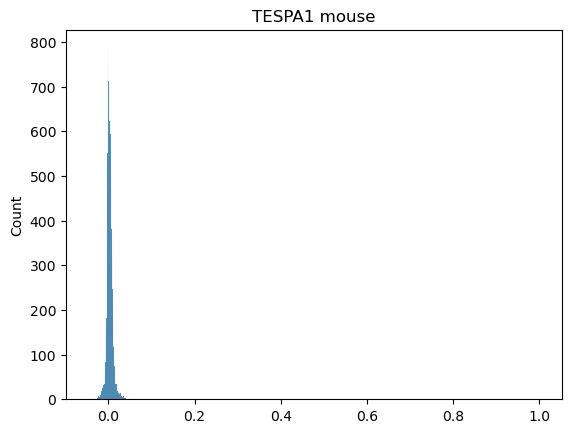

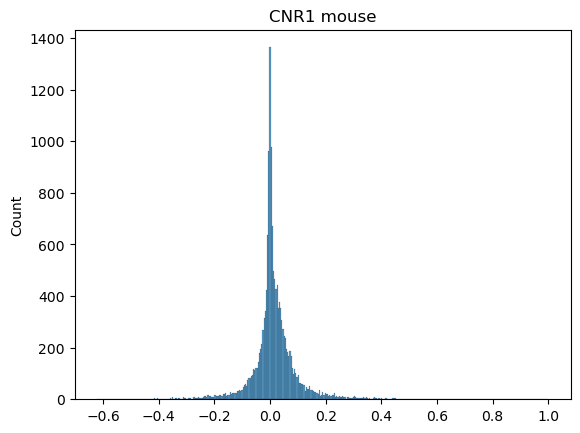

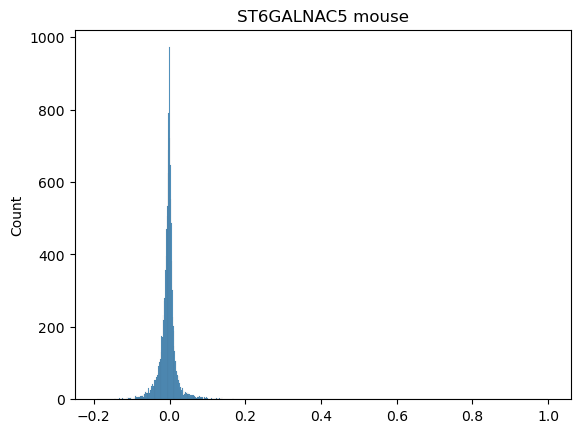

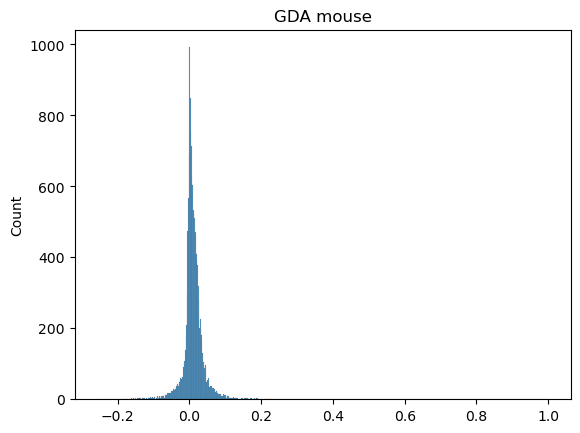

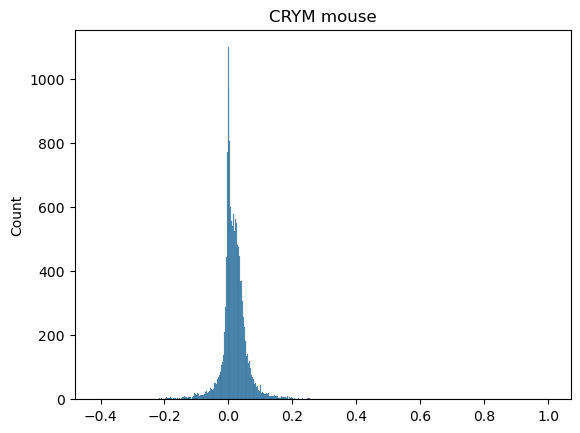

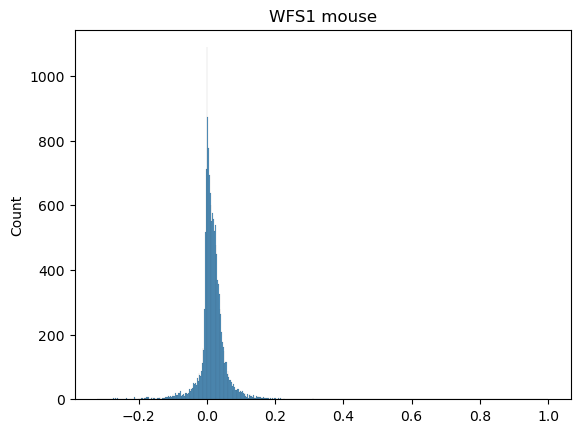

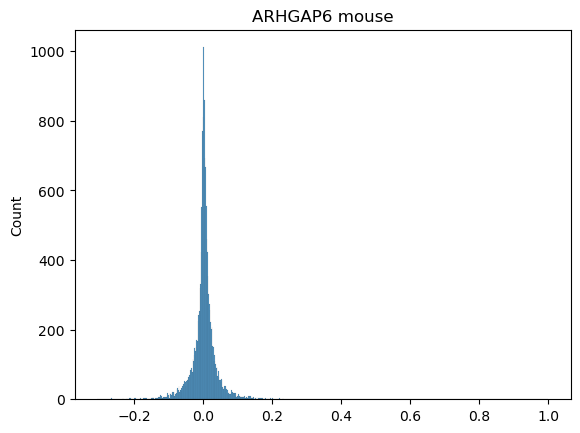

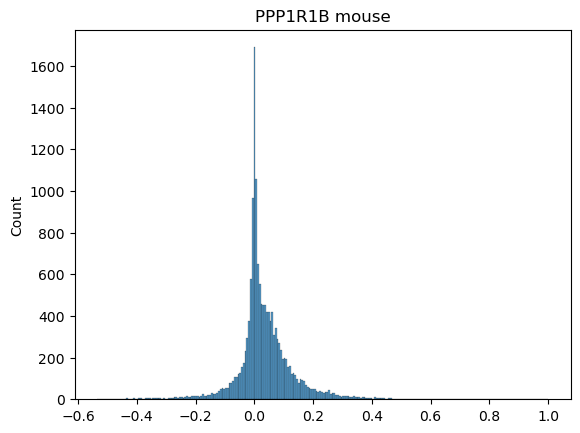

In [58]:
for g in spatial_correlations.coords['proxy'].data:
    seaborn.histplot(spatial_correlations.sel(proxy=g,organism='Mouse').data)
    plt.title(f'{g} mouse')
    plt.show()

In [59]:
print(len(up_union_genes['Striosome_vs_Matrix']))
print(len(up_union_genes['D1_vs_D2']))
print(len(down_union_genes['Striosome_vs_Matrix']))
print(len(down_union_genes['D1_vs_D2']))
print(len(spatial_genes['TESPA1']))
print(len(spatial_genes['CNR1']))

449
275
321
237
169
398


In [60]:
# sc.pl.embedding(adata,color=up_union_genes['Striosome_vs_Matrix'][:4],basis='X_umap',legend_loc='on data',cmap='Purples')
# sc.pl.embedding(adata,color=down_union_genes['Striosome_vs_Matrix'][:4],basis='X_umap',legend_loc='on data',cmap='Purples')

In [61]:
# sc.pl.embedding(adata,color=up_union_genes['D1_vs_D2'][:4],basis='X_umap',legend_loc='on data',cmap='Purples')
# sc.pl.embedding(adata,color=down_union_genes['D1_vs_D2'][:4],basis='X_umap',legend_loc='on data',cmap='Purples')

In [62]:
ads = xr.open_dataset(os.path.join(table_dir, "species_group_means_hqrm.netcdf"), engine="scipy")
lfc = (ads['scalars'].sel({'organism':['Human','Macaque','Marmoset','Mouse']}) - ads['scalars'].sel({'organism':['Human','Macaque','Marmoset','Mouse']}).mean(species_key)) # .sel({'organism':['Human','Macaque','Marmoset']})

In [63]:
msn_ads = ads.sel({leaf_key:ads.coords[leaf_key][ads.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]})

In [64]:
msn_var_genes = msn_ads.coords['var'].data[msn_ads['scalars'].std(leaf_key).min(species_key).argsort()][-5000:]

5000
342
656
459


/scratch/fast/4386645/ipykernel_2869982/2214674184.py:33: UserWarning: The palette list has more values (44) than needed (9), which may not be intended.
  seaborn.boxplot(


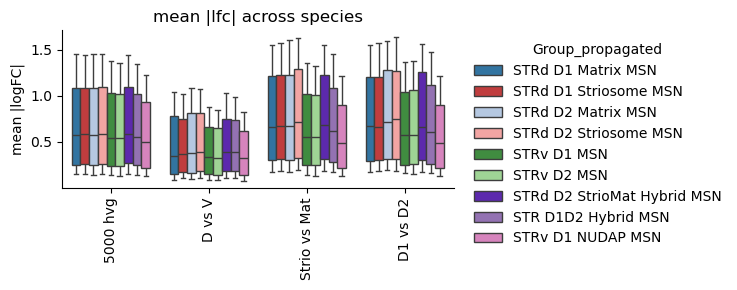

In [65]:
lfc_da = lfc.sel({leaf_key:lfc.coords[leaf_key][lfc.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]})
genes_all = set(lfc_da.coords["var"].values.tolist())
groups = lfc_da.coords["Group_propagated"].values.tolist()

lists = {
    "5000 hvg": lfc.coords['var'].data,
    "D vs V": list(spatial_genes["CNR1"].index),#
    "Strio vs Mat":   up_union_genes["Striosome_vs_Matrix"] + down_union_genes["Striosome_vs_Matrix"],
    "D1 vs D2":          up_union_genes["D1_vs_D2"] + down_union_genes["D1_vs_D2"],
    # "TESPA1 spatial":       spatial_genes["TESPA1"],
    # "CNR1 spatial":         spatial_genes["CNR1"],
}

records = []
for lname, glist in lists.items():
    keep = list(set(genes_all.intersection(glist))&set(msn_var_genes))
    print(len(keep))
    if not keep:
        continue
    sel = lfc_da.sel(var=keep).astype(float).pipe(np.abs)  # dims: organism × Group_propagated × var
    # pool across species & genes -> per-group distributions
    for g in groups:
        v = sel.sel(Group_propagated=g).values.reshape(-1)
        v = v[np.isfinite(v)]
        if v.size:
            records.extend((lname, g, x) for x in v)

df = pd.DataFrame(records, columns=["list", "Group_propagated", "abs_lfc"])
if df.empty:
    print("No overlapping genes found between lists and DataArray vars.")
else:
    fig, ax = plt.subplots(figsize=(1.9 * df["list"].nunique(), 3))
    seaborn.boxplot(
        data=df,
        x="list",
        y="abs_lfc",
        hue="Group_propagated",
        palette=adata.uns['Group_colors'],
        whis=(15, 85),
        showfliers=False,
        ax=ax
    )
    ax.set_ylabel("mean |logFC|")
    ax.set_xlabel("")
    ax.spines[['right', 'top']].set_visible(False)
    plt.xticks(rotation=90)
    ax.set_title("mean |lfc| across species")
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", title="Group_propagated", frameon=False)
    plt.tight_layout()
    plt.savefig(os.path.join(sc.settings.figdir,'abs_lfc_vs_gene_lists.pdf'),  bbox_inches="tight")
    plt.show()


<Axes: >

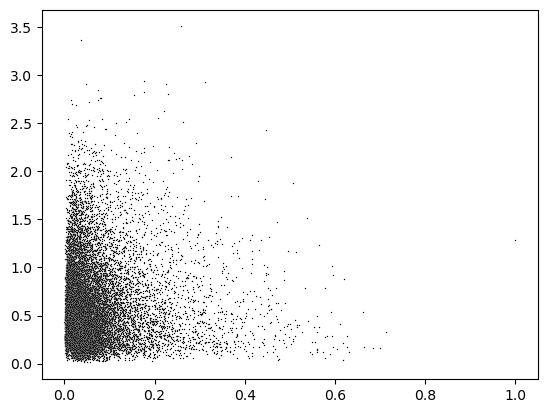

In [66]:
seaborn.scatterplot(x=np.abs(spatial_correlations).max('organism').sel(proxy='CNR1').data,y=np.abs(lfc_da).mean('organism').sel(Group_propagated='STRd D1 Matrix MSN').data,s=1,c='black')

In [67]:
lfc_da.mean('organism').mean('Group_propagated')

<xarray.DataArray 'scalars' (var: 15466)> Size: 124kB
array([-9.86864911e-17, -9.86864911e-17, -4.93432455e-16, ...,
       -3.94745964e-16,  1.97372982e-16, -2.46716228e-16])
Coordinates:
  * var      (var) object 124kB 'TLE2' 'TRADD' ... 'PTPRCAP' 'LOC101337707'

In [68]:
vcs = adata.obs.groupby('organism')['Group_propagated'].value_counts().unstack()
vcs.loc[:,vcs.columns.str.contains('OB|SN')]

/scratch/fast/4386645/ipykernel_2869982/704069934.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  vcs = adata.obs.groupby('organism')['Group_propagated'].value_counts().unstack()


Group_propagated,STRd D1 Matrix MSN,STRd D1 Striosome MSN,STRd D2 Matrix MSN,STRd D2 Striosome MSN,STRv D1 MSN,STRv D2 MSN,STRd D2 StrioMat Hybrid MSN,STR D1D2 Hybrid MSN,STRv D1 NUDAP MSN,SN SEMA5A GABA,SN EBF2 GABA,OB FRMD7 GABA,OB Dopa-GABA,SN GATA3-PVALB GABA,SN-VTR-HTH GATA3-TCF7L2 GABA,SN GATA3-PAX8 GABA,SN-VTR GAD2 Dopa,SN SOX6 Dopa,SN-VTR CALB1 Dopa
organism,,,,,,,,,,,,,,,,,,,
Human,122353,36816,131276,31146,38739,37591,7627,27505,14982,393,483,881,65,42,1951,0,212,2335,108
Macaque,67381,21223,83269,20040,30594,21392,4782,18050,11524,0,0,415,273,907,1445,1365,136,3770,110
Marmoset,31781,6989,30452,5461,12423,12145,1074,5946,8444,244,533,288,65,188,3504,970,476,688,940
Mouse,15755,4986,12420,3429,13590,7745,1440,2841,13858,0,19,15,158,1617,1141,4794,1366,3171,2305


In [69]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn  # do not alias as sns

def plot_abs_lfc_lists_per_contrast(
    deds, 
    gene_lists,                 # dict: {list_name: [genes]}
    padj_thresh=None,           # e.g. 0.01 to only include significant entries; None = no filter
    save_dir=None,              # e.g. "/path/to/figs"; None = don't save
    show=True                   # True = plt.show(); False = skip showing
):
    genes_all = set(deds.coords["gene"].values.tolist())
    groups = deds.coords["Group_propagated"].values.tolist()
    contrasts = deds.coords["contrast"].values.tolist()

    for c in contrasts:
        lfc = deds["lfc"].sel(contrast=c)  # dims: Group_propagated × gene
        if padj_thresh is not None and "padj" in deds:
            sig = (deds["padj"].sel(contrast=c) < padj_thresh)
            lfc = lfc.where(sig)

        records = []
        for lname, glist in gene_lists.items():
            # keep = list(genes_all.intersection(glist))
            keep = list(set(genes_all.intersection(glist))&set(msn_var_genes))
            if not keep:
                continue
            sel = lfc.sel(gene=keep).astype(float).pipe(np.abs)  # Group_propagated × gene
            for g in groups:
                v = sel.sel(Group_propagated=g).values.reshape(-1)
                v = v[np.isfinite(v)]
                if v.size:
                    records.extend((c, lname, g, x) for x in v)

        df = pd.DataFrame(records, columns=["contrast", "list", "Group_propagated", "abs_lfc"])
        if df.empty:
            print(f"[{c}] no data (empty after filters or no gene overlap).")
            continue

        fig, ax = plt.subplots(figsize=(1.6 * df["list"].nunique(), 5))
        seaborn.boxplot(
            data=df,
            x="list",
            y="abs_lfc",
            hue="Group_propagated",
            showfliers=False,
            ax=ax
        )
        ax.set_title(f"|logFC| per list, colored by Group_propagated\ncontrast = {c}" + (f", padj<{padj_thresh}" if padj_thresh else ""))
        ax.set_xlabel("")
        ax.set_ylabel("|logFC|")
        ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", title="Group_propagated", frameon=False)
        plt.xticks(rotation=90)
        plt.tight_layout()

        if save_dir is not None:
            os.makedirs(save_dir, exist_ok=True)
            fn = os.path.join(save_dir, f"abs_lfc_boxplot_{str(c).replace(' ', '_').replace('/', '-')}.png")
            plt.savefig(fn, dpi=200, bbox_inches="tight")
        if show:
            plt.show()
        else:
            plt.close(fig)

# --- example usage ---
lists = {
    "all genes": lfc.coords['var'].data,
    "Strio_vs_Matrix":   up_union_genes["Striosome_vs_Matrix"] + down_union_genes["Striosome_vs_Matrix"],
    "D1_vs_D2":          up_union_genes["D1_vs_D2"] + down_union_genes["D1_vs_D2"],
    # "spatial": spatial_genes["TESPA1"]+ spatial_genes["CNR1"]
    "TESPA1 spatial":       spatial_genes["TESPA1"],
    "CNR1 spatial":         spatial_genes["CNR1"],
}

# Plot all contrasts in `deds`, filtering by significance:
plot_abs_lfc_lists_per_contrast(
    deds.sel({leaf_key:deds.coords[leaf_key][deds.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]}),
    gene_lists=lists,
    padj_thresh=0.01,          # set None to include all
    save_dir=None,             # or "/path/to/figs"
    show=True
)


NameError: name 'deds' is not defined

In [ ]:
print(len(up_union_genes['D1_vs_D2']))
print(len(down_union_genes['D1_vs_D2']))


In [ ]:
print(set(up_union_genes['D1_vs_D2']) & set(tf_list))
print(set(down_union_genes['D1_vs_D2']) & set(tf_list))


In [ ]:
ds_wilc = ds_wilc.rename_dims({'species':'organism'})
ds_wilc = ds_wilc.rename_vars({'species':'organism'})

In [ ]:

cond = (ds_wilc["logfc"] > 1.5) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].mean('organism').max('Group_propagated')>0.2)

mask_any = cond.all(dim="organism")  # dims: contrast × var

d1_intersect_genes = {
    str(c): ds_wilc["var"].where(mask_any.sel(contrast=c), drop=True).values.tolist()
    for c in ds_wilc["contrast"].values
}


cond = (ds_wilc["logfc"] < -1.5) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].mean('organism').max('Group_propagated')>0.2)

mask_any = cond.all(dim="organism")  # dims: contrast × var

d2_intersect_genes = {
    str(c): ds_wilc["var"].where(mask_any.sel(contrast=c), drop=True).values.tolist()
    for c in ds_wilc["contrast"].values
}


In [ ]:
set(d1_intersect_genes['D1_vs_D2']) & set(tf_list)

In [ ]:
set(d2_intersect_genes['D1_vs_D2']) & set(tf_list)

In [94]:
sc.pl.embedding(adata,color=list(set(d1_intersect_genes['D1_vs_D2']) & set(tf_list)),basis='X_umap',legend_loc='on data',cmap='Purples')
sc.pl.embedding(adata,color=list(set(d2_intersect_genes['D1_vs_D2']) & set(tf_list)),basis='X_umap',legend_loc='on data',cmap='Purples')

KeyboardInterrupt: 

<Figure size 2911.2x480 with 0 Axes>

In [ ]:
sc.pl.embedding(adata,color=list(set(d1_intersect_genes['Striosome_vs_Matrix']) & set(tf_list)),basis='X_umap',legend_loc='on data',cmap='Purples')
sc.pl.embedding(adata,color=list(set(d2_intersect_genes['Striosome_vs_Matrix']) & set(tf_list)),basis='X_umap',legend_loc='on data',cmap='Purples')

In [95]:
for species in ds_wilc.coords['organism'].data:

    cond = (ds_wilc["logfc"] > 1.5) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].sel({'organism':species,leaf_key:ads.coords[leaf_key][ads.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]}).max('Group_propagated')>0.2)
    cond = cond.sel({'organism':species})
    d1_intersect_genes = {
        str(c): ds_wilc["var"].where(cond.sel(contrast=c), drop=True).values.tolist()
        for c in ds_wilc["contrast"].values
    }
    
    cond = (ds_wilc["logfc"] < -1.5) & (ds_wilc["padj"] < 0.01) & (ads['proportions'].sel({'organism':species,leaf_key:ads.coords[leaf_key][ads.coords[leaf_key].str.contains('D1.+MSN|D2.+MSN|NUDAP',regex=True)]}).max('Group_propagated')>0.2)
    cond = cond.sel({'organism':species})
    d2_intersect_genes = {
        str(c): ds_wilc["var"].where(cond.sel(contrast=c), drop=True).values.tolist()
        for c in ds_wilc["contrast"].values
    }
    os.makedirs(os.path.join(table_dir,'d1d2_comparison'),exist_ok=True)
    pd.Series(d1_intersect_genes['D1_vs_D2']).to_csv(os.path.join(table_dir,'d1d2_comparison',f'd1-specific_{species}_genes.csv'),index=False,header=False)
    pd.Series(d2_intersect_genes['D1_vs_D2']).to_csv(os.path.join(table_dir,'d1d2_comparison',f'd2-specific_{species}_genes.csv'),index=False,header=False)
    print(list(set(d1_intersect_genes['D1_vs_D2'])& set(tf_list)))
    print(list(set(d2_intersect_genes['D1_vs_D2'])& set(tf_list)))
    pd.Series(list(set(d1_intersect_genes['D1_vs_D2'])& set(tf_list))).to_csv(os.path.join(table_dir,'d1d2_comparison',f'd1-specific_{species}_tfs.csv'),index=False,header=False)
    pd.Series(list(set(d2_intersect_genes['D1_vs_D2']) & set(tf_list))).to_csv(os.path.join(table_dir,'d1d2_comparison',f'd2-specific_{species}_tfs.csv'),index=False,header=False)

['SOX1', 'EBF1', 'FOXP2', 'ISL1']
['CASZ1', 'POU6F2', 'SOX2', 'SP9']
['ETV1', 'EBF1', 'FOXP2', 'ISL1']
['TEAD1', 'SP9']
['ISL1', 'EBF1', 'FOXP2', 'ZNF521']
['SP9', 'DACH2', 'SOX2', 'MEIS3', 'ZNF804B']
['CPEB1', 'ISL1', 'EBF1', 'FOXP2', 'ZNF521', 'TSHZ2']
['SP9', 'MEIS1', 'PAX6', 'SOX2', 'ZNF804B']


In [ ]:
ds_wilc